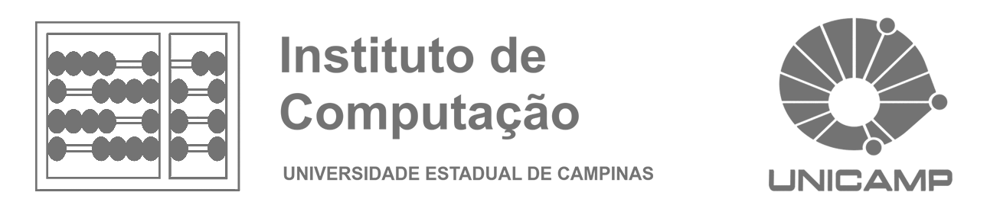

INSTITUTO DE COMPUTAÇÃO - UNICAMP

---

Deep Learning - MO434

Prof. Dr. Alexandre Xavier Falcão

---

**A Comparative Study of Knowledge Distillation Schemes from Pretrained Image Classifiers into a Lightweight ConvNet**

**Aluna:** Maiara Araujo Damião - RA 291674

---
IC/UNICAMP (2026)

# 1. Introdução e Especificação do Problema
# A Comparative Study of Knowledge Distillation Schemes from Pretrained Image Classifiers into a Lightweight ConvNet

Modern image classifiers — VGG [1], ResNet [2], ConvNeXt [3] — share a common macro-structure: an encoder that produces a spatial feature map, a global average pooling (GAP) that collapses spatial dimensions, and a linear classifier.

Knowledge distillation [4, 5] exploits this structure by training a smaller student to imitate intermediate representations of the pretrained teacher on ImageNet. Train the teacher’s classifier with its encoder frozen. Fine-tuning may be used, but it must preserve the encoder’s ImageNet knowledge.

The original distillation formulation of [4] matches the logits of the teacher and student through a softened cross-entropy. FitNets [5] extended this idea to intermediate feature maps using hint layers. Attention transfer [6] aligns spatial attention maps, while more recent methods, such as relational knowledge distillation [7], match pairwise relations among samples.

The setup of this project is closest to FitNets (feature-map variant) and to logit-free representation distillation (pooled-output variant), with an additional cross-entropy term on the student’s representation to keep the predictions aligned with the labels.

The project involves three phases:

(1) train the teacher’s classifier with its encoder frozen. Fine-tuning may be used, but it must preserve the encoder’s ImageNet knowledge;

(2) train the student’s encoder+predictor using the same pretrained classifier of phase 1;

(3) test the student’s model with the same pretrained classifier of phase 1.

By forming groups of at most two people, the groups should address the following questions using multiple datasets (e.g., at least two) of their choice for image classification:

1. Which teacher transfers best?
Different backbones learn different features; the ease of imitation and the final classification accuracy may depend strongly on the teacher.

2. What should the student predict?
The pre-GAP feature maps (7×7×C) or the post-GAP pooled vector (C-dimensional)? Note that the student’s encoder is followed by a predictor, whose architecture could use convolutional blocks to predict the teacher’s pre-GAP feature maps or dense blocks to predict the post-GAP pooled vector.

3. What are the best architectures for the student’s encoder + predictor?
The final model should considerably save GFLOPS and parameters as compared to the teacher.

4. What should we use as a loss function?
You may combine the MSE of the predictor and the cross-entropy of the classifier.

5. What can you learn and use in this project from the literature of knowledge distillation?
You may compare and/or adapt your models to the scheme proposed in [7].

# 2. Solução

## Bibliotecas usadas

O algoritmo foi implementado em Python, utilizando o ambiente Google Colab. A execução contou com as seguintes bibliotecas, cujas versões estão listadas abaixo.

In [ ]:
!pip install grad-cam torchsummary thop -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 83.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
import sys
print("Python version:", sys.version)

import numpy as np
import re

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Subset, DataLoader

import torchvision
from torchvision import datasets, transforms, models

from pytorch_grad_cam import GradCAM, HiResCAM, GradCAMPlusPlus, EigenGradCAM, LayerCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image

import sklearn
#from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import (
    classification_report, f1_score, precision_score, recall_score,
    top_k_accuracy_score, confusion_matrix, ConfusionMatrixDisplay,
    cohen_kappa_score
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap

import copy
import os
import cv2

from torchsummary import summary

# GFLOPs
from thop import profile

print("\nLibrary versions:")
print("NumPy:", np.__version__)
print("PyTorch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Sklearn:", sklearn.__version__)

Python version: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]

Library versions:
NumPy: 2.0.2
PyTorch: 2.11.0+cu128
Torchvision: 0.26.0+cu128
Matplotlib: 3.10.0
Sklearn: 1.6.1


## Escolha das bibliotecas

* **NumPy**: biblioteca otimizada para operações numéricas, incluindo suporte para grandes vetores e matrizes multidimensionais. O numpy usa código otimizado em C e Fortran, ao invés de Python, o que garante um desempenho superior do que o Python puro.
  * Página da documentação oficial: http://www.numpy.org/

* **Matplotlib**: biblioteca para geração de gráficos, histogramas, gráficos de barras, gráficos de dispersão, entre vários outros recursos gráficos. Para meu código irei usar o comando `imshow()`. Também foi usada para exibir curvas de treinamento, matrizes de confusão e mapas de atenção gerados durante a análise.
  * Página da documentação oficial: http://matplotlib.org/

* **PyTorch**: framework de *deep learning* de código aberto utilizado para construção e treinamento de redes neurais. No meu trabalho ele foi a base principal de implementação, sendo usado para definição das arquiteturas, operações de treinamento, cálculo das funções de perda, inferência em GPU e manipulação de tensores multidimensionais.
  * Página da documentação oficial: https://docs.pytorch.org/docs/2.11/index.html

* **Torchvision**: extensão do PyTorch voltada para visão computacional. Foi utilizada para carregamento dos datasets com ImageFolder, criação de transformações de pré-processamento e data augmentation (Resize, RandomAffine, Normalize) e acesso a arquiteturas pré-treinadas em ImageNet, como ResNet50, EfficientNet-B5 e ConvNeXt-Base.
  * Página da documentação oficial: https://pytorch.org/vision/stable/index.html

* **scikit-learn**: biblioteca de aprendizado de máquina utilizada no meu código para avaliação quantitativa dos modelos. Foi empregada no cálculo da matriz de confusão (confusion_matrix) e em sua visualização (ConfusionMatrixDisplay) e o t-SNE para Visualização de dados.
  * Página da documentação oficial: https://scikit-learn.org/stable/

* **pytorch-grad-cam**: biblioteca de interpretabilidade (Explainable AI — XAI) utilizada para gerar mapas de ativação baseados em gradiente.
  * Página da documentação oficial: https://github.com/jacobgil/pytorch-grad-cam

* **torchsummary**: biblioteca auxiliar para inspeção estrutural das redes neurais. Foi utilizada para exibir a arquitetura dos modelos, dimensões intermediárias dos tensores e número de parâmetros treináveis.
  * Página oficial: https://github.com/sksq96/pytorch-summary

* **Pillow (PIL)**: biblioteca de processamento de imagens utilizada como apoio nas operações de conversão, redimensionamento e manipulação visual. Foi útil principalmente na construção e no ajuste dos mapas de atenção e das imagens sobrepostas geradas durante a etapa de interpretabilidade.
  * Página oficial: https://github.com/Lyken17/pytorch-OpCounter

* **THOP**:  biblioteca utilizada para estimativa do custo computacional das arquiteturas por meio da contagem de FLOPs (floating point operations).
  * Página oficial: https://github.com/Lyken17/pytorch-OpCounter

* **OpenCV (cv2)**:  biblioteca de visão computacional utilizada como apoio em operações auxiliares de manipulação e compatibilidade de imagens.
  * Página da documentação oficial: https://opencv.org/

Define qual será o device, se tiver disponível cuda, usa cuda.

In [ ]:
# ──────────────────────────────────────────────────────────
# Dispositivo
# ──────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Hiperparâmetros

In [ ]:
# ──────────────────────────────────────────────────────────
# Hiperparâmetros globais
# ──────────────────────────────────────────────────────────
SEED = 12
torch.manual_seed(SEED) # Do próprio https://docs.pytorch.org/tutorials/beginner/knowledge_distillation_tutorial.html
np.random.seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

BATCH_SIZE      = 32
NUM_WORKERS     = 2
LR              = 1e-3
N_TRAIN         = 0.7
N_VAL           = 0.15
# Seleção do ID da imagem conforme o nome dela nas pastas
IMAGE_SAMPLE_NATURAL = 3204
IMAGE_SAMPLE_GARBAGE = 1450

# ──────────────────────────────────────────────────────────
# Hiperparâmetros Teacher
# ──────────────────────────────────────────────────────────
EPOCHS_TEACHER  = 10

# ──────────────────────────────────────────────────────────
# Hiperparâmetros Student
# ──────────────────────────────────────────────────────────
#EPOCHS_STUDENT  = 60
#EPOCHS_HINT     = 50      # Estágio 1 do FitNets

EPOCHS_STUDENT  = 100
EPOCHS_HINT     = 100      # Estágio 1 do FitNets

# ── Hiperparâmetros KD ─
TEMPERATURE_KD  = 4.0    # Temperatura para Hinton |  higher T produces softer distributions (try T=3, T=5, T=10)
KD_ALPHA = 0.7
BASE_LOSS_ALPHA = 0.5
# ── Hiperparâmetros AT ─
AT_ALPHA = 0.9 #9 AT original 90% da loss vem do teacher
AT_BETA = 1000.0
# ── Hiperparâmetros RKD ─
RKD_LAMBDA_D = 25.0 #25 RKD original
RKD_LAMBDA_A = 50.0 #50 RKD original

#STUDENT_BACKBONE = "resnet18"
STUDENT_BACKBONE = "lightcnn"

if STUDENT_BACKBONE == "resnet18":
    STUDENT_DIM             = 512    # ResNet18 pós-avgpool
    STUDENT_GUIDED_LAYER    = "layer3"
    STUDENT_GUIDED_CHANNELS = 256    # layer3 do ResNet18
elif STUDENT_BACKBONE == "lightcnn":
    STUDENT_DIM             = 512   # interface igual do ResNet18
    STUDENT_GUIDED_LAYER    = "block3"
    STUDENT_GUIDED_CHANNELS = 128   # canais na camada guiada (block3)

STUDENT_AT_FEAT_KEYS = {
    "resnet18":    ("ResNet18",   ["layer2",   "layer3",    "layer4"]),
    "lightcnn":    ("LightCNN",    ["block2",  "block3",  "block4"]),
}

Acessando o Google Drive para salvar os modelos

In [ ]:
# ──────────────────────────────────────────────────────────
# Google Drive
# ──────────────────────────────────────────────────────────
from google.colab import drive
drive.mount('/content/drive')
PATH = "/content/drive/My Drive/Colab Notebooks/MO434"

Mounted at /content/drive


## Biblioteca de Imagens usada

In [ ]:
# ──────────────────────────────────────────────────────────
# Kaggle instala e acessa
# ──────────────────────────────────────────────────────────
!pip install -q kaggle
!mkdir -p ~/.kaggle && echo KGAT_b8ebbeea69049704aeb16173a885dd6e > ~/.kaggle/access_token && chmod 600 ~/.kaggle/access_token

### Natural Imagens
This dataset contains 6.899 images from 8 distinct classes compiled from various sources. The classes include airplane, car, cat, dog, flower, fruit, motorbike and person. Available at [https://www.kaggle.com/datasets/prasunroy/natural-images](https://www.kaggle.com/datasets/prasunroy/natural-images)

In [ ]:
# ──────────────────────────────────────────────────────────
# Natural Imagens Dataset
# ──────────────────────────────────────────────────────────

!kaggle datasets download -d prasunroy/natural-images
!unzip -q natural-images.zip -d ./natural-images

Dataset URL: https://www.kaggle.com/datasets/prasunroy/natural-images
License(s): CC-BY-NC-SA-4.0
100% 342M/342M [00:02<00:00, 130MB/s]



In [ ]:
root = "./natural-images/natural_images"
print("Classes de natural images")
for item in os.listdir(root):
    print(item)

Classes de natural images
dog
person
motorbike
airplane
flower
cat
car
fruit


### Garbage Classification
This dataset has 15.150 images from 12 different classes of household garbage; paper, cardboard, biological, metal, plastic, green-glass, brown-glass, white-glass, clothes, shoes, batteries, and trash. Available at [https://www.kaggle.com/datasets/mostafaabla/garbage-classification](https://www.kaggle.com/datasets/mostafaabla/garbage-classification)



In [ ]:
# ──────────────────────────────────────────────────────────
# Garbage Imagens Dataset
# ──────────────────────────────────────────────────────────

!kaggle datasets download -d mostafaabla/garbage-classification
!unzip -q garbage-classification.zip -d ./garbage

Dataset URL: https://www.kaggle.com/datasets/mostafaabla/garbage-classification
License(s): ODbL-1.0
100% 239M/239M [00:01<00:00, 128MB/s]



In [ ]:
root = "./garbage/garbage_classification"
print("Classes de gargabe images")
for item in os.listdir(root):
    print(item)

Classes de gargabe images
trash
biological
white-glass
paper
cardboard
metal
brown-glass
green-glass
battery
shoes
clothes
plastic


In [ ]:
DATASET_NATURAL = "./natural-images/natural_images"
DATASET_GARBAGE = "./garbage/garbage_classification"

## Funções úteis

### Visualizar a grade

In [ ]:
# ──────────────────────────────────────────────────────────
# Visualização do dataset
# ──────────────────────────────────────────────────────────
def imshow_grid(images, labels, class_names, num_cols=4, mean=None, std=None):
    num_images = len(images)
    num_rows = int(np.ceil(num_images / num_cols))

    plt.figure(figsize=(num_cols * 4, num_rows * 4))

    for i in range(num_images):
        ax = plt.subplot(num_rows, num_cols, i + 1)

        img = images[i]

        if hasattr(img, "cpu"):
            img = img.cpu().numpy().transpose((1, 2, 0))
            # transpose((1,2,0)) faz exatamente o mesmo que permute(1,2,0)
        else:
            img = np.array(img) / 255.0

        if mean is not None and std is not None:
            img = img * np.array(std) + np.array(mean)

        img = np.clip(img, 0, 1)

        h, w = img.shape[:2]
        c = 1 if img.ndim == 2 else img.shape[2]
        color_mode = "RGB" if c == 3 else "Grayscale"

        ax.imshow(img)
        ax.set_title(
            f"{class_names[labels[i]]}\n{w}x{h} | {color_mode}",
            fontsize=18
        )
        ax.axis("off")

    plt.tight_layout()
    plt.show()

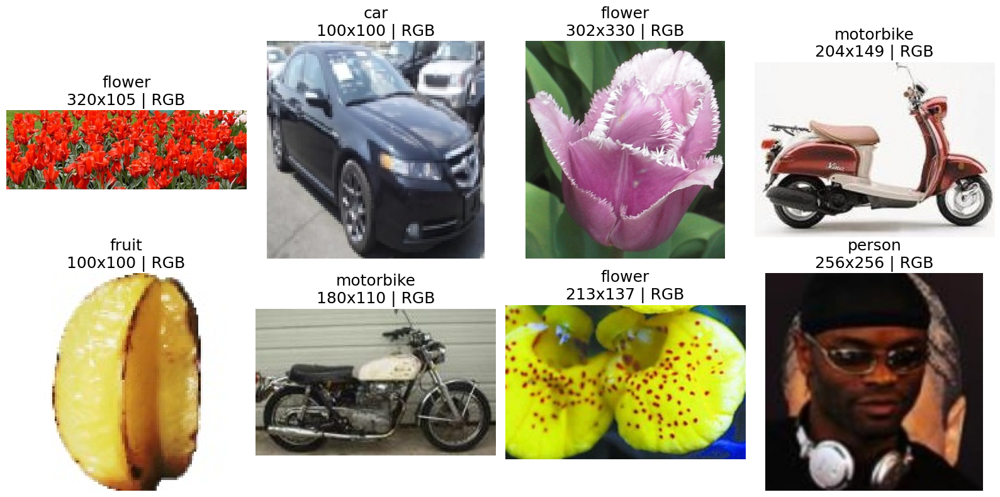

In [ ]:
# ──────────────────────────────────────────────────────────
# Visualização rápida da Natural
# ──────────────────────────────────────────────────────────
natural_dataset = datasets.ImageFolder(root=DATASET_NATURAL)
indices = np.random.choice(len(natural_dataset), 8, replace=False)

example_images = []
example_labels = []
for i in indices:
    img, label = natural_dataset[i]
    example_images.append(img)
    example_labels.append(label)

# Get class names from the dataset
class_names = natural_dataset.classes

# Display the grid
imshow_grid(example_images, example_labels, class_names)


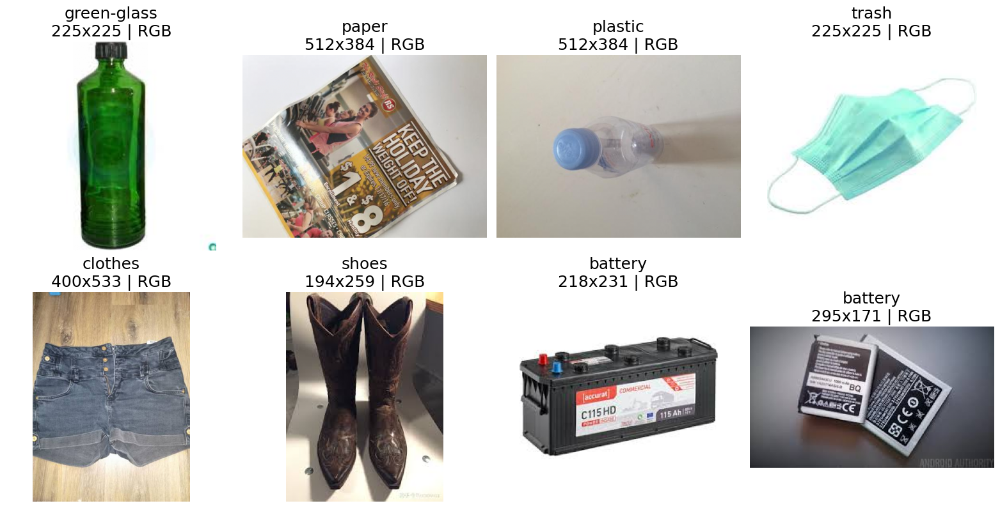

In [ ]:
# ──────────────────────────────────────────────────────────
# Visualização rápida da Garbage
# ──────────────────────────────────────────────────────────
garbage_dataset = datasets.ImageFolder(root=DATASET_GARBAGE)
indices = np.random.choice(len(garbage_dataset), 8, replace=False)

example_images_garbage = []
example_labels_garbage = []
for i in indices:
    img, label = garbage_dataset[i]
    example_images_garbage.append(img)
    example_labels_garbage.append(label)

# Get class names from the dataset
class_names_garbage = garbage_dataset.classes

# Display the grid for garbage dataset
imshow_grid(example_images_garbage, example_labels_garbage, class_names_garbage)


### Dataset Loaders e funções adicionais

In [ ]:
# ──────────────────────────────────────────────────────────
# DataLoaders já com normalização e também com a augmentation
# ──────────────────────────────────────────────────────────
def Dataset_Loaders(dataset_root, prep, aug):

    # Seed
    np.random.seed(SEED)

    # Dataset base SEM transform
    base_dataset = datasets.ImageFolder(root=dataset_root)

    n_total = len(base_dataset)
    indices = np.random.permutation(n_total)

    n_train = int(N_TRAIN * n_total)
    n_val = int(N_VAL * n_total)

    train_idx = indices[:n_train]
    val_idx = indices[n_train:n_train+n_val]
    test_idx = indices[n_train+n_val:]

    # Agora aplica transform em cima dos subsets
    train_dataset = datasets.ImageFolder(root=dataset_root, transform=aug)
    val_dataset   = datasets.ImageFolder(root=dataset_root, transform=prep)
    test_dataset  = datasets.ImageFolder(root=dataset_root, transform=prep)

    train_set = Subset(train_dataset, train_idx)
    val_set   = Subset(val_dataset, val_idx)
    test_set  = Subset(test_dataset, test_idx)

    train_loader = DataLoader(
        train_set,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS
    )
    val_loader = DataLoader(
        val_set,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS
    )
    test_loader = DataLoader(
        test_set,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS
    )

    print("Classes TRAIN:", train_dataset.classes)
    print("Classes VAL:", val_dataset.classes)
    print("Classes TEST:", test_dataset.classes)
    print("Train:", len(train_set))
    print("Val:", len(val_set))
    print("Test:", len(test_set))


    return train_loader, val_loader, test_loader, train_dataset.classes

In [ ]:
# ──────────────────────────────────────────────────────────
# Utilitários gerais
# ──────────────────────────────────────────────────────────
def print_model_tree(module, indent=0):
    prefix = "│   " * indent

    for name, child in module.named_children():
        print(f"{prefix}├── {name}: {child.__class__.__name__}")
        print_model_tree(child, indent + 1)

def plot_history(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(epochs, history["train_loss"], label="train")
    axes[0].plot(epochs, history["val_loss"], label="val")
    axes[0].set_xlabel("epoch")
    axes[0].set_ylabel("loss")
    axes[0].set_title("Loss")
    #axes[0].set_ylim(0, 1)
    axes[0].legend()

    axes[1].plot(epochs, history["train_acc"], label="train")
    axes[1].plot(epochs, history["val_acc"], label="val")
    axes[1].set_xlabel("epoch")
    axes[1].set_ylabel("accuracy")
    axes[1].set_title("Accuracy")
    #axes[1].set_ylim(0, 1)
    axes[1].legend()

    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(model, loader, class_names, device):
    model.eval()

    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            preds = logits.argmax(dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 8))
    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=class_names
    )

    disp.plot(cmap="Blues", xticks_rotation=45)

    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return cm

def count_params(model, trainable_only=False):
    return sum(p.numel() for p in model.parameters())

In [ ]:
def extract_pre_gap_features(model, x):

    # ConvNeXt / EfficientNet
    if hasattr(model, "features"):
        return model.features(x)

    # ResNet
    elif hasattr(model, "layer4"):

        x = model.conv1(x)
        x = model.bn1(x)
        x = model.relu(x)
        x = model.maxpool(x)

        x = model.layer1(x)
        x = model.layer2(x)
        x = model.layer3(x)
        x = model.layer4(x)

        return x

    else:
        raise ValueError("Arquitetura não suportada")

def visualize_feature_maps_pre_gap( model, DATASET, prep, classes, device, sample_idx=None,
                                            num_maps_to_show=8, start_channel=0, max_channels_grid=16):
    model = model.to(device)
    model.eval()

    dataset_full = datasets.ImageFolder(root=DATASET)

    if sample_idx is None:
        sample_idx = random.randint(0, len(dataset_full) - 1)

    original_img_pil, true_label_idx = dataset_full[sample_idx]

    processed_img = prep(original_img_pil)
    input_batch = processed_img.unsqueeze(0).to(device)

    with torch.no_grad():
        #feature_maps = model.features(input_batch)
         feature_maps = extract_pre_gap_features(model, input_batch)

    feature_maps = feature_maps.squeeze(0).cpu()

    print(f"Shape pré-GAP: {tuple(feature_maps.shape)}")
    print(f"Classe: {classes[true_label_idx]}")

    n = min(num_maps_to_show, feature_maps.shape[0])

    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.flatten()

    for i in range(num_maps_to_show):
        ax = axes[i]

        if i < n:
            channel_idx = start_channel + i
            fmap = feature_maps[channel_idx].numpy()

            im = ax.imshow(fmap, cmap="viridis")
            ax.set_title(
                f"Channel {channel_idx}/{feature_maps.shape[0]}\n"
                f"Min: {fmap.min():.2f}\n"
                f"Max: {fmap.max():.2f}",
                fontsize=9
            )
            ax.axis("off")
            plt.colorbar(im, ax=ax, shrink=0.7)

        else:
            ax.axis("off")
    plt.suptitle(f'Feature Maps - Canais 0-{num_maps_to_show} | Shape: {feature_maps.shape} (C, H, W)',
                 fontsize=14)
    plt.tight_layout()
    plt.show()

Para o XAI, segundo a própria documentação do 'pytorch-grad-cam' em [https://github.com/jacobgil/pytorch-grad-cam](https://github.com/jacobgil/pytorch-grad-cam):

Choosing the layer(s) to extract activations from
You need to choose the target layer to compute the CAM for. Some common choices are:
* Resnet18 and 50: model.layer4[-1]
* VGG, densenet161 and mobilenet: model.features[-1]

In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

# Definir o XAI target layer para não haver chamadas diferentes ao longo desse notebook
def get_xai_target_layer(model):
    if isinstance(model, torchvision.models.VGG):
        print("VGG - model.features[-1]")
        return model.features[-1]

    elif isinstance(model, torchvision.models.ResNet):
        print("ResNet - model.layer4[-1]")
        return model.layer4[-1]

    elif isinstance(model, torchvision.models.ConvNeXt):
        print("ConvNeXt - model.features[-1][-1]")
        #return model.features[-2][-1]
        return model.features[-1][-1]

    elif hasattr(model, 'encoder') and hasattr(model, 'predictor'):
        # Check if the encoder is a LightCNNEncoder
        if isinstance(model.encoder, LightCNNEncoder):
            print(f"encoder/predictor - LightCNNEncoder: model.encoder.head")
            return model.encoder.head
        # Otherwise, assume it's a ResNet-like encoder (nn.Sequential)
        else:
            try:
                print(f"encoder/predictor - model.encoder[7][-1] = layer4 do Resnet")
                return model.encoder[7][-1]
                #0 conv1
                #1 bn1
                #2 relu
                #3 maxpool
                #4 layer1
                #5 layer2
                #6 layer3
                #7 layer4 <---- 7 se ResNet18
                #8 avgpool
            except (IndexError, TypeError):
                # Fallback: find the last Conv2d in the encoder
                last_conv = None
                for module in model.encoder.modules():
                    if isinstance(module, nn.Conv2d):
                        last_conv = module
                if last_conv is not None:
                    print(f"encoder/predictor - fallback encoder (last Conv2d): {last_conv}")
                    return last_conv

                # Fallback: último Conv2d do predictor
                last_conv = None
                for module in model.predictor.modules():
                    if isinstance(module, nn.Conv2d):
                        last_conv = module
                if last_conv is not None:
                    print(f"encoder/predictor - fallback predictor: {last_conv}")
                    return last_conv
                raise ValueError("Não foi possível encontrar camada XAI no encoder nem no predictor.")

    elif isinstance(model, nn.Sequential):
        # Student encoder
        target_layer = None
        for module in model.modules():
            if isinstance(module, nn.Conv2d):
                target_layer = module   # guarda o último Conv2d encontrado
        print(f"nn.Sequential: {target_layer}")
        if target_layer is None:
            raise ValueError("Não foi possível encontrar camada XAI.")
        return target_layer

    else:
        target_layer = None
        for _, module in model.named_modules():
            if isinstance(module, nn.Conv2d):
                target_layer = module
        print(f"else: {target_layer}")
        if target_layer is None:
            raise ValueError("Não foi possível encontrar camada XAI.")
        return target_layer

### Attention Map

Usei `utils.py` em https://github.com/szagoruyko/attention-transfer/blob/master/utils.py para me basear.

```
def at(x):
    return F.normalize(x.pow(2).mean(1).view(x.size(0), -1))

def at_loss(x, y):
    return (at(x) - at(y)).pow(2).mean()
```

In [ ]:
# Mapa de atenção — Zagoruyko & Komodakis (2017) [6]
"""Paying More Attention to Attention: Improving the Performance of Convolutional Neural Networks
via Attention Transfer
code: https://github.com/szagoruyko/attention-transfer"""

def attention_map(feat):
    return F.normalize(feat.pow(2).mean(1).view(feat.size(0), -1), p=2, dim=1)

def get_attention_overlay(model, input_tensor, img_np, target_layer=None):
    model.eval()

    if target_layer is None:
        target_layer = get_xai_target_layer(model)

    acts = []

    def hook_fn(module, inputs, output):
        acts.append(output.detach().cpu())

    handle = target_layer.register_forward_hook(hook_fn)

    with torch.no_grad():
        _ = model(input_tensor)

    handle.remove()

    feat = acts[0]  # [B, C, H, W]

    # mean over channels
    amap = feat.pow(2).mean(1)[0].numpy() #utils.py

    amap = (amap - amap.min()) / (amap.max() - amap.min() + 1e-8)

    H, W = img_np.shape[:2]

    amap = np.array(Image.fromarray((amap * 255).astype(np.uint8)).resize((W, H), Image.BILINEAR)) / 255.0

    heat = plt.get_cmap("jet")(amap)[..., :3]

    overlay = np.clip(0.5 * img_np + 0.5 * heat, 0, 1)

    return overlay, amap

### Funções dos Modelos

In [ ]:
# ══════════════════════════════════════════════════════════
# FASE 1 — Teacher
# Treina apenas o classificador final
# mantendo o backbone ImageNet congelado
# ══════════════════════════════════════════════════════════
def train(
#def train_teacher(
    model,train_loader, val_loader, num_classes, prep,
    optimizer_option="Adam", criterion_option="CrossEntropy"
):

    # =====================================================
    # Congela backbone
    # =====================================================
    for p in model.parameters():
        p.requires_grad = False

    # =====================================================
    # Substitui classificador final
    # =====================================================
    if isinstance(model, torchvision.models.VGG):

        print("classifier ANTES =", model.classifier[-1])

        in_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_features, num_classes)

        classifier_params = model.classifier[-1].parameters()

        print("classifier DEPOIS =", model.classifier[-1])

    elif isinstance(model, torchvision.models.ResNet):

        print("classifier ANTES =", model.fc)

        in_features = model.fc.in_features
        model.fc = nn.Linear(in_features, num_classes)

        classifier_params = model.fc.parameters()

        print("classifier DEPOIS =", model.fc)

    elif isinstance(model, torchvision.models.EfficientNet):

        print("classifier ANTES =", model.classifier[-1])

        in_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_features, num_classes)

        classifier_params = model.classifier[-1].parameters()

        print("classifier DEPOIS =", model.classifier[-1])

    elif isinstance(model, torchvision.models.ConvNeXt):

        print("classifier ANTES =", model.classifier[-1])

        in_features = model.classifier[-1].in_features
        model.classifier[-1] = nn.Linear(in_features, num_classes)

        classifier_params = model.classifier[-1].parameters()

        print("classifier DEPOIS =", model.classifier[-1])

    else:
        raise ValueError(
            f"Arquitetura não suportada ainda: {type(model)}"
        )

    # =====================================================
    # Device
    # =====================================================
    model = model.to(device)

    # =====================================================
    # Summary
    # =====================================================
    print("##############################")

    crop_size = (
        prep.crop_size
        if isinstance(prep.crop_size, int)
        else prep.crop_size[0]
    )

    summary(
        model,
        input_size=(3, crop_size, crop_size)
    )

    # =====================================================
    # Loss
    # =====================================================
    if criterion_option == "CrossEntropy":

        criterion = nn.CrossEntropyLoss()

    elif criterion_option == "MSE":

        criterion = nn.MSELoss()

    else:
        raise ValueError(
            f"Criterion não suportada: {criterion_option}"
        )

    # =====================================================
    # Optimizer
    # =====================================================
    if optimizer_option == "Adam":

        optimizer = optim.Adam(
            classifier_params,
            lr=LR
        )

    elif optimizer_option == "SGD":

        optimizer = optim.SGD(
            classifier_params,
            lr=LR,
            momentum=0.9,
            weight_decay=1e-4
        )

    else:
        raise ValueError(
            f"Optimizer não suportado: {optimizer_option}"
        )

    # =====================================================
    # Histórico
    # =====================================================
    best_val_acc = 0.0
    best_val_loss = float("inf")
    best_epoch = 0
    best_state = copy.deepcopy(model.state_dict())

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],

        "best_val_acc": 0.0,
        "best_val_loss": 0.0,
        "best_epoch": 0
    }

    # =====================================================
    # Loop de treino
    # =====================================================
    for epoch in range(EPOCHS_TEACHER):

        # -------------------------------------------------
        # TRAIN
        # -------------------------------------------------
        model.train()

        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for images, labels in train_loader:

            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            logits = model(images)

            # =============================================
            # LOSS
            # =============================================
            if criterion_option == "MSE":

                probs = torch.softmax(logits, dim=1)

                labels_onehot = F.one_hot(
                    labels,
                    num_classes=num_classes
                ).float()

                loss = criterion(probs, labels_onehot)

            else:

                loss = criterion(logits, labels)

            # =============================================
            # BACKPROP
            # =============================================
            loss.backward()
            optimizer.step()

            # =============================================
            # MÉTRICAS
            # =============================================
            train_loss += loss.item() * images.size(0)

            preds = logits.argmax(dim=1)

            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        train_loss /= train_total
        train_acc = train_correct / train_total

        # -------------------------------------------------
        # VALIDATION
        # -------------------------------------------------
        model.eval()

        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():

            for images, labels in val_loader:

                images = images.to(device)
                labels = labels.to(device)

                logits = model(images)

                # =========================================
                # LOSS
                # =========================================
                if criterion_option == "MSE":

                    probs = torch.softmax(logits, dim=1)

                    labels_onehot = F.one_hot(
                        labels,
                        num_classes=num_classes
                    ).float()

                    loss = criterion(probs, labels_onehot)

                else:

                    loss = criterion(logits, labels)

                # =========================================
                # MÉTRICAS
                # =========================================
                val_loss += loss.item() * images.size(0)

                preds = logits.argmax(dim=1)

                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= val_total
        val_acc = val_correct / val_total

        # -------------------------------------------------
        # Melhor modelo
        # -------------------------------------------------
        if (
            val_acc > best_val_acc
            or (
                val_acc == best_val_acc
                and val_loss < best_val_loss
            )
        ):

            best_val_acc = val_acc
            best_val_loss = val_loss
            best_epoch = epoch + 1

            best_state = copy.deepcopy(model.state_dict())

        # -------------------------------------------------
        # Histórico
        # -------------------------------------------------
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)

        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        history["best_val_acc"] = best_val_acc
        history["best_val_loss"] = best_val_loss
        history["best_epoch"] = best_epoch

        # Print
        print(
            f"Epoch {epoch+1:02d}/{EPOCHS_TEACHER} | "
            f"train loss {train_loss:.4f} | "
            f"train acc {train_acc:.4f} | "
            f"val loss {val_loss:.4f} | "
            f"val acc {val_acc:.4f}"
        )

    # =====================================================
    # Recupera melhor modelo
    # =====================================================
    model.load_state_dict(best_state)

    # Melhor resultado
    print("\n########################################")
    print("Melhor modelo encontrado")
    print(f"Best Epoch    : {best_epoch}")
    print(f"Best Val Acc  : {best_val_acc:.4f}")
    print(f"Best Val Loss : {best_val_loss:.4f}")
    print("########################################\n")

    return model, history

In [ ]:
def load_teacher_model(arch, checkpoint_path, device):
    ckpt = torch.load(checkpoint_path, map_location=device)
    class_labels = ckpt.get("num_classes", None) # This is a list of class names
    num_output_features = len(class_labels) # Get the actual number of classes

    if arch == "resnet50":
        model = torchvision.models.resnet50(weights=None)
        model.fc = nn.Linear(model.fc.in_features, num_output_features)
    elif arch == "VGG":
        model = torchvision.models.vgg16_bn(weights=None)
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_output_features)
    elif arch == "convNeXt":
        model = torchvision.models.convnext_base(weights=None)
        model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, num_output_features)
    else:
        raise ValueError(f"Arquitetura não suportada: {arch}")

    model.load_state_dict(ckpt["model_state_dict"])

    model.to(device)
    model.eval()

    history = ckpt.get("history", None)

    print(history)
    return model, history, class_labels

In [ ]:
import random

def predict(model_trained,DATASET,prep,classes,
    device, sample_idx=None, xai_method=None
):

    model_trained = model_trained.to(device)
    model_trained.eval()

    # =========================
    # Dataset
    # =========================
    dataset_full = datasets.ImageFolder(root=DATASET)

    if sample_idx is None:
        sample_idx = random.randint(0, len(dataset_full) - 1)

    original_img_pil, true_label_idx = dataset_full[sample_idx]

    # =========================
    # Preprocessamento
    # =========================
    processed_img = prep(original_img_pil)
    input_batch = processed_img.unsqueeze(0).to(device)

    # =========================
    # Predição
    # =========================
    with torch.no_grad():
        output = model_trained(input_batch)

        probabilities = torch.nn.functional.softmax(output[0], dim=0)

        predicted_idx = torch.argmax(probabilities).item()
        predicted_class = classes[predicted_idx]
        confidence = probabilities[predicted_idx].item()

    print(f"Classe Verdadeira: {classes[true_label_idx]}")
    print(f"Classe Predita: {predicted_class}")
    print(f"Confiança: {confidence:.4f}")

    # =========================
    # XAI
    # =========================
    for p in model_trained.parameters():
        p.requires_grad = True

    input_batch = input_batch.clone().detach().requires_grad_(True)

    target_layer_cam = get_xai_target_layer(model_trained)

    targets = [ClassifierOutputTarget(predicted_idx)]

    # =========================
    # Métodos XAI
    # =========================
    xai_methods = {
        "GradCAM": GradCAM,
        "HiResCAM": HiResCAM,
        "LayerCAM": LayerCAM,
        "GradCAM++": GradCAMPlusPlus
    }

    # =========================
    # Ajuste visual
    # =========================
    vis_resize_size = None
    vis_crop_size = None

    if hasattr(prep, 'resize_size') and hasattr(prep, 'crop_size'):
        # This branch handles ImageClassification objects
        vis_resize_size = prep.resize_size
        vis_crop_size = prep.crop_size[0]
    elif isinstance(prep, transforms.Compose):
        # This branch handles Compose objects
        for t in prep.transforms:
            if isinstance(t, transforms.Resize):
                vis_resize_size = t.size
            if isinstance(t, transforms.CenterCrop):
                vis_crop_size = t.size
        # Ensure that if it's a list (e.g., [224, 224]), take the first element
        if isinstance(vis_crop_size, (list, tuple)):
            vis_crop_size = vis_crop_size[0]
    else:
        # Fallback or raise an error if prep type is not recognized
        raise ValueError("Unsupported 'prep' object type for visualization transform.")

    if vis_resize_size is None or vis_crop_size is None:
        raise ValueError("Could not determine resize_size or crop_size for visualization transform.")

    img_for_cam = transforms.Compose([
        transforms.Resize(vis_resize_size),
        transforms.CenterCrop(vis_crop_size),
    ])(original_img_pil)

    img = np.array(img_for_cam).astype(np.float32) / 255.0

    # =========================
    # Attention Map
    # =========================
    att_overlay, _ = get_attention_overlay(
        model_trained,
        input_batch,
        img,
        target_layer=target_layer_cam
    )

    # =====================================================
    # CASO 1 → método específico
    # =====================================================
    if xai_method is None:
        xai_method = "GradCAM"

    if xai_method != "All":

        cam_class = xai_methods[xai_method]

        with cam_class(
            model=model_trained,
            target_layers=[target_layer_cam]
        ) as cam:

            grayscale_cam = cam(
                input_tensor=input_batch,
                targets=targets
            )[0]

        superimposed_image = show_cam_on_image(
            img,
            grayscale_cam,
            use_rgb=True
        )

        # =========================
        # Plot
        # =========================
        fig, axes = plt.subplots(1, 3, figsize=(18, 7))

        # Original
        axes[0].imshow(img_for_cam)
        axes[0].set_title(
            f"Original\n{classes[true_label_idx]}"
        )
        axes[0].axis("off")

        # CAM
        axes[1].imshow(superimposed_image)
        axes[1].set_title(
            f"{xai_method}\n{predicted_class}"
        )
        axes[1].axis("off")

        # Attention Map
        axes[2].imshow(att_overlay)
        axes[2].set_title(
            "Attention Map  [Zagoruyko et al. (2017)"
        )
        axes[2].axis("off")

        plt.tight_layout()
        plt.show()

    # =====================================================
    # CASO 2 → TODOS os métodos
    # =====================================================
    else:

        results = {}

        for method_name, method_class in xai_methods.items():

            with method_class(
                model=model_trained,
                target_layers=[target_layer_cam]
            ) as cam:

                grayscale_cam = cam(
                    input_tensor=input_batch,
                    targets=targets
                )[0]

            cam_image = show_cam_on_image(
                img,
                grayscale_cam,
                use_rgb=True
            )

            results[method_name] = cam_image

        # =========================
        # Plot Geral
        # =========================
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))

        axes = axes.flatten()

        # Original
        axes[0].imshow(img_for_cam)
        axes[0].set_title(
            f"Original\nClasse: {classes[true_label_idx]}"
        )
        axes[0].axis("off")

        # Attention Map
        axes[1].imshow(att_overlay)
        axes[1].set_title(
            "Attention Map [Zagoruyko et al. (2017)]"
        )
        axes[1].axis("off")

        # XAI Results
        for idx, (method_name, cam_img) in enumerate(results.items(), start=2):

            axes[idx].imshow(cam_img)

            axes[idx].set_title(
                f"{method_name}"
            )

            axes[idx].axis("off")

        # Remove eixo vazio
        for j in range(len(results) + 2, len(axes)):
            axes[j].axis("off")

        plt.tight_layout()
        plt.show()

(1) train the teacher’s classifier with its encoder frozen. Fine-tuning may be used, but it must preserve the encoder’s ImageNet knowledge;

## Teacher

### Usando ResNet50

#### Load dataset

In [ ]:
# ──────────────────────────────────────────────────────────
# Pesos e dataloaders (ResNet50)
# ──────────────────────────────────────────────────────────

resNet50weights = models.ResNet50_Weights.IMAGENET1K_V2
print(resNet50weights.transforms())

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


In [ ]:
# normalização
prep_resNet50 = resNet50weights.transforms();

# data augmentation
aug_resNet50 = transforms.Compose([
    transforms.Resize(prep_resNet50.resize_size),
    transforms.RandomAffine(
        degrees=10,
        translate=(0.05, 0.10),
        scale=(0.9, 1.1),
        shear=(-2, 2)
    ),
    transforms.CenterCrop(prep_resNet50.crop_size[0]),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=prep_resNet50.mean,
        std=prep_resNet50.std
    )
])

In [ ]:
natural_train_loader_resNet50, natural_val_loader_resNet50, natural_test_loader_resNet50, natural_classes_resNet50 = Dataset_Loaders(DATASET_NATURAL, prep_resNet50, aug_resNet50)

Classes TRAIN: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Classes VAL: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Classes TEST: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Train: 4829
Val: 1034
Test: 1036


In [ ]:
garbage_train_loader_resNet50, garbage_val_loader_resNet50, garbage_test_loader_resNet50, garbage_classes_resNet50 = Dataset_Loaders(DATASET_GARBAGE, prep_resNet50, aug_resNet50)

Classes TRAIN: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Classes VAL: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Classes TEST: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Train: 10860
Val: 2327
Test: 2328


#### (OU) Train Natural

In [ ]:
# ──────────────────────────────────────────────────────────
# Treino do Teacher
# Natural imagens
# ──────────────────────────────────────────────────────────

teacher_model_resNet_natural = models.resnet50(weights=resNet50weights)

natural_num_classes_resNet50 = len(natural_classes_resNet50)
teacher_model_natural_trained_resNet50_SGD_MSE, teacher_history_natural_resNet50_SGD_MSE = train(teacher_model_resNet_natural,
                                                                                         natural_train_loader_resNet50,
                                                                                         natural_val_loader_resNet50,
                                                                                         natural_num_classes_resNet50,
                                                                                         prep_resNet50,
                                                                                         optimizer_option="SGD", criterion_option="MSE")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 226MB/s]


classifier ANTES = Linear(in_features=2048, out_features=1000, bias=True)
classifier DEPOIS = Linear(in_features=2048, out_features=8, bias=True)
##############################
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]       

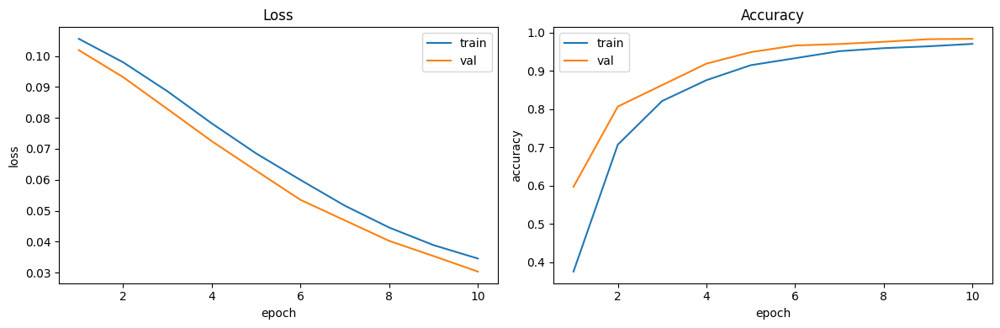

In [ ]:
plot_history(teacher_history_natural_resNet50_SGD_MSE)

In [ ]:
# ──────────────────────────────────────────────────────────
# Treino do Teacher
# Natural imagens
# ──────────────────────────────────────────────────────────

teacher_model_resNet_natural = models.resnet50(weights=resNet50weights)

natural_num_classes_resNet50 = len(natural_classes_resNet50)
teacher_model_natural_trained_resNet50_SGD, teacher_history_natural_resNet50_SGD = train(teacher_model_resNet_natural,
                                                                                         natural_train_loader_resNet50,
                                                                                         natural_val_loader_resNet50,
                                                                                         natural_num_classes_resNet50,
                                                                                         prep_resNet50,
                                                                                         optimizer_option="SGD",
                                                                                         criterion_option="MSE")

classifier ANTES = Linear(in_features=2048, out_features=1000, bias=True)
classifier DEPOIS = Linear(in_features=2048, out_features=8, bias=True)
##############################
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]       

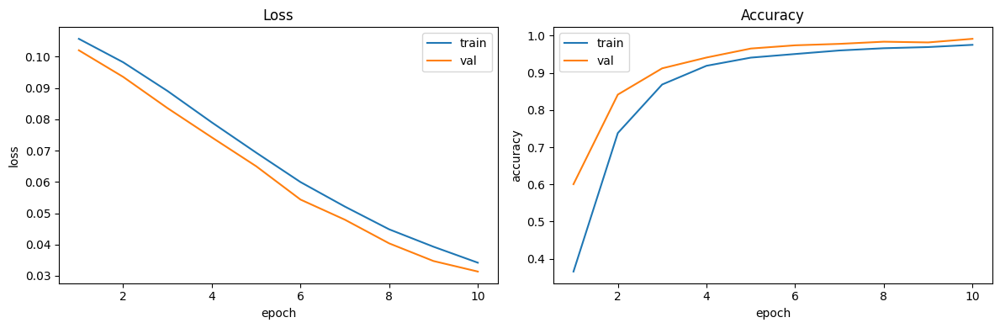

In [ ]:
plot_history(teacher_history_natural_resNet50_SGD)

In [ ]:
# ──────────────────────────────────────────────────────────
# Treino do Teacher
# Natural imagens
# ──────────────────────────────────────────────────────────

teacher_model_resNet_natural = models.resnet50(weights=resNet50weights)

natural_num_classes_resNet50 = len(natural_classes_resNet50)
teacher_model_natural_trained_resNet50_Adam_MSE, teacher_history_natural_resNet50_Adam_MSE = train(teacher_model_resNet_natural,
                                                                                         natural_train_loader_resNet50,
                                                                                         natural_val_loader_resNet50,
                                                                                         natural_num_classes_resNet50,
                                                                                         prep_resNet50,
                                                                                         optimizer_option="Adam",
                                                                                          criterion_option="MSE")

classifier ANTES = Linear(in_features=2048, out_features=1000, bias=True)
classifier DEPOIS = Linear(in_features=2048, out_features=8, bias=True)
##############################
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]       

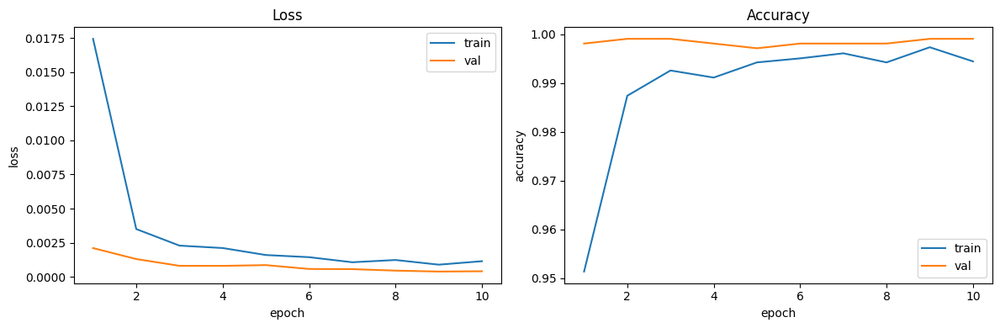

In [ ]:
plot_history(teacher_history_natural_resNet50_Adam_MSE)

In [ ]:
# ──────────────────────────────────────────────────────────
# Treino do Teacher
# Natural imagens
# ──────────────────────────────────────────────────────────

teacher_model_resNet_natural = models.resnet50(weights=resNet50weights)

natural_num_classes_resNet50 = len(natural_classes_resNet50)
teacher_model_natural_trained_resNet50_Adam, teacher_history_natural_resNet50_Adam = train(teacher_model_resNet_natural,
                                                                                         natural_train_loader_resNet50,
                                                                                         natural_val_loader_resNet50,
                                                                                         natural_num_classes_resNet50,
                                                                                         prep_resNet50,
                                                                                         optimizer_option="Adam")

classifier ANTES = Linear(in_features=2048, out_features=1000, bias=True)
classifier DEPOIS = Linear(in_features=2048, out_features=8, bias=True)
##############################
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]       

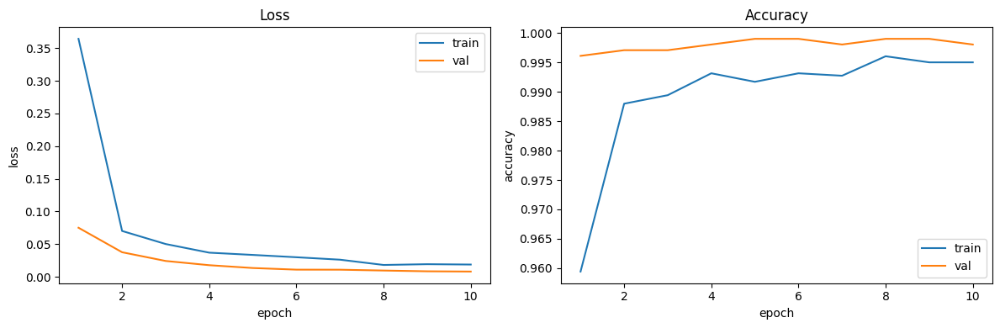

In [ ]:
plot_history(teacher_history_natural_resNet50_Adam)

In [ ]:
# Salvar modelo
torch.save({
    "model_state_dict": teacher_model_natural_trained_resNet50_Adam_MSE.state_dict(),
    "history": teacher_history_natural_resNet50_Adam_MSE,
    "num_classes": natural_classes_resNet50,
}, PATH + "/teacher_model_natural_resNet50_Adam_MSE.pth")

In [ ]:
# Salvar modelo
torch.save({
    "model_state_dict": teacher_model_natural_trained_resNet50_Adam.state_dict(),
    "history": teacher_history_natural_resNet50_Adam,
    "num_classes": natural_classes_resNet50,
}, PATH + "/teacher_model_natural_resNet50_Adam_CE.pth")

In [ ]:
# Salvar modelo
torch.save({
    "model_state_dict": teacher_model_natural_trained_resNet50_SGD.state_dict(),
    "history": teacher_history_natural_resNet50_SGD,
    "num_classes": natural_classes_resNet50,
}, PATH + "/teacher_model_natural_resNet50_SGD_CE.pth")

In [ ]:
# Salvar modelo
torch.save({
    "model_state_dict": teacher_model_natural_trained_resNet50_SGD_MSE.state_dict(),
    "history": teacher_history_natural_resNet50_SGD_MSE,
    "num_classes": natural_classes_resNet50,
}, PATH + "/teacher_model_natural_resNet50_SGD_MSE.pth")

#### (OU) Carregar Natural

In [ ]:
teacher_model_natural_trained_resNet50_Adam_MSE, teacher_history_natural_resNet50_Adam_MSE, natural_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_natural_resNet50_Adam_MSE.pth", device)
teacher_model_natural_trained_resNet50_Adam, teacher_history_natural_resNet50_Adam, natural_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_natural_resNet50_Adam_CE.pth", device)
teacher_model_natural_trained_resNet50_SGD_MSE, teacher_history_natural_resNet50_SGD_MSE, natural_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_natural_resNet50_SGD_MSE.pth", device)
teacher_model_natural_trained_resNet50_SGD, teacher_history_natural_resNet50_SGD, natural_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_natural_resNet50_SGD_CE.pth", device)

{'train_loss': [0.017431678809736038, 0.0035005576760110055, 0.0022878483463646517, 0.0021107498676479278, 0.0015989610955077572, 0.0014410212324379866, 0.0010698885644339251, 0.0012351660417514545, 0.0008929868402886425, 0.0011461178363492467], 'train_acc': [0.9513356802650652, 0.9873679850900807, 0.9925450403810313, 0.9910954648995651, 0.9942016980741354, 0.9950300269206875, 0.9960654379788776, 0.9942016980741354, 0.9973079312487058, 0.9944087802857734], 'val_loss': [0.0021067663443561217, 0.0013032737642894112, 0.0008087122204445116, 0.0008048418744033062, 0.0008607033751157385, 0.000577796989605119, 0.0005669082879499538, 0.00045672574067466695, 0.0003882743259130777, 0.000410657699514411], 'val_acc': [0.9980657640232108, 0.9990328820116054, 0.9990328820116054, 0.9980657640232108, 0.9970986460348162, 0.9980657640232108, 0.9980657640232108, 0.9980657640232108, 0.9990328820116054, 0.9990328820116054], 'best_val_acc': 0.9990328820116054, 'best_val_loss': 0.0003882743259130777, 'best_e

In [ ]:
teacher_model_natural_trained_resNet50 = teacher_model_natural_trained_resNet50_Adam_MSE
teacher_history_natural_resNet50 = teacher_history_natural_resNet50_Adam_MSE

In [ ]:
print("## Modelos Teacher Treinados\n")
print(f"{"| Modelo":<20} | {"Dataset":<10} | {"Loss":<15} | {"Opt":<10} | {'Loss na Validação:':<20} | {'Acurácia na Validação:':<20} |")
print(f"{"|"+"-"*19} | {"-"*9} | {"-"*14} | {"-"*9} | {"-"*19} | {"-"*19} |")

print(f"{"| ResNet50":<20} | {"Natural":<10} | {"MSE":<15} | {"SGD":<10} | {teacher_history_natural_resNet50_SGD_MSE['best_val_loss']:<20.4f} | {teacher_history_natural_resNet50_SGD_MSE['best_val_acc']:<20.4f} |")
print(f"{"| ResNet50":<20} | {"Natural":<10} | {"CrossEntropy":<15} | {"SGD":<10} | {teacher_history_natural_resNet50_SGD['best_val_loss']:<20.4f} | {teacher_history_natural_resNet50_SGD['best_val_acc']:<20.4f} |")
print(f"{"| ResNet50":<20} | {"Natural":<10} | {"MSE":<15} | {"Adam":<10} | {teacher_history_natural_resNet50_Adam_MSE['best_val_loss']:<20.4f} | {teacher_history_natural_resNet50_Adam_MSE['best_val_acc']:<20.4f} |")
print(f"{"| ResNet50":<20} | {"Natural":<10} | {"CrossEntropy":<15} | {"Adam":<10} | {teacher_history_natural_resNet50_Adam['best_val_loss']:<20.4f} | {teacher_history_natural_resNet50_Adam['best_val_acc']:<20.4f} |")

## Modelos Teacher Treinados

| Modelo             | Dataset    | Loss            | Opt        | Loss na Validação:   | Acurácia na Validação: |
|------------------- | --------- | -------------- | --------- | ------------------- | ------------------- |
| ResNet50           | Natural    | MSE             | SGD        | 0.0303               | 0.9836               |
| ResNet50           | Natural    | CrossEntropy    | SGD        | 0.0314               | 0.9913               |
| ResNet50           | Natural    | MSE             | Adam       | 0.0004               | 0.9990               |
| ResNet50           | Natural    | CrossEntropy    | Adam       | 0.0085               | 0.9990               |


#### Visualização de resultados

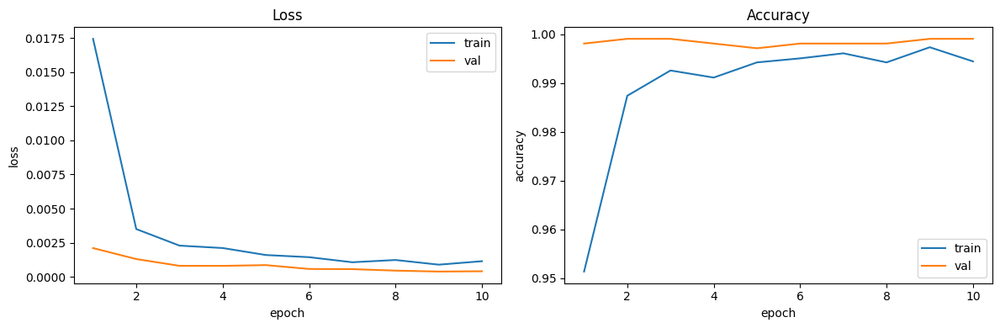

In [ ]:
plot_history(teacher_history_natural_resNet50)

<Figure size 800x800 with 0 Axes>

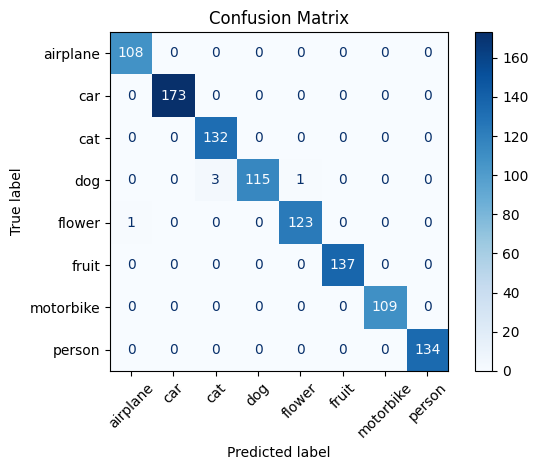

In [ ]:
cm_natural_resNet50 = plot_confusion_matrix(
    teacher_model_natural_trained_resNet50,
    natural_test_loader_resNet50,
    natural_classes_resNet50,
    device
)

['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Classe Verdadeira: dog
Classe Predita: dog
Confiança: 0.9933
ResNet - model.layer4[-1]


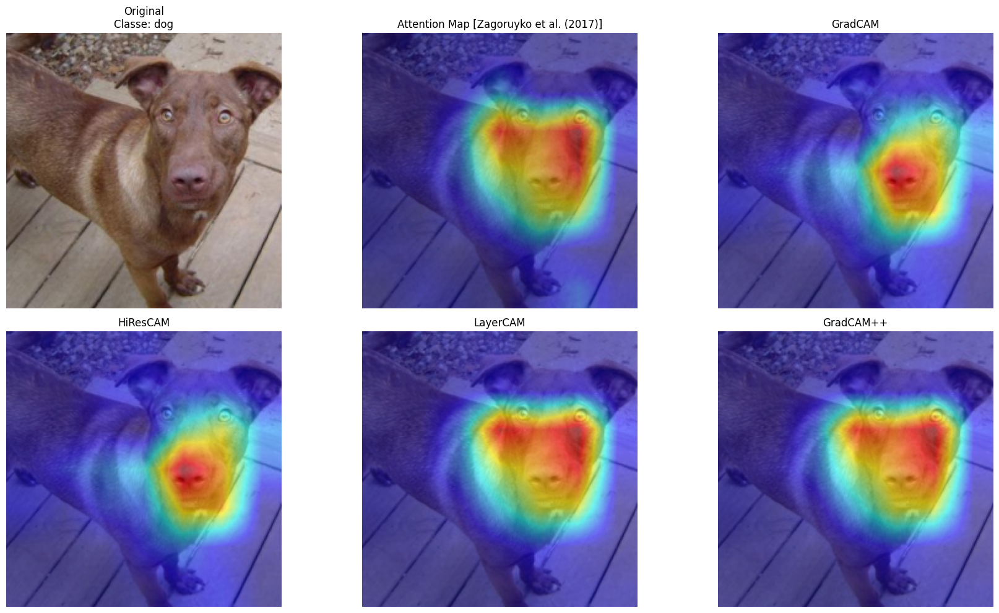

CPU times: user 1.14 s, sys: 63.9 ms, total: 1.2 s
Wall time: 1.34 s


In [ ]:
%%time
print(natural_classes_resNet50)
predict(teacher_model_natural_trained_resNet50, DATASET_NATURAL, prep_resNet50, natural_classes_resNet50, device, IMAGE_SAMPLE_NATURAL,
        xai_method="All")

Shape pré-GAP: (2048, 7, 7)
Classe: dog


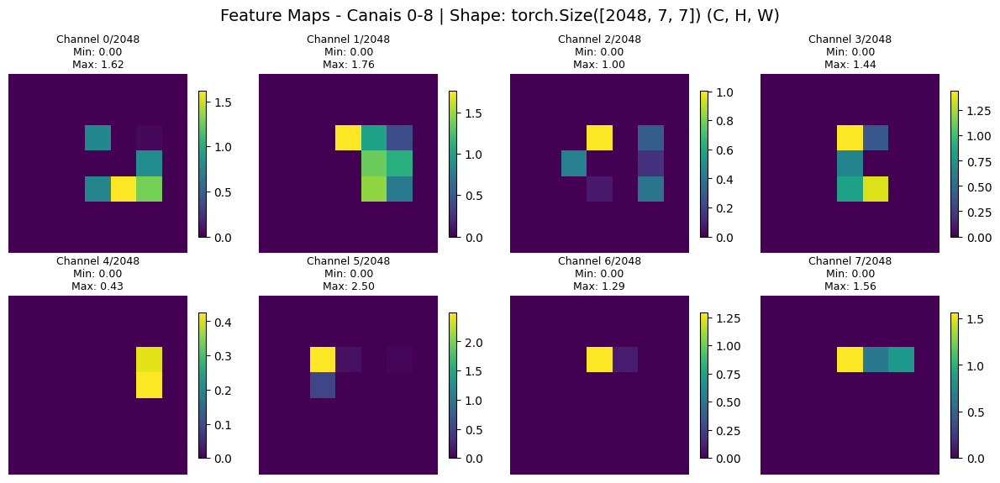

In [ ]:
visualize_feature_maps_pre_gap(
    teacher_model_natural_trained_resNet50, DATASET_NATURAL, prep_resNet50, natural_classes_resNet50,
    device=device, sample_idx=IMAGE_SAMPLE_NATURAL, num_maps_to_show=8
)

#### (OU) Train Garbage

In [ ]:
# ──────────────────────────────────────────────────────────
# Treino do Teacher
# Garbage imagens
# ──────────────────────────────────────────────────────────
teacher_model_resNet_garbage = models.resnet50(weights=resNet50weights)
garbage_num_classes_resNet50 = len(garbage_classes_resNet50)
teacher_model_garbage_trained_resNet50, teacher_history_garbage_resNet50 = train(teacher_model_resNet_garbage, garbage_train_loader_resNet50, garbage_val_loader_resNet50, garbage_num_classes_resNet50, prep_resNet50,
                                                                                         optimizer_option="Adam", criterion_option="MSE")


classifier ANTES = Linear(in_features=2048, out_features=1000, bias=True)
classifier DEPOIS = Linear(in_features=2048, out_features=12, bias=True)
##############################
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]      

In [ ]:
# Salvar modelo
torch.save({
    "model_state_dict": teacher_model_garbage_trained_resNet50_Adam_CE.state_dict(),
    "history": teacher_history_garbage_resNet50_Adam_CE,
    "num_classes": garbage_classes_resNet50,
}, PATH + "/teacher_model_garbage_resNet50_Adam_CE.pth")

#### (OU) Carregar Garbage

In [ ]:
teacher_model_garbage_trained_resNet50_Adam_MSE, teacher_history_garbage_resNet50_Adam_MSE, garbage_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_garbage_resNet50_Adam_MSE.pth", device)
teacher_model_garbage_trained_resNet50_Adam_CE, teacher_history_garbage_resNet50_Adam_CE, garbage_classes_resnet50 = load_teacher_model(
    "resnet50", PATH + "/teacher_model_garbage_resNet50_Adam_CE.pth", device)
#teacher_model_garbage_trained_resNet50_SGD_MSE, teacher_history_garbage_resNet50_SGD_MSE, garbage_classes_resnet50 = load_teacher_model(
#    "resnet50", PATH + "/teacher_model_garbage_resNet50_SGD_MSE.pth", device)
#teacher_model_garbage_trained_resNet50_SGD, teacher_history_garbage_resNet50_SGD, garbage_classes_resnet50 = load_teacher_model(
#    "resnet50", PATH + "/teacher_model_garbage_resNet50_SGD_CE.pth", device)

{'train_loss': [0.021227999434602303, 0.009898484104465604, 0.0077696911110345475, 0.0065102461312981546, 0.005919870395559824, 0.0052581243871318425, 0.005129254582161375, 0.004590296220423698, 0.004231455802238284, 0.0038455853667487537], 'train_acc': [0.842817679558011, 0.930939226519337, 0.947145488029466, 0.9549723756906078, 0.9586556169429098, 0.9648250460405157, 0.9639042357274401, 0.9697974217311234, 0.9720994475138122, 0.9754143646408839], 'val_loss': [0.010459804156219622, 0.0077243796663801455, 0.007082562911439067, 0.006167430331795242, 0.006217178369727791, 0.005778868274653565, 0.005724961720935305, 0.005542435769358314, 0.005465588267239432, 0.005504339765100954], 'val_acc': [0.9260850880962613, 0.9419853889127632, 0.9518693596905887, 0.9518693596905887, 0.9518693596905887, 0.9544477868500215, 0.9578856897292651, 0.9574559518693597, 0.9591749033089815, 0.9583154275891707], 'best_val_acc': 0.9591749033089815, 'best_val_loss': 0.005465588267239432, 'best_epoch': 9}
{'train

In [ ]:
teacher_model_garbage_trained_resNet50 = teacher_model_garbage_trained_resNet50_Adam_MSE
teacher_history_garbage_resNet50 = teacher_history_garbage_resNet50_Adam_MSE

#### Visualização de resultados

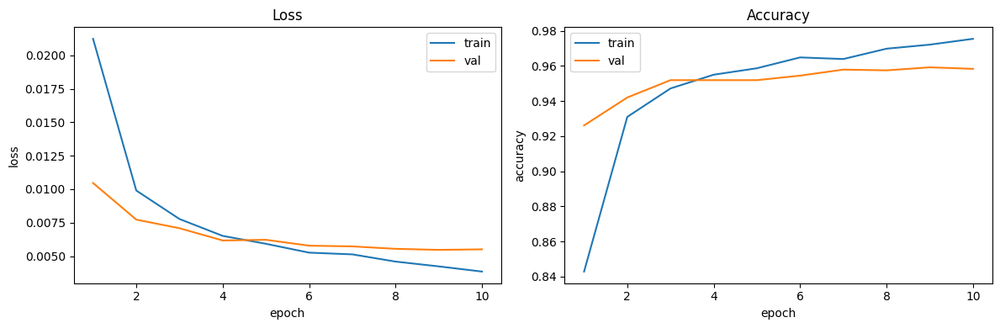

In [ ]:
plot_history(teacher_history_garbage_resNet50)

<Figure size 800x800 with 0 Axes>

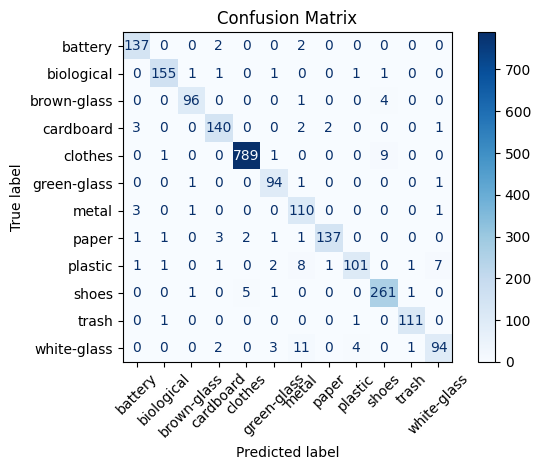

In [ ]:
cm_garbage = plot_confusion_matrix(
    teacher_model_garbage_trained_resNet50,
    garbage_test_loader_resNet50,
    garbage_classes_resNet50,
    device
)

['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Classe Verdadeira: biological
Classe Predita: biological
Confiança: 0.8832
ResNet - model.layer4[-1]


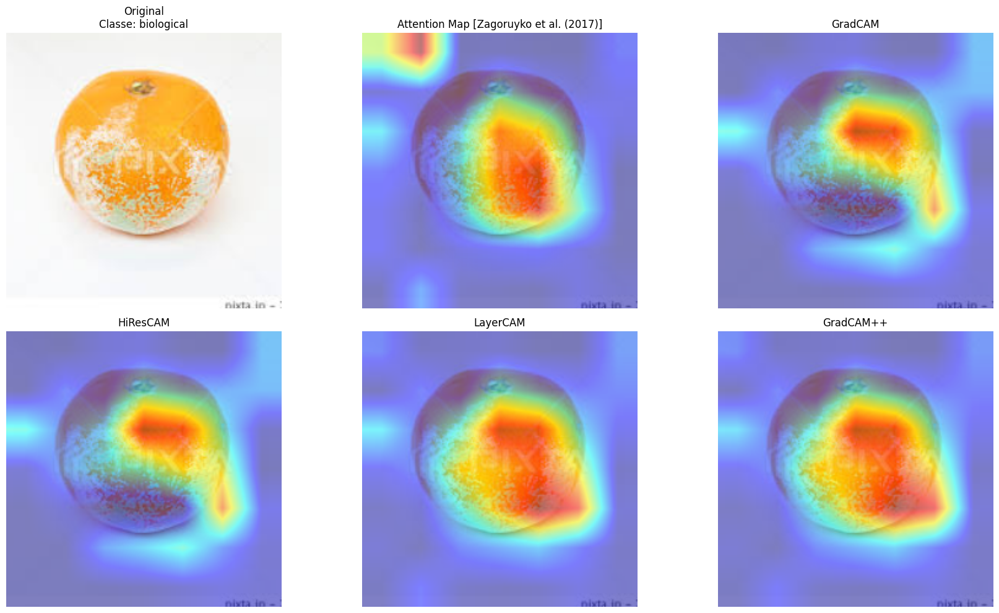

CPU times: user 875 ms, sys: 19.1 ms, total: 894 ms
Wall time: 893 ms


In [ ]:
%%time
print(garbage_classes_resNet50)
predict(teacher_model_garbage_trained_resNet50, DATASET_GARBAGE, prep_resNet50, garbage_classes_resNet50, device, IMAGE_SAMPLE_GARBAGE, xai_method="All")

Shape pré-GAP: (2048, 7, 7)
Classe: biological


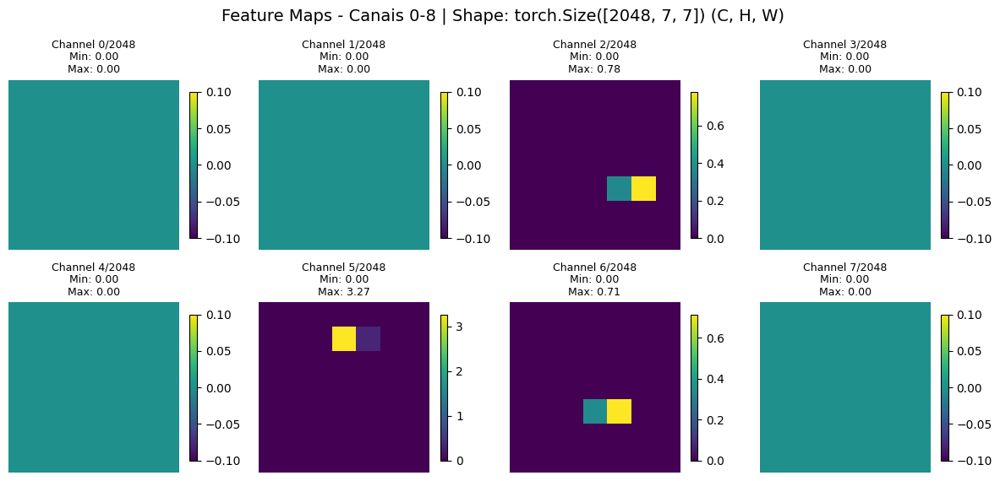

In [ ]:
visualize_feature_maps_pre_gap(
    teacher_model_garbage_trained_resNet50, DATASET_GARBAGE, prep_resNet50, garbage_classes_resNet50,
    device=device, sample_idx=IMAGE_SAMPLE_GARBAGE, num_maps_to_show=8
)

### Visualização de dados (t-SNE)

#### Função

In [ ]:
class FeatureExtractor:
    """Extract features from a specific layer of a CNN model"""

    def __init__(self, model, layer_name):
        self.model = model
        self.layer_name = layer_name
        self.features = []
        self.hook = None
        self._register_hook()

    def _register_hook(self):
        """Register forward hook to capture layer output"""
        def hook_fn(module, input, output):
        #     # Flatten spatial dimensions if needed (for conv layers)
        #     if len(output.shape) > 2:
        #         # Global average pooling for conv features
        #         features = torch.mean(output, dim=(2, 3)) if len(output.shape) == 4 else output.flatten(1)
        #     else:
        #         features = output
            features = output.flatten(start_dim=1)
            self.features.append(features.detach().cpu())

        # Find and register hook on the specified layer
        for name, module in self.model.named_modules():
            if name == self.layer_name:
                self.hook = module.register_forward_hook(hook_fn)
                break

        if self.hook is None:
            raise ValueError(f"Layer '{self.layer_name}' not found in model")

    def extract_features(self, dataloader, device='cuda', max_samples=None):
        """Extract features and labels from dataloader"""
        self.model.eval()
        self.features = []
        all_true_labels = []
        all_pred_labels = []

        sample_count = 0

        with torch.no_grad():
            for batch_idx, (images, true_labels) in enumerate(dataloader):
                if max_samples and sample_count >= max_samples:
                    break

                images = images.to(device)
                true_labels = true_labels.to(device)

                # Forward pass to trigger hook
                outputs = self.model(images)
                pred_labels = torch.argmax(outputs, dim=1)

                # Store labels
                all_true_labels.append(true_labels.cpu())
                all_pred_labels.append(pred_labels.cpu())

                sample_count += len(images)

                if (batch_idx + 1) % 10 == 0:
                    print(f"Processed {batch_idx + 1} batches, {sample_count} samples")

        # Concatenate all features and labels
        features = torch.cat(self.features, dim=0).numpy()
        true_labels = torch.cat(all_true_labels, dim=0).numpy()
        pred_labels = torch.cat(all_pred_labels, dim=0).numpy()

        return features, true_labels, pred_labels

    def cleanup(self):
        """Remove the registered hook"""
        if self.hook:
            self.hook.remove()

def project_features_2d(features, method='tsne', pca_components=30, **kwargs):
    """
    Project high-dimensional features to 2D using t-SNE or UMAP

    Args:
        features: numpy array of shape (n_samples, n_features)
        method: 'tsne' or 'umap'
        **kwargs: additional parameters for the projection method

    Returns:
        2D projected features of shape (n_samples, 2)
    """
    print(f"Projecting {features.shape[0]} samples with {features.shape[1]} features using {method.upper()}")

    # Initial dimensionality reduction with PCA before t-SNE/UMAP
    if features.shape[1] > pca_components:
        pca = PCA(n_components=pca_components, random_state=42)
        features = pca.fit_transform(features)
        print(f"PCA reduced features to {features.shape[1]} dimensions")

    if method.lower() == 'tsne':
        # Default t-SNE parameters
        tsne_params = {
            'n_components': 2,
            'perplexity': 30,
            'learning_rate': 200,
            'max_iter': 1000,
            'random_state': 42
        }
        tsne_params.update(kwargs)

        reducer = TSNE(**tsne_params)
        projected = reducer.fit_transform(features)

    elif method.lower() == 'umap':
        # Default UMAP parameters
        umap_params = {
            'n_components': 2,
            'n_neighbors': 15,
            'min_dist': 0.1,
            'metric': 'euclidean',
            'random_state': 42
        }
        umap_params.update(kwargs)

        reducer = umap.UMAP(**umap_params)
        projected = reducer.fit_transform(features)

    else:
        raise ValueError("Method must be 'tsne' or 'umap'")

    return projected

def plot_2d_projection(projected_features, labels, title="Feature Projection",
                      label_names=None, figsize=(12, 8), save_path=None):
    """
    Plot 2D projection with colored labels

    Args:
        projected_features: 2D array of projected features
        labels: 1D array of labels
        title: plot title
        label_names: list of label names for legend
        figsize: figure size tuple
        save_path: path to save the plot
    """
    plt.figure(figsize=figsize)

    # Create color palette
    unique_labels = np.unique(labels)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

    # Plot each class
    for i, label in enumerate(unique_labels):
        mask = labels == label
        label_name = label_names[label] if label_names else f'Class {label}'
        plt.scatter(projected_features[mask, 0], projected_features[mask, 1],
                   c=[colors[i]], label=label_name, alpha=0.7, s=20)

    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

def visualize_cnn_features(model, dataloader, layer_name, device='cuda',
                          method='tsne', use_predicted_labels=False,
                          max_samples=1000, label_names=None, **projection_kwargs):
    """
    Complete pipeline to visualize CNN layer features in 2D

    Args:
        model: pretrained CNN model
        dataloader: dataloader with (image, label) batches
        layer_name: name of the layer to extract features from
        device: computation device
        method: 'tsne' or 'umap'
        use_predicted_labels: if True, use model predictions; if False, use true labels
        max_samples: maximum number of samples to process
        label_names: list of class names for better visualization
        **projection_kwargs: additional parameters for projection method
    """

    # Move model to device
    model = model.to(device)

    # Extract features
    print(f"Extracting features from layer: {layer_name}")
    extractor = FeatureExtractor(model, layer_name)

    try:
        features, true_labels, pred_labels = extractor.extract_features(
            dataloader, device, max_samples
        )

        # Choose labels to use
        labels = pred_labels if use_predicted_labels else true_labels
        label_type = "Predicted" if use_predicted_labels else "True"

        print(f"Feature shape: {features.shape}")
        print(f"Using {label_type.lower()} labels")

        # Project to 2D
        projected = project_features_2d(features, method, **projection_kwargs)

        # Create plot
        title = f"{method.upper()} projection of {layer_name} features ({label_type} Labels)"
        plot_2d_projection(projected, labels, title, label_names)

        # Calculate and display accuracy if using predicted labels
        if use_predicted_labels:
            accuracy = (pred_labels == true_labels).mean()
            print(f"Model accuracy on this subset: {accuracy:.3f}")

        #return projected, labels, features
        return projected, labels

    finally:
        # Clean up
        extractor.cleanup()

#### Rodar em todos *teachers*

In [ ]:
visualize_cnn_features(teacher_model_natural_trained_resNet50,
                       natural_test_loader_resNet50,
                       layer_name="avgpool",
                       #layer_name="fc",
                       device=device,
                       label_names=natural_classes_resNet50)

In [ ]:
visualize_cnn_features(teacher_model_garbage_trained_resNet50,
                       garbage_test_loader_resNet50,
                       layer_name="avgpool",
                       #layer_name="fc",
                       device=device,
                       label_names=garbage_classes_resNet50)

### Visão geral dos resultados

#### Funções

In [ ]:
def calc_gflops(model, input_size):
    dummy = torch.randn(1, 3, *input_size).to(device)
    flops, _ = profile(model, inputs=(dummy,), verbose=False)
    return flops / 1e9

def count_params(model, trainable_only=False):
    return sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad or not trainable_only
    )

In [ ]:
def get_pre_gap_features_shape(model, input_size=(224, 224)):
    model.eval()
    with torch.no_grad():
        x = torch.randn(1, 3, *input_size).to(device)

        if isinstance(model, torchvision.models.ConvNeXt):
            feat = model.features(x)

        elif isinstance(model, torchvision.models.ResNet):
            feat = model.conv1(x)
            feat = model.bn1(feat)
            feat = model.relu(feat)
            feat = model.maxpool(feat)
            feat = model.layer1(feat)
            feat = model.layer2(feat)
            feat = model.layer3(feat)
            feat = model.layer4(feat)

        elif isinstance(model, torchvision.models.MobileNetV3):
            feat = model.features(x)

        else:
            return "N/A"

        return f"{feat.shape[2]} \u00d7 {feat.shape[3]} \u00d7 {feat.shape[1]}"

def eval_model(model, loader):
    model.eval()
    c = t = 0
    with torch.no_grad():
        for imgs, lbls in loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            c += (model(imgs).argmax(1) == lbls).sum().item()
            t += lbls.size(0)
    return c / t

#### Resultados

In [ ]:
# =========================
# Existing Models
# =========================
resNet50weights = models.ResNet50_Weights.IMAGENET1K_V2
teacher_model_resNet50_original = models.resnet50(
    weights=resNet50weights
).to(device)

# =========================
params_rn = count_params(teacher_model_resNet50_original)
gflops_rn = calc_gflops(teacher_model_resNet50_original, (224, 224))
pre_gap_rn = get_pre_gap_features_shape(
    teacher_model_resNet50_original,
    (224, 224)
)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 150MB/s]


In [ ]:
print("## Modelos Teacher Originais (pré fine-tuning)\n")

print(
    f"{'| Modelo':<20} | "
    f"{'Parâmetros':<15} | "
    f"{'GFLOPs':<10} | "
    f"{'Pré-GAP (HxWxC)':<20} |"
)

print(
    f"{'|'+'-'*19} | "
    f"{'-'*14} | "
    f"{'-'*9} | "
    f"{'-'*19} |"
)

# =========================
# ResNet
# =========================
print(
    f"{'| ResNet50':<20} | "
    f"{params_rn:<15,} | "
    f"{gflops_rn:<10.2f} | "
    f"{pre_gap_rn:<20} |"
)

## Modelos Teacher Originais (pré fine-tuning)

| Modelo             | Parâmetros      | GFLOPs     | Pré-GAP (HxWxC)      |
|------------------- | -------------- | --------- | ------------------- |
| ResNet50           | 25,557,032      | 4.13       | 7 × 7 × 2048         |


In [ ]:
# --- Trained ResNet50 Natural ---
params_rn_nat = count_params(teacher_model_natural_trained_resNet50)
gflops_rn_nat = calc_gflops(teacher_model_natural_trained_resNet50, (prep_resNet50.crop_size[0], prep_resNet50.crop_size[0]))
pre_gap_rn_nat = get_pre_gap_features_shape(teacher_model_natural_trained_resNet50, (prep_resNet50.crop_size[0], prep_resNet50.crop_size[0]))

# --- Trained ResNet50 Garbage ---
params_rn_gar = count_params(teacher_model_garbage_trained_resNet50)
gflops_rn_gar = calc_gflops(teacher_model_garbage_trained_resNet50, (prep_resNet50.crop_size[0], prep_resNet50.crop_size[0]))
pre_gap_rn_gar = get_pre_gap_features_shape(teacher_model_garbage_trained_resNet50, (prep_resNet50.crop_size[0], prep_resNet50.crop_size[0]))

acc_rn_nat  = eval_model(teacher_model_natural_trained_resNet50,  natural_test_loader_resNet50)
acc_rn_gar  = eval_model(teacher_model_garbage_trained_resNet50,  garbage_test_loader_resNet50)

In [ ]:
print("## Modelos Teacher Treinados\n")
print(f"{"| Modelo":<20} | {"Dataset":<10} | {"Parâmetros":<15} | {"GFLOPs":<10} | {"Pré-GAP (HxWxC)":<20} | {'Loss na Validação:':<20} | {'Acurácia na Validação:':<20} |")
print(f"{"|"+"-"*19} | {"-"*9} | {"-"*14} | {"-"*9} | {"-"*19} | {"-"*19} | {"-"*19} |")

print(f"{"| ResNet50":<20} | {"Natural":<10} | {params_rn_nat:<15,} | {gflops_rn_nat:<10.2f} | {pre_gap_rn_nat:<20} | {teacher_history_natural_resNet50['best_val_loss']:<20.4f} | {teacher_history_natural_resNet50['best_val_acc']:<20.4f} |")
print(f"{"| ResNet50":<20} | {"Garbage":<10} | {params_rn_gar:<15,} | {gflops_rn_gar:<10.2f} | {pre_gap_rn_gar:<20} | {teacher_history_garbage_resNet50['best_val_loss']:<20.4f} | {teacher_history_garbage_resNet50['best_val_acc']:<20.4f} |")

## Modelos Teacher Treinados

| Modelo             | Dataset    | Parâmetros      | GFLOPs     | Pré-GAP (HxWxC)      | Loss na Validação:   | Acurácia na Validação: |
|------------------- | --------- | -------------- | --------- | ------------------- | ------------------- | ------------------- |
| ResNet50           | Natural    | 23,524,424      | 4.13       | 7 × 7 × 2048         | 0.0004               | 0.9990               |
| ResNet50           | Garbage    | 23,532,620      | 4.13       | 7 × 7 × 2048         | 0.0055               | 0.9592               |


Sintetização dos resultados da matriz de confusão pré e pós Fine-Tuning com o ConvNeXt

In [ ]:
def get_predictions_for_cm(model, loader, device, classifier_head=None, variant="post_gap"):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            if classifier_head:
                student_output = model(images)
                if variant == "pre_gap":
                    pooled = F.adaptive_avg_pool2d(student_output, 1).flatten(1)
                else:
                    pooled = student_output
                logits = classifier_head(pooled)
            else:
                logits = model(images)

            preds = logits.argmax(dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
    return y_true, y_pred

def plot_side_by_side_confusion_matrices(cm_data_list, suptitle="Confusion Matrices"):
    num_plots = len(cm_data_list)
    num_cols = min(num_plots, 2)
    num_rows = int(np.ceil(num_plots / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 7, num_rows * 6))
    if num_rows == 1 and num_cols == 1:
        axes = [axes]

    axes = axes.flatten()

    for i, (y_true, y_pred, class_names, title) in enumerate(cm_data_list):
        cm = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=class_names
        )
        disp.plot(
            cmap="Blues",
            xticks_rotation=45,
            ax=axes[i]
        )
        axes[i].set_title(title)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(suptitle, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout for suptitle
    plt.show()
def prepare_pre_ft_teacher(weights, num_classes, model_class):
    model = model_class(weights=weights)
    if isinstance(model, torchvision.models.ConvNeXt):
        in_features = model.classifier[-1].in_features
        model.classifier[-1] = torch.nn.Linear(in_features, num_classes) # Randomly initialized
    elif isinstance(model, torchvision.models.EfficientNet):
        in_features = model.classifier[-1].in_features
        model.classifier[-1] = torch.nn.Linear(in_features, num_classes)
    elif isinstance(model, torchvision.models.ResNet):
        in_features = model.fc.in_features
        model.fc = torch.nn.Linear(in_features, num_classes)
    else:
        raise ValueError("Unsupported model type for pre-fine-tuning preparation.")
    return model.to(device)


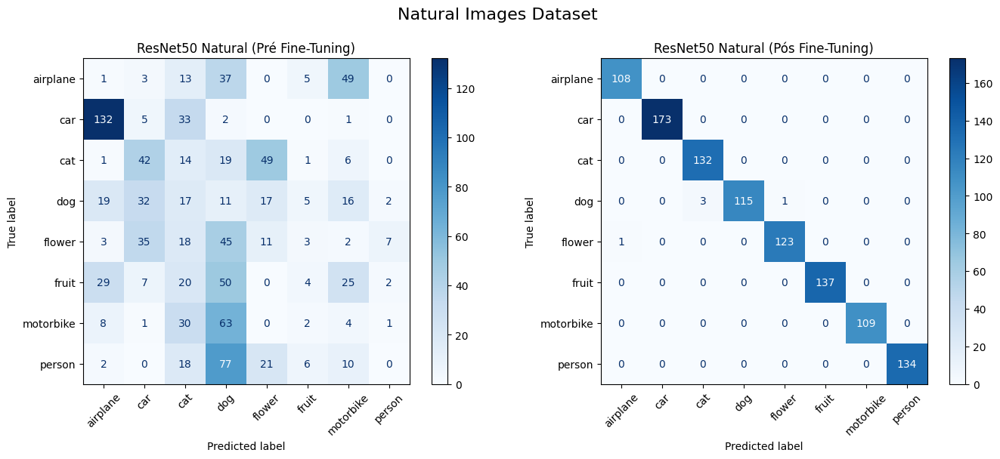

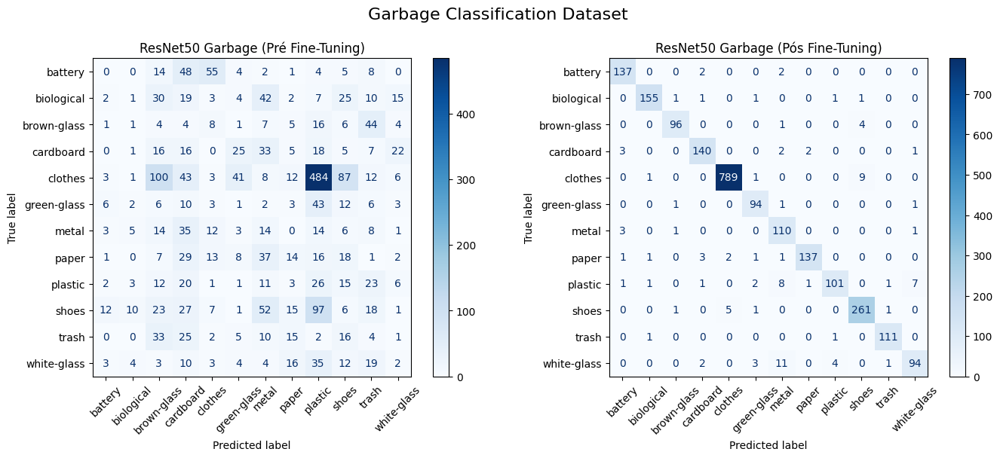

In [ ]:
# --- Instantiate Pre-Fine-Tuning ResNet50 Teacher for Natural and Garbage datasets ---
resNet50weights = models.ResNet50_Weights.IMAGENET1K_V2
teacher_model_natural_pre_ft = prepare_pre_ft_teacher(resNet50weights, len(natural_classes_resNet50), models.resnet50)
teacher_model_garbage_pre_ft = prepare_pre_ft_teacher(resNet50weights, len(garbage_classes_resNet50), models.resnet50)

# --- Get predictions for Natural Dataset ---
# Teacher ResNet50 Natural (Pre-Fine-Tuning)
y_true_teacher_rn_nat_pre_ft, y_pred_teacher_rn_nat_pre_ft = get_predictions_for_cm(
    teacher_model_natural_pre_ft, natural_test_loader_resNet50, device
)
# Teacher ResNet50 Natural (Post-Fine-Tuning)
y_true_teacher_rn_nat_post_ft, y_pred_teacher_rn_nat_post_ft = get_predictions_for_cm(
    teacher_model_natural_trained_resNet50, natural_test_loader_resNet50, device
)

# --- Get predictions for Garbage Dataset ---
# Teacher ResNet50 Garbage (Pre-Fine-Tuning)
y_true_teacher_rn_gar_pre_ft, y_pred_teacher_rn_gar_pre_ft = get_predictions_for_cm(
    teacher_model_garbage_pre_ft, garbage_test_loader_resNet50, device
)
# Teacher ResNet50 Garbage (Post-Fine-Tuning)
y_true_teacher_rn_gar_post_ft, y_pred_teacher_rn_gar_post_ft = get_predictions_for_cm(
    teacher_model_garbage_trained_resNet50, garbage_test_loader_resNet50, device
)

# --- Prepare data for plotting ---
cm_data_list_natural_comparison = [
    (y_true_teacher_rn_nat_pre_ft, y_pred_teacher_rn_nat_pre_ft, natural_classes_resNet50, "ResNet50 Natural (Pré Fine-Tuning)"),
    (y_true_teacher_rn_nat_post_ft, y_pred_teacher_rn_nat_post_ft, natural_classes_resNet50, "ResNet50 Natural (Pós Fine-Tuning)")
]

cm_data_list_garbage_comparison = [
    (y_true_teacher_rn_gar_pre_ft, y_pred_teacher_rn_gar_pre_ft, garbage_classes_resNet50, "ResNet50 Garbage (Pré Fine-Tuning)"),
    (y_true_teacher_rn_gar_post_ft, y_pred_teacher_rn_gar_post_ft, garbage_classes_resNet50, "ResNet50 Garbage (Pós Fine-Tuning)")
]

# --- Plot Confusion Matrices ---
plot_side_by_side_confusion_matrices(cm_data_list_natural_comparison, suptitle="Natural Images Dataset")
plot_side_by_side_confusion_matrices(cm_data_list_garbage_comparison, suptitle="Garbage Classification Dataset")

In [ ]:
# --- Instantiate Pre-Fine-Tuning ConvNeXt Teacher for Natural and Garbage datasets ---
convNeXtweights = models.ConvNeXt_Base_Weights.IMAGENET1K_V1
teacher_model_natural_pre_ft = prepare_pre_ft_teacher(convNeXtweights, len(natural_classes_convNeXt), models.convnext_base)
teacher_model_garbage_pre_ft = prepare_pre_ft_teacher(convNeXtweights, len(garbage_classes_convNeXt), models.convnext_base)

# --- Get predictions for Natural Dataset ---
# Teacher ConvNeXt Natural (Pre-Fine-Tuning)
y_true_teacher_cn_nat_pre_ft, y_pred_teacher_cn_nat_pre_ft = get_predictions_for_cm(
    teacher_model_natural_pre_ft, natural_test_loader_convNeXt, device
)
# Teacher ConvNeXt Natural (Post-Fine-Tuning)
y_true_teacher_cn_nat_post_ft, y_pred_teacher_cn_nat_post_ft = get_predictions_for_cm(
    teacher_model_natural_trained_convNeXt, natural_test_loader_convNeXt, device
)

# --- Get predictions for Garbage Dataset ---
# Teacher ConvNeXt Garbage (Pre-Fine-Tuning)
y_true_teacher_cn_gar_pre_ft, y_pred_teacher_cn_gar_pre_ft = get_predictions_for_cm(
    teacher_model_garbage_pre_ft, garbage_test_loader_convNeXt, device
)
# Teacher ConvNeXt Garbage (Post-Fine-Tuning)
y_true_teacher_cn_gar_post_ft, y_pred_teacher_cn_gar_post_ft = get_predictions_for_cm(
    teacher_model_garbage_trained_convNeXt, garbage_test_loader_convNeXt, device
)

# --- Prepare data for plotting ---
cm_data_list_natural_comparison = [
    (y_true_teacher_cn_nat_pre_ft, y_pred_teacher_cn_nat_pre_ft, natural_classes_convNeXt, "ConvNeXt Natural (Pré Fine-Tuning)"),
    (y_true_teacher_cn_nat_post_ft, y_pred_teacher_cn_nat_post_ft, natural_classes_convNeXt, "ConvNeXt Natural (Pos Fine-Tuning)")
]

cm_data_list_garbage_comparison = [
    (y_true_teacher_cn_gar_pre_ft, y_pred_teacher_cn_gar_pre_ft, garbage_classes_convNeXt, "ConvNeXt Garbage (Pré Fine-Tuning)"),
    (y_true_teacher_cn_gar_post_ft, y_pred_teacher_cn_gar_post_ft, garbage_classes_convNeXt, "ConvNeXt Garbage (Pos Fine-Tuning)")
]

# --- Plot Confusion Matrices ---
plot_side_by_side_confusion_matrices(cm_data_list_natural_comparison, suptitle="Natural Images Dataset")
plot_side_by_side_confusion_matrices(cm_data_list_garbage_comparison, suptitle="Garbage Classification Dataset")

### Teacher encoder + classifier separado

In [ ]:
# ──────────────────────────────────────────────────────────
# Extração de encoder e classificador
# (usados fixos nas Fases 2 e 3)
# ──────────────────────────────────────────────────────────

def extract_encoder(teacher_model):
    encoder = nn.Sequential(*list(teacher_model.children())[:-1]).to(device)
    for p in encoder.parameters():
        p.requires_grad = False
    return encoder

def extract_classifier(teacher_model):
    if hasattr(teacher_model, "fc"):  # ResNet
        classifier = copy.deepcopy(teacher_model.fc)

    elif isinstance(teacher_model, torchvision.models.VGG):  # VGG
        classifier = copy.deepcopy(teacher_model.classifier[-1])

    elif hasattr(teacher_model, "classifier"):  # ConvNeXt
        cls = teacher_model.classifier

        if isinstance(teacher_model, torchvision.models.ConvNeXt):
            classifier = copy.deepcopy(cls[-1])
        else:
            raise ValueError("Classifier head não reconhecido")

    else:
        raise ValueError("Classifier head não reconhecido")

    for p in classifier.parameters():
        p.requires_grad = False

    return classifier

In [ ]:
def get_teacher_features(teacher_model, x):
    """
    Retorna (pre_gap, post_gap, logits, intermediate_feats) sem gradiente.
      pre_gap           : (B, C, H, W)  — saída antes do avgpool
      post_gap          : (B, C)        — saída depois do avgpool (embedding)
      logits            : (B, num_cls)
      intermediate_feats: list de tensores (B, C_i, H_i, W_i) — usados no AT
    """
    teacher_model.eval()
    with torch.no_grad():

        # ── ConvNeXt ──────────────────────────────────────────────────────────
        if isinstance(teacher_model, torchvision.models.ConvNeXt):
            # Percorre os 8 sub-módulos de teacher_model.features
            # e guarda as saídas após os stages convolucionais (índices 1, 3, 5).
            z = x
            intermediate_feats = []
            for i, layer in enumerate(teacher_model.features):
                z = layer(z)
                if i in (1, 3, 5):      # após stage 0, 1, 2
                    intermediate_feats.append(z)
            pre_gap  = z                # após features[-1] = stage 3 + LayerNorm
            post_gap = teacher_model.avgpool(pre_gap).flatten(1)
            logits   = teacher_model.classifier(post_gap)

        # ── ResNet50 / ResNet18 ───────────────────────────────────────────────
        elif isinstance(teacher_model, torchvision.models.ResNet):
            z  = teacher_model.conv1(x)
            z  = teacher_model.bn1(z)
            z  = teacher_model.relu(z)
            z  = teacher_model.maxpool(z)
            f1 = teacher_model.layer1(z)
            f2 = teacher_model.layer2(f1)
            f3 = teacher_model.layer3(f2)
            f4 = teacher_model.layer4(f3)
            pre_gap           = f4
            post_gap          = teacher_model.avgpool(pre_gap).flatten(1)
            logits            = teacher_model.fc(post_gap)
            intermediate_feats = [f2, f3, f4]   # 3 estágios intermediários

        # ── VGG ──────────────────────────────────────────────────────────────
        elif isinstance(teacher_model, torchvision.models.VGG):
            feats = teacher_model.features
            intermediate_feats = []
            z = x
            block_ends = [4, 9, 16, 23, 30]   # índices após cada maxpool no VGG16
            for i, layer in enumerate(feats):
                z = layer(z)
                if i in block_ends[1:4]:       # 3 stages intermediários
                    intermediate_feats.append(z)
            pre_gap  = z
            post_gap = teacher_model.avgpool(pre_gap).flatten(1)
            logits   = teacher_model(x)

        else:
            raise ValueError(f"Teacher não suportado: {type(teacher_model)}")

    return pre_gap, post_gap, logits, intermediate_feats

### Escolha do modelo para *teacher*

In [ ]:
natural_extract_encoder = extract_encoder(teacher_model_natural_trained_resNet50_Adam_MSE)
natural_extract_classifier = extract_classifier(teacher_model_natural_trained_resNet50_Adam_MSE)

garbage_extract_encoder = extract_encoder(teacher_model_garbage_trained_resNet50_Adam_MSE)
garbage_extract_classifier = extract_classifier(teacher_model_garbage_trained_resNet50_Adam_MSE)

teacher_model_natural_trained = teacher_model_natural_trained_resNet50_Adam_MSE
teacher_model_garbage_trained = teacher_model_garbage_trained_resNet50_Adam_MSE

natural_train_loader = natural_train_loader_resNet50
garbage_train_loader = garbage_train_loader_resNet50

natural_classes = natural_classes_resNet50
garbage_classes = garbage_classes_resNet50

natural_val_loader =  natural_val_loader_resNet50
garbage_val_loader =  garbage_val_loader_resNet50

natural_test_loader = natural_test_loader_resNet50
garbage_test_loader = garbage_test_loader_resNet50

prep_teacher = prep_resNet50

In [ ]:
print("Encoder da rede grande:")
print(garbage_extract_encoder)

Encoder da rede grande:
Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), str

In [ ]:
print("Classificador da rede grande:")
print(garbage_extract_classifier)

Classificador da rede grande:
Linear(in_features=2048, out_features=12, bias=True)


## Student

(2) train the student’s encoder+predictor using the same pretrained classifier of phase 1;

### Light encoder

In [ ]:
class LightCNNEncoder(nn.Module):
    """
    Encoder CNN leve para 224×224 → (B, 512, 1, 1).

    Arquitetura:
      stem   : Conv 3→16,  3×3, stride 2 → 112×112   (416 params)
      block1 : Conv 16→32, 3×3, stride 2 →  56×56    (4.6K params)
      block2 : Conv 32→64, 3×3, stride 2 →  28×28    (18.5K params)
      block3 : Conv 64→128,3×3, stride 2 →  14×14    (73.8K params)
      block4 : Conv 128→256,3×3,stride 2 →   7×7     (295K params)
      head   : Conv 256→512,1×1, stride 1 →   7×7    (131K params)
      gap    : AdaptiveAvgPool → (B, 512, 1, 1)

    Total: ~176K parâmetros treináveis.
    Sem pesos pré-treinados — treinado do zero junto com a destilação.
    """

    def _block(self, in_ch, out_ch, stride=2):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3,
                      stride=stride, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def __init__(self):
        super().__init__()
        self.stem   = self._block(3,   16,  stride=2)   # 224 → 112
        self.block1 = self._block(16,  32,  stride=2)   # 112 →  56
        self.block2 = self._block(32,  64,  stride=2)   #  56 →  28
        self.block3 = self._block(64,  128, stride=2)   #  28 →  14
        self.block4 = self._block(128, 256, stride=2)   #  14 →   7
        self.head   = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )
        self.gap    = nn.AdaptiveAvgPool2d((1, 1))      #   7 →   1

    def forward(self, x):
        x = self.stem(x)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.head(x)
        x = self.gap(x)      # (B, 512, 1, 1) — mesma forma do ResNet18
        return x

In [ ]:
# ──────────────────────────────────────────────────────────
# Encoder do student
# ──────────────────────────────────────────────────────────
def build_student_encoder(device=device):
    if(STUDENT_BACKBONE == "resnet18"):
      base = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
      encoder = nn.Sequential(*list(base.children())[:-1]).to(device)
      # saída: (B, 512, 1, 1) — use .flatten(1) para obter (B, 512)
    elif STUDENT_BACKBONE == "lightcnn":
        encoder = LightCNNEncoder().to(device)
    else:
      raise ValueError(f"Modelo ainda não suportado: {modelo}")
    return encoder

### Predictors

In [ ]:
# ──────────────────────────────────────────────────────────
# Predictors genéricos — recebem as dimensões como parâmetro
# ──────────────────────────────────────────────────────────
class PredictorPreGAP(nn.Module):
    # in_dim     = tamanho do vetor de entrada (saída do encoder student = 512)
    # out_channels = quantos canais o teacher tem antes do GAP (ex: 2048 no ResNet50)
    # spatial    = tamanho espacial do mapa do teacher (ex: 7, ou seja 7x7)
    def __init__(self, in_dim, out_channels, spatial):
        super().__init__()
        # in_dim=512, out_channels=2048, spatial=7
        mid = 512
        self.net = nn.Sequential(
            # (B, 512, 1, 1) para (B, 512, 7, 7)
            # bilinear = interpolação suave (como redimensionar uma imagem)
            nn.Upsample(size=(spatial, spatial), mode='bilinear', align_corners=False), # Podia ser tbm nn.ConvTranspose2d
            nn.Conv2d(in_dim, mid, 3, padding=1, bias=False),
            # Normaliza as ativações por canal
            nn.BatchNorm2d(mid),
            nn.GELU(),
            #nn.ReLU(),
            # (B, 512, 7, 7) para (B, out_channels, 7, 7)
            nn.Conv2d(mid, out_channels, 1, bias=False),
            # Normaliza de novo
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        # x: (B, 512, 1, 1) — saída do ResNet18 encoder
        return self.net(x)


class PredictorPostGAP(nn.Module):
    # in_dim  = tamanho do vetor de entrada (student = 512)
    # out_dim = tamanho do vetor do teacher depois do GAP (ex: 2048)
    def __init__(self, in_dim, out_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, max(in_dim, out_dim)),
            # Normaliza
            nn.BatchNorm1d(max(in_dim, out_dim)),
            nn.GELU(),
            #nn.ReLU(),
            nn.Linear(max(in_dim, out_dim), out_dim),
        )

    def forward(self, x):
        return self.net(x.flatten(1))   # (B, out_dim)
        #out = self.net(x.flatten(1))   # (B, out_dim)
        #return F.normalize(out, dim=1)

class FitNetRegressor(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.regressor = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True))
    def forward(self, x):
        return self.regressor(x)

# ──────────────────────────────────────────────────────────
# Fábrica: cria encoder + predictor correto para o teacher atual
# ──────────────────────────────────────────────────────────
def build_student_and_predictors(teacher_model, device=device):
    pre_gap_shape, post_gap_dim = get_teacher_output_shapes(teacher_model, device=device)
    t_channels, t_h, t_w = pre_gap_shape

    encoder      = build_student_encoder(device)
    pred_pregap  = PredictorPreGAP(in_dim=STUDENT_DIM, out_channels=t_channels, spatial=t_h).to(device)
    pred_postgap = PredictorPostGAP(in_dim=STUDENT_DIM, out_dim=post_gap_dim).to(device)

    # FitNet: canais da hint do teacher dependem da arquitetura
    if isinstance(teacher_model, torchvision.models.ResNet):
        HINT_CHANNELS = 1024   # layer3 do ResNet50
    elif isinstance(teacher_model, torchvision.models.ConvNeXt):
        HINT_CHANNELS = 384    # stage1 do ConvNeXt-Base
    else:
        HINT_CHANNELS = 256    # VGG
    reg_fitnet = FitNetRegressor(in_channels=STUDENT_GUIDED_CHANNELS, out_channels=HINT_CHANNELS).to(device)

    print(f"Teacher pré-GAP : {pre_gap_shape}")
    print(f"Teacher pós-GAP : {post_gap_dim}")
    print(f"PredictorPreGAP : {STUDENT_DIM} → {t_channels}×{t_h}×{t_w}")
    print(f"PredictorPostGAP: {STUDENT_DIM} → {post_gap_dim}")
    print(f"FitNetRegressor  : {STUDENT_GUIDED_CHANNELS} → {HINT_CHANNELS} "
          f"({STUDENT_GUIDED_LAYER}_student → hint_teacher)")

    return encoder, pred_pregap, pred_postgap, reg_fitnet

### Funções

In [ ]:
class CombinedStudentModelForMetrics(nn.Module):
    """
    Junta encoder + predictor + classifier numa única forward.
    - encoder   : ResNet18 sem fc → (B, 512, 1, 1)
    - predictor : PredictorPostGAP → (B, post_gap_dim)
                  PredictorPreGAP  → (B, C, H, W)
    - classifier: camada Linear do teacher, congelada    → (B, num_classes)
    """
    VALID_MODES = {"encoder_pregap", "encoder_postgap"}

    def __init__(self, encoder, predictor, classifier, mode="encoder_pregap"):
        super().__init__()
        self.encoder    = encoder
        self.predictor  = predictor
        self.classifier = classifier
        mode = mode.lower()
        assert mode in self.VALID_MODES, f"Modo inválido: {mode}"
        self.mode = mode

    def forward(self, x):
        feat = self.encoder(x)
        pred = self.predictor(feat)

        if self.mode in ("encoder_pregap"):
            pooled = F.adaptive_avg_pool2d(pred, (1, 1)).flatten(1)
            return self.classifier(pooled)
        else:
            pred_vec = pred.flatten(1) if pred.dim() == 4 else pred
            return self.classifier(pred_vec)

In [ ]:
# Load student_model
def load_student_classification_model(checkpoint_path, device):
    ckpt = torch.load(checkpoint_path, map_location=device)
    class_labels = ckpt.get("num_classes", None) # This is a list of class names
    num_output_features = len(class_labels) if class_labels else 1000 # Default to 1000 if not found, but it should be present

    model = torchvision.models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, num_output_features)

    model.load_state_dict(ckpt["model_state_dict"])
    model.to(device).eval()

    history = ckpt.get("history", None)

    print("\nModel loaded successfully!")
    if history:
        print("Training History:")
        print(f"  Best Validation Accuracy: {history['best_val_acc']:.4f}")
        print(f"  Best Validation Loss: {history['best_val_loss']:.4f}")
        print(f"  Achieved at Epoch: {history['best_epoch']}")
    else:
        print("No training history found in the checkpoint.")

    return model, history, class_labels

# Load distillation_model
def load_student_distillation_model(checkpoint_path, device, mode="combined",
                                    extract_classifier=None):
    ckpt = torch.load(checkpoint_path, map_location=device)
    num_classes    = len(ckpt["num_classes"])
    history        = ckpt.get("history", None)
    class_labels   = ckpt["num_classes"]

    # Helper to clean state_dict from non-model keys (e.g., from thop)
    def clean_state_dict(state_dict):
        cleaned_state_dict = type(state_dict)() # Create an empty ordered dict
        for k, v in state_dict.items():
            if not re.match(r'.*total_ops|.*total_params', k):
                cleaned_state_dict[k] = v
        return cleaned_state_dict

    # ── modelos simples (student baseline sem destilação) ──────────────
    if "encoder_state_dict" not in ckpt:
        if STUDENT_BACKBONE == "resnet18":
            model = models.resnet18(weights=None)
            model.fc = nn.Linear(model.fc.in_features, num_classes)
        elif STUDENT_BACKBONE == "lightcnn":
            model = LightCNNEncoder()
            model.gap = nn.AdaptiveAvgPool2d((1, 1))
            model.fc = nn.Linear(512, num_classes)

        model.load_state_dict(ckpt["model_state_dict"])
        model.to(device).eval()
        if mode == "parts":
            return model, None, history
        return model, history, class_labels

    encoder   = build_student_encoder(device)
    encoder_state_dict = clean_state_dict(ckpt["encoder_state_dict"])
    encoder.load_state_dict(encoder_state_dict)
    encoder.to(device).eval()

    # O predictor precisa ser reconstruído com as dimensões certas
    pre_gap_shape, post_gap_dim = get_teacher_output_shapes(
        teacher_model_natural_trained, device=device)
    t_channels, t_h, _ = pre_gap_shape

    # Decide o tipo de predictor pela shape salva
    pred_state = clean_state_dict(ckpt["predictor_state_dict"])

    # Corrected logic to determine predictor type
    # PredictorPreGAP has nn.Conv2d at net.1, which has 'weight' of dim 4
    if "net.1.weight" in pred_state and pred_state["net.1.weight"].dim() == 4:
        # This is a PredictorPreGAP
        predictor = PredictorPreGAP(STUDENT_DIM, t_channels, t_h).to(device)
    else:
        # This is a PredictorPostGAP
        predictor = PredictorPostGAP(STUDENT_DIM, post_gap_dim).to(device)
    predictor.load_state_dict(pred_state)
    predictor.eval()

    if mode == "parts":
        return encoder, predictor, history

    # reconstrói o CombinedStudentModel
    combined = CombinedStudentModelForMetrics.__new__(CombinedStudentModelForMetrics)
    nn.Module.__init__(combined)
    combined.encoder    = encoder
    combined.predictor  = predictor
    if(extract_classifier == None):
      combined.classifier = natural_extract_classifier
    else:
      combined.classifier = extract_classifier
    combined_model_state_dict = clean_state_dict(ckpt["model_state_dict"])
    #combined.load_state_dict(combined_model_state_dict, strict=False)
    combined.load_state_dict(combined_model_state_dict)
    combined.to(device).eval()

    if mode == "all":
        return combined, encoder, predictor, history, class_labels
    return combined, history, class_labels

In [ ]:
def _to_vector(pred):
    """
    Garante que pred seja um vetor (B, D).
    - Se pred é (B, C, H, W) → GAP → flatten → (B, C)
    - Se pred é (B, D)        → retorna direto
    """
    if pred.dim() == 4:
        return F.adaptive_avg_pool2d(pred, (1, 1)).flatten(1)
    return pred  # já é (B, D)

In [ ]:
def get_student_intermediate_feats(modelo, student_encoder, images):
  feats = {}

  if(modelo == "ResNet18"):
    """Extrai features intermediárias do encoder ResNet18 do student."""
    x    = student_encoder[0](images)  # conv1
    x    = student_encoder[1](x)       # bn1
    x    = student_encoder[2](x)       # relu
    x    = student_encoder[3](x)       # maxpool
    f1   = student_encoder[4](x)       # layer1
    f2   = student_encoder[5](f1)      # layer2
    f3   = student_encoder[6](f2)      # layer3
    f4   = student_encoder[7](f3)      # layer4

    return {"layer1": f1,
            "layer2": f2,
            "layer3": f3,
            "layer4": f4,
            "final":  f4}

  elif(modelo == "LightCNN"):
    z = student_encoder.stem(images)
    z = student_encoder.block1(z); feats["block1"] = z
    z = student_encoder.block2(z);  feats["block2"] = z
    z = student_encoder.block3(z);  feats["block3"] = z
    z = student_encoder.block4(z);  feats["block4"] = z
    z = student_encoder.head(z)
    z = student_encoder.gap(z)

    return {"block1": feats["block1"],
          "block2": feats["block2"],
          "block3": feats["block3"],
          "block4": feats["block4"],
          "final": feats["block4"]}

  else:
    raise ValueError(f"Modelo ainda não suportado: {modelo}")

In [ ]:
# ──────────────────────────────────────────────────────────
# Utilitário: descobre shapes do teacher automaticamente
# ──────────────────────────────────────────────────────────
def get_teacher_output_shapes(teacher_model, input_size=(3, 224, 224), device=device):
    """
    Retorna (pre_gap_shape, post_gap_dim) do teacher.
    pre_gap_shape : tupla (C, H, W)
    post_gap_dim  : int
    """
    teacher_model.eval()
    dummy = torch.zeros(1, *input_size).to(device)
    with torch.no_grad():
        pre_gap, post_gap, _, _ = get_teacher_features(teacher_model, dummy)
    pre_gap_shape = tuple(pre_gap.shape[1:])   # (C, H, W)
    post_gap_dim  = post_gap.shape[1]           # int
    return pre_gap_shape, post_gap_dim

In [ ]:
def train_distillation(mode, teacher, classifier, student_encoder, predictor,
                       train_loader, val_loader, epochs, learning_rate, device):

    params = list(student_encoder.parameters()) + list(predictor.parameters())
    optimizer = optim.Adam(params, lr=learning_rate)

    best_val_acc   = 0.0
    best_val_loss  = float("inf")
    best_epoch     = 0

    best_encoder_state   = copy.deepcopy(student_encoder.state_dict())
    best_predictor_state = copy.deepcopy(predictor.state_dict())

    history = {
        "train_loss": [], "train_acc": [],
        "val_loss":   [], "val_acc":   [],
        "best_val_acc":  0.0,
        "best_val_loss": float("inf"),
        "best_epoch":    0,
    }

    teacher.eval()
    classifier.eval()

    # ------------------------------------------------------------------
    # Detecta se o predictor é pré-GAP ou pós-GAP uma única vez,
    # para poder avisar no início do treino.
    # ------------------------------------------------------------------
    _is_pregap_predictor = isinstance(predictor, PredictorPreGAP)
    print(f"[train_distillation] mode={mode} | "
          f"predictor={'PreGAP' if _is_pregap_predictor else 'PostGAP'}")

    # ──────────────────────────────────────────────────────────────────
    def _run_batch(images, labels, training):
        """Executa um batch e retorna (loss, logits)."""

        with torch.no_grad():
            t_pregap, t_postgap, t_logits, t_intermediate_feats = \
                get_teacher_features(teacher, images)

        # ── forward do student ──────────────────────────────────────
        s_feat = student_encoder(images)
        pred   = predictor(s_feat)

        # vetor para classifier
        pred_vec = _to_vector(pred)

        # ── loss por modo ───────────────────────────────────────────
        if mode == "PREGAP_MSECE":
            logits = classifier(F.adaptive_avg_pool2d(pred, 1).flatten(1))
            loss   = pregap_loss(pred, t_pregap, logits, labels, BASE_LOSS_ALPHA)

        elif mode == "PREGAP_MSE":
            logits = classifier(F.adaptive_avg_pool2d(pred, 1).flatten(1))
            #pred_vec = vetor de predictor(student_encoder(images))
            #t_pregap = features pregap que são os feature map logo antes do avgpool
            loss   = pregap2_loss(pred, t_pregap)

        elif mode == "POSTGAP_MSECE":
            logits = classifier(pred_vec)
            loss   = postgap_loss(pred_vec, t_postgap, logits, labels, BASE_LOSS_ALPHA)

        elif mode == "POSTGAP_MSE":
            logits = classifier(pred_vec)
            #pred_vec = vetor de predictor(student_encoder(images))
            #t_postgap = features postgap que são os feature map logo depois do avgpool
            loss   = postgap2_loss(pred_vec, t_postgap)

        #elif mode == "PREGAP_MSECE":
        #    logits = classifier(F.adaptive_avg_pool2d(pred, 1).flatten(1))
        #    loss   = pregap_loss_normalizado(pred, t_pregap, logits, labels, BASE_LOSS_ALPHA)

        #elif mode == "PREGAP_MSE":
        #    logits = classifier(F.adaptive_avg_pool2d(pred, 1).flatten(1))
        #    loss   = pregap2_loss_normalizado(pred, t_pregap)

        #elif mode == "POSTGAP_MSECE":
        #    logits = classifier(pred_vec)
        #    loss   = postgap_loss_normalizado(pred_vec, t_postgap, logits, labels, BASE_LOSS_ALPHA)

        #elif mode == "POSTGAP_MSE":
        #    logits = classifier(pred_vec)
        #    loss   = postgap2_loss_normalizado(pred_vec, t_postgap)


        elif mode == "KD":
            logits  = classifier(pred_vec)
            loss    = kd_loss_fn(logits, t_logits, labels, TEMPERATURE_KD, KD_ALPHA)

        elif mode == "FITNET":
            logits  = classifier(pred_vec)
            loss    = kd_loss_fn(logits, t_logits, labels, TEMPERATURE_KD, KD_ALPHA)

        elif mode == "AT":
            logits = classifier(pred_vec)
            ce     = F.cross_entropy(logits, labels)

            # ── Feats especificos ──────────────────────────────────────
            modelo_str, feat_keys = STUDENT_AT_FEAT_KEYS[STUDENT_BACKBONE]
            student_feats = get_student_intermediate_feats(modelo_str, student_encoder, images)
            #student_feats = [student_feats["layer2"], student_feats["layer3"], student_feats["layer4"]]
            student_feats = [student_feats[k] for k in feat_keys]

            n_pairs = min(len(student_feats), len(t_intermediate_feats))
            at_loss_total = sum(
                attention_transfer_loss(student_feats[i], t_intermediate_feats[i])
                for i in range(n_pairs)
            )
            loss = ce + AT_BETA * at_loss_total

        elif mode == "RKD":
            logits = classifier(pred_vec)
            #loss   = rkd_loss_fn(pred_vec, t_postgap, logits, labels, RKD_LAMBDA_D, RKD_LAMBDA_A)

            t_flat = t_pregap.flatten(1)
            s_flat = pred.flatten(1)
            logits = classifier(pred_vec)
            loss   = rkd_loss_fn(s_flat, t_flat, logits, labels, RKD_LAMBDA_D, RKD_LAMBDA_A)

        else:
            raise ValueError(f"Modo inválido: {mode}")

        return loss, logits

    # ──────────────────────────────────────────────────────────────────
    for epoch in range(epochs):

        # ── TRAIN ──────────────────────────────────────────────────
        student_encoder.train()
        predictor.train()
        train_loss = train_correct = train_total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            loss, logits = _run_batch(images, labels, training=True)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(
                list(student_encoder.parameters()) + list(predictor.parameters()),
                max_norm=1.0
            )
            optimizer.step()

            train_loss    += loss.item() * images.size(0)
            train_correct += (logits.argmax(dim=1) == labels).sum().item()
            train_total   += labels.size(0)

        train_loss /= train_total
        train_acc   = train_correct / train_total

        # ── VALIDATION ─────────────────────────────────────────────
        student_encoder.eval()
        predictor.eval()
        val_loss = val_correct = val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)

                loss, logits = _run_batch(images, labels, training=False)

                val_loss    += loss.item() * images.size(0)
                val_correct += (logits.argmax(dim=1) == labels).sum().item()
                val_total   += labels.size(0)

        val_loss /= val_total
        val_acc   = val_correct / val_total

        # ── BEST MODEL ─────────────────────────────────────────────
        if val_acc > best_val_acc or (val_acc == best_val_acc and val_loss < best_val_loss):
            best_val_acc   = val_acc
            best_val_loss  = val_loss
            best_epoch     = epoch + 1
            best_encoder_state   = copy.deepcopy(student_encoder.state_dict())
            best_predictor_state = copy.deepcopy(predictor.state_dict())

        # ── HISTORY ────────────────────────────────────────────────
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)
        history["best_val_acc"]  = best_val_acc
        history["best_val_loss"] = best_val_loss
        history["best_epoch"]    = best_epoch

        print(
            f"Epoch {epoch+1:02d}/{epochs} | "
            f"train loss {train_loss:.4f} | train acc {train_acc:.4f} | "
            f"val loss {val_loss:.4f} | val acc {val_acc:.4f}"
        )

    # ── Recupera melhor modelo ──────────────────────────────────────
    student_encoder.load_state_dict(best_encoder_state)
    predictor.load_state_dict(best_predictor_state)

    print("\n########################################")
    print("Melhor modelo encontrado")
    print(f"Mode          : {mode}")
    print(f"Best Epoch    : {best_epoch}")
    print(f"Best Val Acc  : {best_val_acc:.4f}")
    print(f"Best Val Loss : {best_val_loss:.4f}")
    print("########################################\n")

    return student_encoder, predictor, history

In [ ]:
# ══════════════════════════════════════════════════════════
# FitNet — Stage 1 (hint training) separado
# Romero et al. (2014): treina APENAS o encoder+predictor
# com MSE entre pred e t_pregap, SEM classificação.
# O classifier não é usado aqui.
# ══════════════════════════════════════════════════════════
def train_fitnet_stage1(teacher, student_encoder, predictor,
                        train_loader, val_loader, epochs, learning_rate, device):
    params    = list(student_encoder.parameters()) + list(predictor.parameters())
    optimizer = optim.Adam(params, lr=learning_rate)

    best_val_loss        = float("inf")
    best_encoder_state   = copy.deepcopy(student_encoder.state_dict())
    best_predictor_state = copy.deepcopy(predictor.state_dict())
    history = {"train_loss": [], "val_loss": [], "best_val_loss": float("inf"), "best_epoch": 0}

    teacher.eval()

    for epoch in range(epochs):
        # =========================
        # TRAIN
        # =========================
        student_encoder.train()
        predictor.train()
        train_loss = train_total = 0

        for images, _ in train_loader:
            images = images.to(device)
            optimizer.zero_grad()

            # -------------------------
            # Teacher hint
            # -------------------------
            with torch.no_grad():
                _, _, _, t_feats = get_teacher_features(teacher, images)
                # teacher_hint = t_feats[1] # Original code for ResNet50: layer3
                # For ResNet, layer2 is f2, layer3 is f3, layer4 is f4
                # The problem statement for FitNet implies 'intermediate representations'
                # For ResNet50, if `HINT_CHANNELS` is 1024, it corresponds to `layer3` (f3).
                # We need to correctly extract the hint based on the teacher model.
                if isinstance(teacher, torchvision.models.ResNet):
                    teacher_hint = t_feats[1] # f3
                elif isinstance(teacher, torchvision.models.ConvNeXt):
                    teacher_hint = t_feats[1] # stage1 output (index 1 of stages in get_teacher_features)
                elif isinstance(teacher, torchvision.models.VGG):
                    teacher_hint = t_feats[1] # Assuming similar logic for VGG intermediate layer
                else:
                    raise ValueError("Unsupported teacher model for FitNet hint extraction.")

            # -------------------------
            # Student guided layer
            # -------------------------
            modelo_str = STUDENT_AT_FEAT_KEYS[STUDENT_BACKBONE][0]
            guided_key = STUDENT_GUIDED_LAYER
            student_feats = get_student_intermediate_feats(modelo_str, student_encoder, images)
            ##### student_guided = student_feats["layer3"]
            student_guided = student_feats[guided_key]

            # -------------------------
            # Regressor
            # -------------------------
            pred = predictor(student_guided)
            if pred.shape[2:] != teacher_hint.shape[2:]:
                pred = F.adaptive_avg_pool2d(pred, teacher_hint.shape[2:])

            loss = fitnet_hint_loss_fn(pred, teacher_hint)
            loss.backward()
            optimizer.step()
            train_loss  += loss.item() * images.size(0)
            train_total += images.size(0)

        train_loss /= train_total

        student_encoder.eval()
        predictor.eval()
        val_loss = val_total = 0

        with torch.no_grad():
            for images, _ in val_loader:
                images = images.to(device)
                _, _, _, t_feats = get_teacher_features(teacher, images)
                # teacher_hint = t_feats[1] # f3 do ResNet50 — mesmo hint do treino
                if isinstance(teacher, torchvision.models.ResNet):
                    teacher_hint = t_feats[1] # f3
                elif isinstance(teacher, torchvision.models.ConvNeXt):
                    teacher_hint = t_feats[1] # stage1 output
                elif isinstance(teacher, torchvision.models.VGG):
                    teacher_hint = t_feats[1] # Assuming similar logic for VGG intermediate layer
                else:
                    raise ValueError("Unsupported teacher model for FitNet hint extraction.")

                modelo_str = STUDENT_AT_FEAT_KEYS[STUDENT_BACKBONE][0]
                guided_key = STUDENT_GUIDED_LAYER
                student_feats = get_student_intermediate_feats(modelo_str, student_encoder, images)
                #student_guided = student_feats["layer3"]
                student_guided = student_feats[guided_key]

                pred = predictor(student_guided)
                if pred.shape[2:] != teacher_hint.shape[2:]:
                    pred = F.adaptive_avg_pool2d(pred, teacher_hint.shape[2:])
                loss = fitnet_hint_loss_fn(pred, teacher_hint)
                val_loss  += loss.item() * images.size(0)
                val_total += images.size(0)

        val_loss /= val_total

        if val_loss < best_val_loss:
            best_val_loss        = val_loss
            best_encoder_state   = copy.deepcopy(student_encoder.state_dict())
            best_predictor_state = copy.deepcopy(predictor.state_dict())
            history["best_epoch"] = epoch + 1

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["best_val_loss"] = best_val_loss

        print(f"[FitNet Stage1] Epoch {epoch+1:02d}/{epochs} | "
              f"train loss {train_loss:.4f} | val loss {val_loss:.4f}")

    student_encoder.load_state_dict(best_encoder_state)
    predictor.load_state_dict(best_predictor_state)
    return student_encoder, predictor, history

### Métodos de Destilação

In [ ]:
# ──────────────────────────────────────────────────────────
# Base
# You may combine the MSE of the predictor and the cross-entropy of the classifier.
# ──────────────────────────────────────────────────────────
def pregap_loss(pred_feat, teacher_feat, logits, labels, alpha=0.5):
    mse = F.mse_loss(pred_feat, teacher_feat)
    ce  = F.cross_entropy(logits, labels)
    return alpha * mse + (1 - alpha) * ce

def pregap2_loss(pred_feat, teacher_feat):
    return F.mse_loss(pred_feat, teacher_feat)

def postgap_loss(pred_vec, teacher_vec, logits, labels, alpha=0.5):
    mse = F.mse_loss(pred_vec, teacher_vec)
    ce  = F.cross_entropy(logits, labels)
    return alpha * mse + (1 - alpha) * ce

def postgap2_loss(s_proj, t_postgap):
    return F.mse_loss(s_proj, t_postgap)

#Normalizadas
def normalize_feat_map(feat):
    return F.normalize(feat.flatten(1), dim=1)

def pregap_loss_normalizado(pred_feat, teacher_feat, logits, labels, alpha=0.5):
    s_norm = normalize_feat_map(pred_feat)
    t_norm = normalize_feat_map(teacher_feat)
    mse = F.mse_loss(s_norm, t_norm)
    ce  = F.cross_entropy(logits, labels)
    return alpha * mse + (1.0 - alpha) * ce

def pregap2_loss_normalizado(pred_feat, teacher_feat):
    s_norm = normalize_feat_map(pred_feat)
    t_norm = normalize_feat_map(teacher_feat)
    return F.mse_loss(s_norm, t_norm)

def postgap_loss_normalizado(pred_vec, teacher_vec, logits, labels, alpha=0.5, normalizado=False):
    s_norm = F.normalize(pred_vec,   dim=1)
    t_norm = F.normalize(teacher_vec, dim=1)
    mse = F.mse_loss(s_norm, t_norm)
    ce  = F.cross_entropy(logits, labels)
    return alpha * mse + (1 - alpha) * ce

def postgap2_loss_normalizado(pred_vec, t_postgap):
    s_norm = F.normalize(pred_vec, dim=1)
    t_norm = F.normalize(t_postgap, dim=1)
    return F.mse_loss(s_norm, t_norm)

In [ ]:
# ──────────────────────────────────────────────────────────
# SimKD — Chen et al. (2022)
# ──────────────────────────────────────────────────────────
def simkd_loss_fn(s_proj, t_postgap):
    return F.mse_loss(s_proj, t_postgap)

In [ ]:
# ──────────────────────────────────────────────────────────
# KD — Hinton et al. (2015) [4]
# Fonte: https://github.com/szagoruyko/attention-transfer/blob/master/utils.py
# ──────────────────────────────────────────────────────────
def kd_loss_fn(student_scores, teacher_scores, labels, T=4.0, alpha=0.7):
    #Soften the student logits by applying softmax first and log() second
    p = F.log_softmax(student_scores/T, dim=1)
    q = F.softmax(teacher_scores/T, dim=1)

    # Calculate the soft targets loss. Scaled by T**2 as suggested by the authors of the paper "Distilling the knowledge in a neural network"
    l_kl = F.kl_div(p, q, reduction='batchmean') * (T**2)
    #l_kl = F.kl_div(p, q, reduction='sum') * (T**2)

    # Calculate the true label loss
    l_ce = F.cross_entropy(student_scores, labels)

    # Weighted sum of the two losses
    #soft_target_loss_weight (0.25)? * l_kl + ce_loss_weight (0.75)? * l_ce #tutorial do Torch tá assim?????
    return alpha * l_kl + (1. - alpha) * l_ce

In [ ]:
# ──────────────────────────────────────────────────────────
# FitNet — Romero et al. (2014) [5]
# Estágio 1 (hint): MSE entre predictor(student) e feature teacher
# Fonte: https://github.com/adri-romsor/FitNets
# ──────────────────────────────────────────────────────────
def fitnet_hint_loss_fn(student_guided_feat, teacher_target):
    return F.mse_loss(student_guided_feat, teacher_target)

In [ ]:
# ──────────────────────────────────────────────────────────
# AT — Zagoruyko & Komodakis (2017) [6]
# Fonte: https://github.com/szagoruyko/attention-transfer/blob/master/utils.py
# def at_loss(x, y):
#   return (at(x) - at(y)).pow(2).mean()
# ──────────────────────────────────────────────────────────
def at(x):
    return F.normalize(x.pow(2).mean(1).view(x.size(0), -1))
def at_loss(x, y):
    return (at(x) - at(y)).pow(2).mean()

def attention_transfer_loss(student_feat, teacher_feat):
    if student_feat.shape[2:] != teacher_feat.shape[2:]:
        student_feat = F.adaptive_avg_pool2d(student_feat, teacher_feat.shape[2:])
    return (at(student_feat)- at(teacher_feat)).pow(2).mean()

In [ ]:
# ──────────────────────────────────────────────────────────
# RKD — Park et al. (2019) [7]
# Fiel ao: https://github.com/lenscloth/RKD/blob/master/metric/loss.py
# ──────────────────────────────────────────────────────────
def pdist(e, squared=False, eps=1e-12): #original usa internamente
    e_square = e.pow(2).sum(dim=1)
    prod = e @ e.t()
    res = (e_square.unsqueeze(1) + e_square.unsqueeze(0) - 2 * prod).clamp(min=eps)
    if not squared:
        res = res.sqrt()
    res = res.clone()
    res[range(len(e)), range(len(e))] = 0
    return res

def rkd_angle_loss(s_emb, t_emb):
    # Teacher calculado sem gradiente
    with torch.no_grad():
        td = (t_emb.unsqueeze(0) - t_emb.unsqueeze(1))
        norm_td = F.normalize(td, p=2, dim=2)
        t_angle = torch.bmm(norm_td, norm_td.transpose(1, 2)).view(-1)

    sd = (s_emb.unsqueeze(0) - s_emb.unsqueeze(1))
    norm_sd = F.normalize(sd, p=2, dim=2)
    s_angle = torch.bmm(norm_sd, norm_sd.transpose(1, 2)).view(-1)

    return F.smooth_l1_loss(s_angle, t_angle, reduction='mean')


def rkd_distance_loss(s_emb, t_emb):
    # Teacher calculado sem gradiente
    with torch.no_grad():
        t_d = pdist(t_emb, squared=False)
        mean_td = t_d[t_d > 0].mean()
        t_d = t_d / mean_td

    d = pdist(s_emb, squared=False)
    mean_d = d[d > 0].mean()
    d = d / mean_d

    return F.smooth_l1_loss(d, t_d, reduction='mean')

def rkd_loss_fn(s_emb, t_emb, s_logits, labels, lambda_d=25.0, lambda_a=50.0):
    ce  = F.cross_entropy(s_logits, labels)
    l_d = rkd_distance_loss(s_emb, t_emb)
    l_a = rkd_angle_loss(s_emb, t_emb)
    return ce + lambda_d * l_d + lambda_a * l_a

### Carregar Datasets

In [ ]:
import torchvision.models as models

# ──────────────────────────────────────────────────────────
# Pesos e dataloaders
# ──────────────────────────────────────────────────────────
if STUDENT_BACKBONE == "resnet18":
    studentweights = models.ResNet18_Weights.IMAGENET1K_V1
elif STUDENT_BACKBONE == "lightcnn":
    studentweights = None
else:
    raise ValueError(f"Backbone não suportado: {STUDENT_BACKBONE}")

# Only print transforms if weights are available
if studentweights:
    print(studentweights.transforms())
else:
    print("Using default transforms for custom backbone (LightCNN).")

Using default transforms for custom backbone (LightCNN).


In [ ]:
import torchvision.transforms as transforms

# normalização
if studentweights:
    prep_student = studentweights.transforms()
    # data augmentation (using attributes from studentweights.transforms())
    aug_student = transforms.Compose([
        transforms.Resize(prep_student.resize_size),
        transforms.RandomAffine(
            degrees=10,
            translate=(0.05, 0.10),
            scale=(0.9, 1.1),
            shear=(-2, 2)
        ),
        transforms.CenterCrop(prep_student.crop_size[0]),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=prep_student.mean,
            std=prep_student.std
        )
    ])
else:
    # Define default transforms for LightCNN when no pre-trained weights are used
    _default_mean = [0.485, 0.456, 0.406]
    _default_std = [0.229, 0.224, 0.225]
    _default_crop_size = 224
    _default_resize_size = 256

    prep_student = transforms.Compose([
        transforms.Resize(_default_resize_size),
        transforms.CenterCrop(_default_crop_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=_default_mean, std=_default_std)
    ])

    # data augmentation (using defined default values)
    aug_student = transforms.Compose([
        transforms.Resize(_default_resize_size),
        transforms.RandomAffine(
            degrees=10,
            translate=(0.05, 0.10),
            scale=(0.9, 1.1),
            shear=(-2, 2)
        ),
        transforms.CenterCrop(_default_crop_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=_default_mean, std=_default_std)
    ])

In [ ]:
natural_train_loader_student, natural_val_loader_student, natural_test_loader_student, natural_classes_student = Dataset_Loaders(DATASET_NATURAL, prep_student, aug_student)

Classes TRAIN: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Classes VAL: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Classes TEST: ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']
Train: 4829
Val: 1034
Test: 1036


In [ ]:
garbage_train_loader_student, garbage_val_loader_student, garbage_test_loader_student, garbage_classes_student = Dataset_Loaders(DATASET_GARBAGE, prep_student, aug_student)

Classes TRAIN: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Classes VAL: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Classes TEST: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']
Train: 10860
Val: 2327
Test: 2328


### Student do zero

In [ ]:
def get_lightcnn_pre_gap_features_shape(model, input_size=(224, 224)):
    model.eval()
    with torch.no_grad():
        x = torch.randn(1, 3, *input_size).to(device)
        x = model.stem(x)
        x = model.block1(x)
        x = model.block2(x)
        x = model.block3(x)
        x = model.block4(x)
        feat = model.head(x) # Output before the GAP layer
    return f"{feat.shape[2]} \u00d7 {feat.shape[3]} \u00d7 {feat.shape[1]}"


In [ ]:
# Resnet50
resNet50weights = models.ResNet50_Weights.IMAGENET1K_V1
teacher_model_resNet50_original = models.resnet50(weights=resNet50weights).to(device)
params_rn = count_params(teacher_model_resNet50_original)
gflops_rn = calc_gflops(teacher_model_resNet50_original, (224, 224))
pre_gap_rn = get_pre_gap_features_shape(
    teacher_model_resNet50_original,
    (224, 224)
)

# Feito do zero
teacher_model_le_original = LightCNNEncoder().to(device)
params_le = count_params(teacher_model_le_original)
gflops_le = calc_gflops(teacher_model_le_original, (224, 224))
pre_gap_le = get_lightcnn_pre_gap_features_shape(teacher_model_le_original, (224, 224))

# Resnet18
resNet18weights = models.ResNet18_Weights.IMAGENET1K_V1
teacher_model_resNet18_original = models.resnet18(weights=resNet18weights).to(device)
params_rn18 = count_params(teacher_model_resNet18_original)
gflops_rn18 = calc_gflops(teacher_model_resNet18_original, (224, 224))
pre_gap_rn18 = get_pre_gap_features_shape(teacher_model_resNet18_original, (224, 224))

# Print table
print("## Modelos Originais (pré fine-tuning)\n")

print(
    f"{'| Modelo':<20} | "
    f"{'Parâmetros':<15} | "
    f"{'GFLOPs':<10} | "
    f"{'Pré-GAP (HxWxC)':<20} |"
)

print(
    f"{'|'+'-'*19} | "
    f"{'-'*14} | "
    f"{'-'*9} | "
    f"{'-'*19} |"
)

# =========================
# ResNet
# =========================

print(
    f"{'| ResNet50':<20} | "
    f"{params_rn:<15,} | "
    f"{gflops_rn:<10.2f} | "
    f"{pre_gap_rn:<20} |"
)
# =========================
# Resnet18
# =========================
print(
    f"{'| ResNet18':<20} | "
    f"{params_rn18:<15,} | "
    f"{gflops_rn18:<10.2f} | "
    f"{pre_gap_rn18:<20} |"
)
# =========================
# Feita do zero
# =========================
print(
    f"{'| Feita do zero':<20} | "
    f"{params_le:<15,} | "
    f"{gflops_le:<10.2f} | "
    f"{pre_gap_le:<20} |"
)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 178MB/s]


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 166MB/s]


## Modelos Originais (pré fine-tuning)

| Modelo             | Parâmetros      | GFLOPs     | Pré-GAP (HxWxC)      |
|------------------- | -------------- | --------- | ------------------- |
| ResNet50           | 25,557,032      | 4.13       | 7 × 7 × 2048         |
| ResNet18           | 11,689,512      | 1.82       | 7 × 7 × 512          |
| Feita do zero      | 525,200         | 0.07       | 7 × 7 × 512          |


### FitNet - Romero (2014)

##### (OU) Treinar

In [ ]:
student_encoder, predictor_pregap, predictor_postgap, reg_fitnet = build_student_and_predictors(
    teacher_model_natural_trained, device=device
)
# ── Stage 1: hint training (MSE puro, encoder + regressor PreGAP) ─────────────
student_encoder_fitnet_st1, student_predictor_fitnet_st1, student_history_fitnet_s1 = train_fitnet_stage1(
    teacher=teacher_model_natural_trained,
    student_encoder=student_encoder,
    predictor=reg_fitnet,
    train_loader=natural_train_loader_student,
    val_loader=natural_val_loader_student,
    epochs=EPOCHS_HINT,
    learning_rate=LR,
    device=device,
)

Teacher pré-GAP : (2048, 7, 7)
Teacher pós-GAP : 2048
PredictorPreGAP : 512 → 2048×7×7
PredictorPostGAP: 512 → 2048
FitNetRegressor  : 128 → 1024 (block3_student → hint_teacher)
[FitNet Stage1] Epoch 01/100 | train loss 1.0934 | val loss 1.0811
[FitNet Stage1] Epoch 02/100 | train loss 1.0052 | val loss 1.0258
[FitNet Stage1] Epoch 03/100 | train loss 0.9614 | val loss 0.9920
[FitNet Stage1] Epoch 04/100 | train loss 0.9296 | val loss 0.9617
[FitNet Stage1] Epoch 05/100 | train loss 0.9045 | val loss 0.9405
[FitNet Stage1] Epoch 06/100 | train loss 0.8826 | val loss 0.9270
[FitNet Stage1] Epoch 07/100 | train loss 0.8678 | val loss 0.9185
[FitNet Stage1] Epoch 08/100 | train loss 0.8523 | val loss 0.8989
[FitNet Stage1] Epoch 09/100 | train loss 0.8400 | val loss 0.8889
[FitNet Stage1] Epoch 10/100 | train loss 0.8309 | val loss 0.8774
[FitNet Stage1] Epoch 11/100 | train loss 0.8242 | val loss 0.8755
[FitNet Stage1] Epoch 12/100 | train loss 0.8183 | val loss 0.8690
[FitNet Stage1] Ep

In [ ]:
torch.save({
    "student_encoder_fitnet_st1": student_encoder_fitnet_st1,
    "student_predictor_fitnet_st1":  student_predictor_fitnet_st1,
    "student_history_fitnet_s1": student_history_fitnet_s1
}, PATH + "/student_Lighter_fitnet_s1_BETTER.pth")

# How to load the saved components:
# loaded_checkpoint = torch.load(PATH + "/student_history_fitnet_s1_BETTER.pth")
# loaded_student_encoder_fitnet_st1 = loaded_checkpoint["student_encoder_fitnet_st1"]
# loaded_student_predictor_fitnet_st1 = loaded_checkpoint["student_predictor_fitnet_st1"]
# loaded_student_history_fitnet_s1 = loaded_checkpoint["student_history_fitnet_s1"]

In [ ]:
pre_gap_shape, post_gap_dim = get_teacher_output_shapes(teacher_model_natural_trained, device=device)
#student_predictor_natural_fitnet_st2 = PredictorPostGAP(in_dim=STUDENT_DIM, out_dim=post_gap_dim).to(device)

t_channels, t_h, t_w = pre_gap_shape
student_predictor_natural_fitnet_st2  = PredictorPreGAP(in_dim=STUDENT_DIM, out_channels=t_channels, spatial=t_h).to(device)

student_encoder_fitnet, student_predictor_fitnet, student_history_fitnet = train_distillation(
    mode="FITNET",
    teacher=teacher_model_natural_trained,
    classifier=natural_extract_classifier,
    student_encoder=student_encoder_fitnet_st1,  # encoder pré-inicializado pelo Stage 1
    predictor=student_predictor_natural_fitnet_st2,
    train_loader=natural_train_loader_student,
    val_loader=natural_val_loader_student,
    epochs=EPOCHS_STUDENT,
    learning_rate=LR,
    device=device,
)

[train_distillation] mode=FITNET | predictor=PreGAP
Epoch 01/100 | train loss 2.1956 | train acc 0.8265 | val loss 1.4935 | val acc 0.8897
Epoch 02/100 | train loss 1.2379 | train acc 0.8960 | val loss 0.9550 | val acc 0.9420
Epoch 03/100 | train loss 1.0043 | train acc 0.9207 | val loss 0.9450 | val acc 0.9468
Epoch 04/100 | train loss 0.9630 | train acc 0.9298 | val loss 1.0312 | val acc 0.9062
Epoch 05/100 | train loss 0.8611 | train acc 0.9368 | val loss 0.7494 | val acc 0.9410
Epoch 06/100 | train loss 0.8406 | train acc 0.9370 | val loss 1.0289 | val acc 0.9159
Epoch 07/100 | train loss 0.8013 | train acc 0.9422 | val loss 0.5992 | val acc 0.9565
Epoch 08/100 | train loss 0.7553 | train acc 0.9462 | val loss 0.7785 | val acc 0.9545
Epoch 09/100 | train loss 0.7477 | train acc 0.9478 | val loss 0.7840 | val acc 0.9478
Epoch 10/100 | train loss 0.6943 | train acc 0.9582 | val loss 0.6628 | val acc 0.9584
Epoch 11/100 | train loss 0.7019 | train acc 0.9542 | val loss 0.5867 | val ac

In [ ]:
# ── Instância dos modelos combinados ──────────────────────────────────────────
student_model_natural_trained_fitnet_combined = CombinedStudentModelForMetrics(
    student_encoder_fitnet, student_predictor_fitnet,
    natural_extract_classifier, mode="encoder_pregap"
)

In [ ]:
torch.save({
    "model_state_dict": student_model_natural_trained_fitnet_combined.state_dict(),
    "encoder_state_dict": student_encoder_fitnet.state_dict(),
    "predictor_state_dict": student_predictor_fitnet.state_dict(),
    "history": student_history_fitnet,
    "num_classes": natural_classes_student,
}, PATH + "/student_natural_ResNet50_LightCNN_fitnet_BETTER.pth")

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# FitNet — Garbage
# ──────────────────────────────────────────────────────────────────────────────

# Stage 1: hint training
student_garbage_encoder, predictor_garbage_pregap, predictor_garbage_postgap, reg_garbage_fitnet = \
    build_student_and_predictors(teacher_model_garbage_trained, device=device)

student_encoder_garbage_fitnet_st1, student_predictor_garbage_fitnet_st1, student_history_garbage_fitnet_s1 = \
    train_fitnet_stage1(
        teacher=teacher_model_garbage_trained,
        student_encoder=student_garbage_encoder,
        predictor=reg_garbage_fitnet,
        train_loader=garbage_train_loader_student,
        val_loader=garbage_val_loader_student,
        epochs=EPOCHS_HINT,
        learning_rate=LR,
        device=device,
    )

Teacher pré-GAP : (2048, 7, 7)
Teacher pós-GAP : 2048
PredictorPreGAP : 512 → 2048×7×7
PredictorPostGAP: 512 → 2048
FitNetRegressor  : 128 → 1024 (block3_student → hint_teacher)
[FitNet Stage1] Epoch 01/100 | train loss 1.0381 | val loss 0.9964
[FitNet Stage1] Epoch 02/100 | train loss 0.9361 | val loss 0.9356
[FitNet Stage1] Epoch 03/100 | train loss 0.8892 | val loss 0.9045
[FitNet Stage1] Epoch 04/100 | train loss 0.8613 | val loss 0.8784
[FitNet Stage1] Epoch 05/100 | train loss 0.8411 | val loss 0.8601
[FitNet Stage1] Epoch 06/100 | train loss 0.8279 | val loss 0.8531
[FitNet Stage1] Epoch 07/100 | train loss 0.8165 | val loss 0.8394
[FitNet Stage1] Epoch 08/100 | train loss 0.8079 | val loss 0.8303
[FitNet Stage1] Epoch 09/100 | train loss 0.8013 | val loss 0.8244
[FitNet Stage1] Epoch 10/100 | train loss 0.7970 | val loss 0.8495
[FitNet Stage1] Epoch 11/100 | train loss 0.7916 | val loss 0.8309
[FitNet Stage1] Epoch 12/100 | train loss 0.7879 | val loss 0.8130
[FitNet Stage1] Ep

In [ ]:
torch.save({
    "student_encoder_garbage_fitnet_st1": student_encoder_garbage_fitnet_st1,
    "student_predictor_garbage_fitnet_st1":  student_predictor_garbage_fitnet_st1,
    "student_history_garbage_fitnet_s1": student_history_garbage_fitnet_s1
}, PATH + "/student_Lighter_garbage_fitnet_s1_BETTER.pth")

# How to load the saved components:
# loaded_checkpoint_garbage = torch.load(PATH + "/student_history_garbage_fitnet_s1_BETTER.pth")
# loaded_student_encoder_garbage_fitnet_st1 = loaded_checkpoint_garbage["student_encoder_garbage_fitnet_st1"]
# loaded_student_predictor_garbage_fitnet_st1 = loaded_checkpoint_garbage["student_predictor_garbage_fitnet_st1"]
# loaded_student_history_garbage_fitnet_s1 = loaded_checkpoint_garbage["student_history_garbage_fitnet_s1"]

In [ ]:
# Stage 2: KD
pre_gap_shape_garbage, post_gap_dim_garbage = get_teacher_output_shapes(teacher_model_garbage_trained, device=device)
#student_predictor_garbage_fitnet_st2 = PredictorPostGAP(in_dim=STUDENT_DIM, out_dim=post_gap_dim_garbage).to(device)

t_channels_garbage, t_h_garbage, t_w_garbage = pre_gap_shape_garbage
student_predictor_garbage_fitnet_st2  = PredictorPreGAP(in_dim=STUDENT_DIM, out_channels=t_channels_garbage, spatial=t_h_garbage).to(device)

student_encoder_garbage_fitnet, student_predictor_garbage_fitnet, student_history_garbage_fitnet = \
    train_distillation(
        mode="FITNET",
        teacher=teacher_model_garbage_trained,
        classifier=garbage_extract_classifier,
        student_encoder=student_encoder_garbage_fitnet_st1,
        predictor=student_predictor_garbage_fitnet_st2,
        train_loader=garbage_train_loader_student,
        val_loader=garbage_val_loader_student,
        epochs=EPOCHS_STUDENT,
        learning_rate=LR,
        device=device,
    )

[train_distillation] mode=FITNET | predictor=PreGAP
Epoch 01/100 | train loss 3.4759 | train acc 0.6466 | val loss 2.7069 | val acc 0.6940
Epoch 02/100 | train loss 2.2160 | train acc 0.7463 | val loss 2.8395 | val acc 0.7086
Epoch 03/100 | train loss 1.9857 | train acc 0.7723 | val loss 2.4028 | val acc 0.7520
Epoch 04/100 | train loss 1.8278 | train acc 0.7974 | val loss 1.9340 | val acc 0.7959
Epoch 05/100 | train loss 1.7135 | train acc 0.8139 | val loss 1.6005 | val acc 0.8242
Epoch 06/100 | train loss 1.6418 | train acc 0.8259 | val loss 1.5537 | val acc 0.8217
Epoch 07/100 | train loss 1.5632 | train acc 0.8322 | val loss 1.9203 | val acc 0.7954
Epoch 08/100 | train loss 1.4884 | train acc 0.8464 | val loss 1.4550 | val acc 0.8513
Epoch 09/100 | train loss 1.4341 | train acc 0.8543 | val loss 1.5970 | val acc 0.8324
Epoch 10/100 | train loss 1.4296 | train acc 0.8541 | val loss 1.4701 | val acc 0.8457
Epoch 11/100 | train loss 1.3962 | train acc 0.8579 | val loss 1.7428 | val ac

In [ ]:
student_model_garbage_trained_fitnet_combined = CombinedStudentModelForMetrics(
    student_encoder_garbage_fitnet, student_predictor_garbage_fitnet,
    garbage_extract_classifier, mode="encoder_pregap"
)

In [ ]:
torch.save({
    "model_state_dict":     student_model_garbage_trained_fitnet_combined.state_dict(),
    "encoder_state_dict":   student_encoder_garbage_fitnet.state_dict(),
    "predictor_state_dict": student_predictor_garbage_fitnet.state_dict(),
    "history":              student_history_garbage_fitnet,
    "num_classes":          garbage_classes_student,
}, PATH + "/student_garbage_ResNet50_LightCNN_fitnet_BETTER.pth")

#### (OU) Carregar

In [ ]:
_, student_encoder_fitnet, student_predictor_fitnet, student_history_fitnet, natural_classes_student = load_student_distillation_model(
    PATH + "/student_natural_ResNet50_LightCNN_fitnet_BETTER.pth", device, mode="all")

In [ ]:
# ── Instância dos modelos combinados ──────────────────────────────────────────
student_model_natural_trained_fitnet_combined = CombinedStudentModelForMetrics(
    student_encoder_fitnet, student_predictor_fitnet,
    natural_extract_classifier, mode="encoder_pregap"
)

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# FitNet — Garbage
# ──────────────────────────────────────────────────────────────────────────────
_, student_encoder_garbage_fitnet, student_predictor_garbage_fitnet, student_history_garbage_fitnet, garbage_classes_student = load_student_distillation_model(
    PATH + "/student_garbage_ResNet50_LightCNN_fitnet_BETTER.pth", device, mode="all", extract_classifier=garbage_extract_classifier)

In [ ]:
student_model_garbage_trained_fitnet_combined = CombinedStudentModelForMetrics(
    student_encoder_garbage_fitnet, student_predictor_garbage_fitnet,
    garbage_extract_classifier, mode="encoder_pregap"
)

#### Visualizar

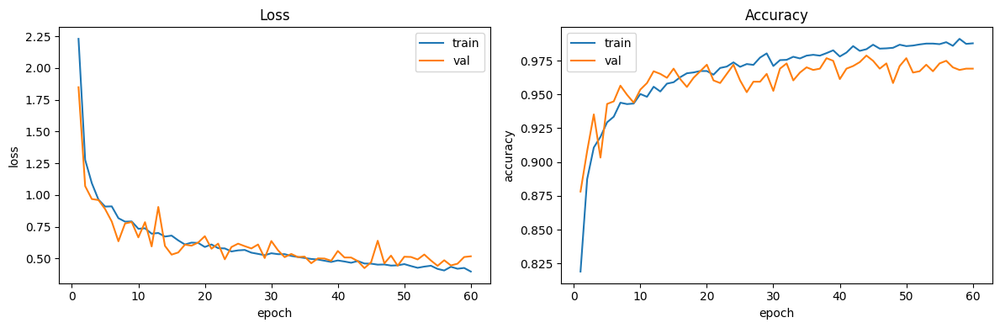

In [ ]:
plot_history(student_history_fitnet)

<Figure size 800x800 with 0 Axes>

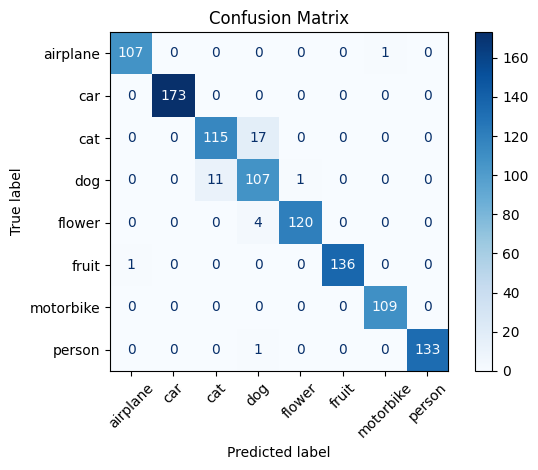

In [ ]:
cm_fitnet_natural = plot_confusion_matrix(
    student_model_natural_trained_fitnet_combined,
    natural_test_loader_student,
    natural_classes_student,
    device
)

Classe Verdadeira: dog
Classe Predita: dog
Confiança: 0.9950
encoder/predictor - LightCNNEncoder: model.encoder.head


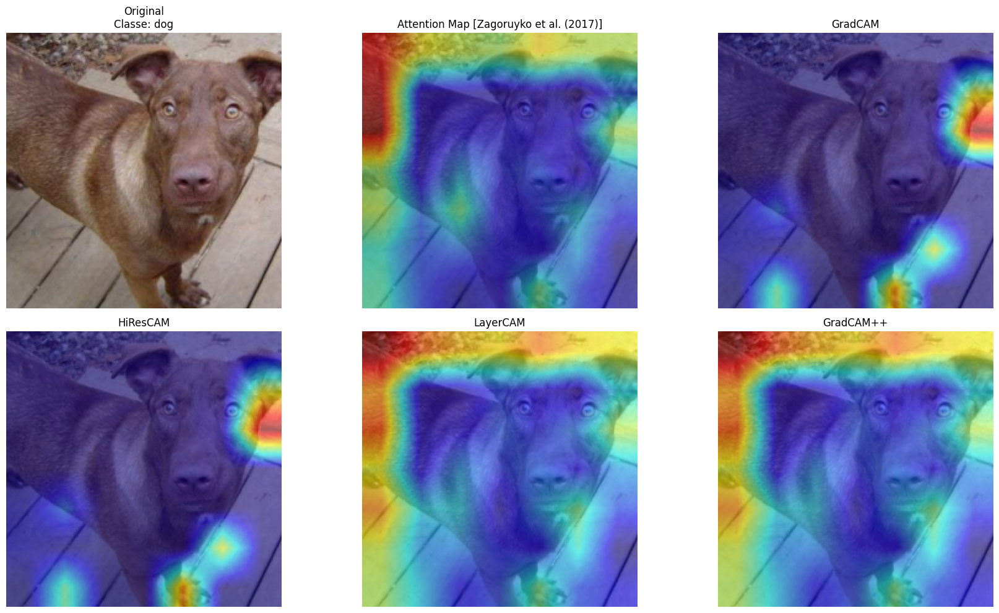

CPU times: user 1.04 s, sys: 37.3 ms, total: 1.08 s
Wall time: 1.21 s


In [ ]:
%%time
predict(student_model_natural_trained_fitnet_combined, DATASET_NATURAL,
        prep_student,
        natural_classes_student,
        device, IMAGE_SAMPLE_NATURAL, xai_method="All")

Extracting features from layer: encoder.head
Processed 10 batches, 320 samples
Processed 20 batches, 640 samples
Processed 30 batches, 960 samples
Feature shape: (1024, 25088)
Using true labels
Projecting 1024 samples with 25088 features using TSNE
PCA reduced features to 30 dimensions


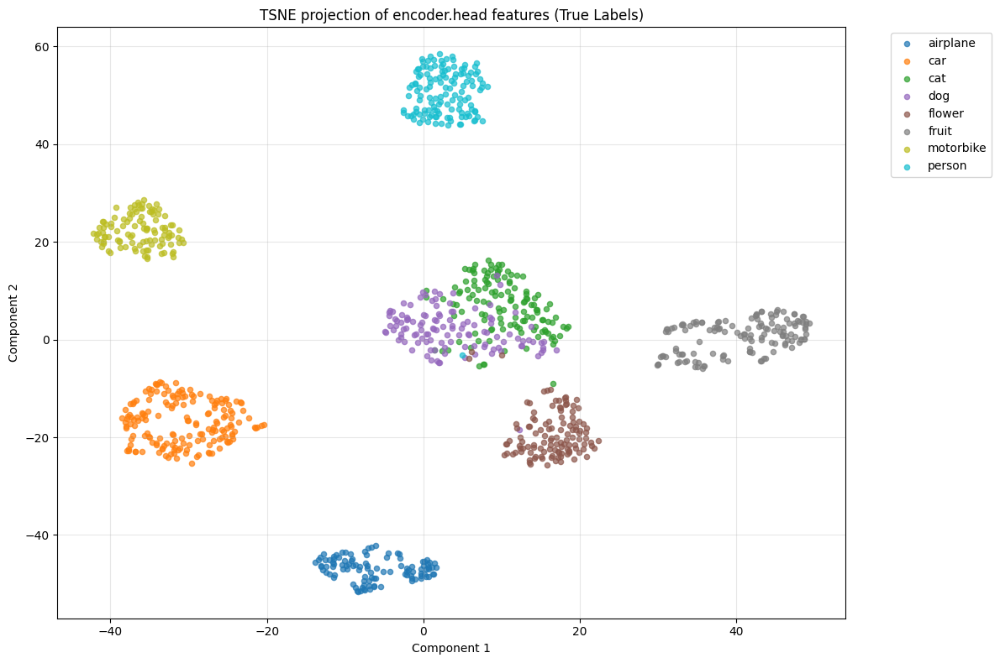

(array([[ -6.682342  , -42.526352  ],
        [  0.69739485, -46.686188  ],
        [ -2.5170934 ,   2.1630125 ],
        ...,
        [ -9.272326  , -43.872368  ],
        [ -8.687406  , -46.054874  ],
        [ 45.889717  ,   0.8066837 ]], dtype=float32),
 array([0, 0, 3, ..., 0, 0, 5]))

In [ ]:
visualize_cnn_features(
    student_model_natural_trained_fitnet_combined,
    natural_test_loader_student,
    #layer_name="encoder.8", # avgpool do ResNet18 dentro do CombinedStudentModel
    layer_name="encoder.head",
    device=device,
    label_names=natural_classes_student
)

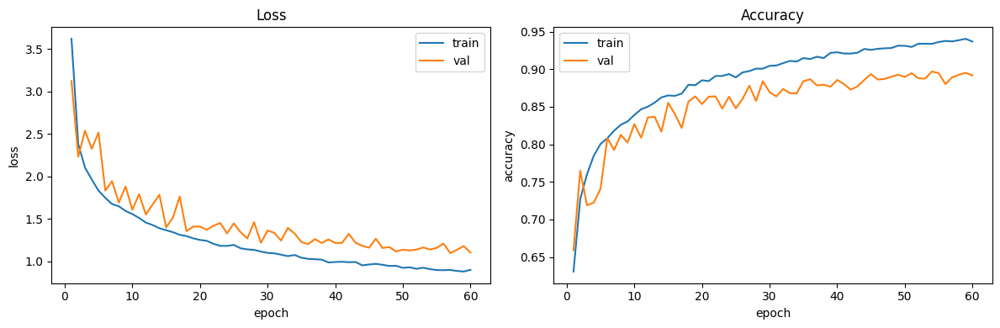

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# FitNet — Garbage
# ──────────────────────────────────────────────────────────────────────────────
plot_history(student_history_garbage_fitnet)

Classe Verdadeira: biological
Classe Predita: biological
Confiança: 0.9815
encoder/predictor - LightCNNEncoder: model.encoder.head


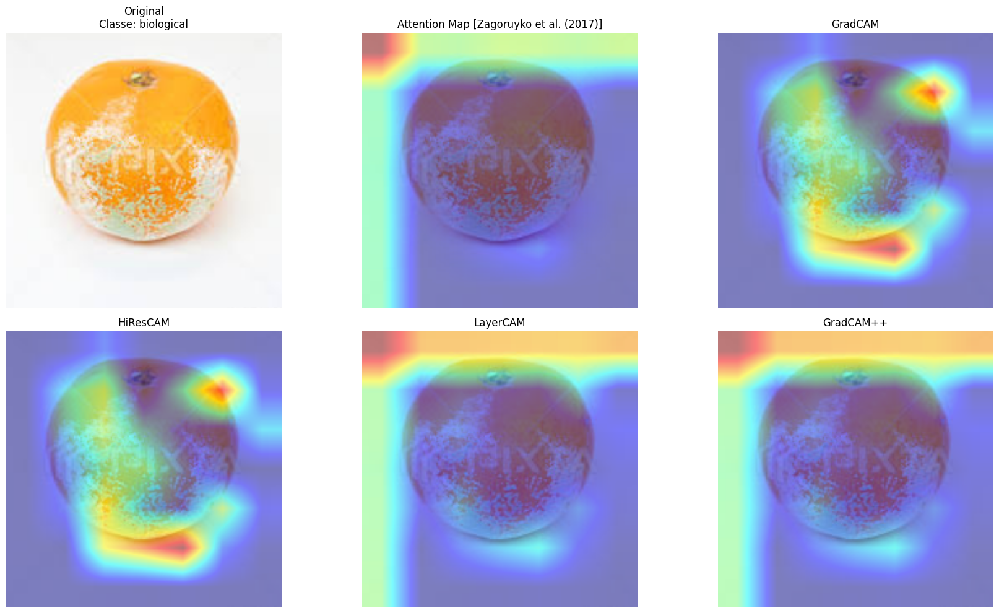

CPU times: user 797 ms, sys: 19.8 ms, total: 817 ms
Wall time: 814 ms


In [ ]:
%%time
predict(student_model_garbage_trained_fitnet_combined, DATASET_GARBAGE,
        prep_student,
        garbage_classes_student,
        device, IMAGE_SAMPLE_GARBAGE, xai_method="All")

<Figure size 800x800 with 0 Axes>

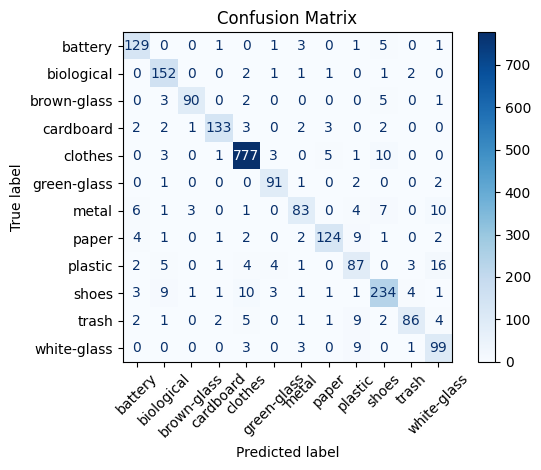

In [ ]:
cm_fitnet_garbage = plot_confusion_matrix(
    student_model_garbage_trained_fitnet_combined,
    garbage_test_loader_student,
    garbage_classes_student,
    device,
)

Extracting features from layer: encoder.head
Processed 10 batches, 320 samples
Processed 20 batches, 640 samples
Processed 30 batches, 960 samples
Feature shape: (1024, 25088)
Using true labels
Projecting 1024 samples with 25088 features using TSNE
PCA reduced features to 30 dimensions


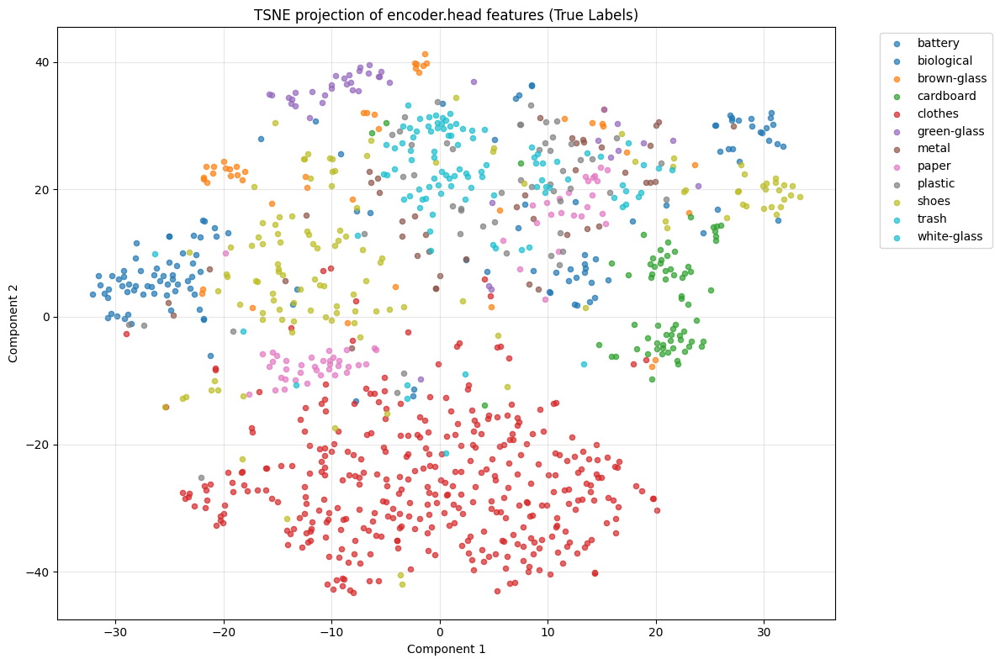

(array([[ -1.8807496, -18.829887 ],
        [-19.3308   ,  10.888846 ],
        [  1.501044 ,  34.36192  ],
        ...,
        [-10.42162  , -41.916843 ],
        [ -7.3869586, -38.59496  ],
        [-11.7028   ,  11.473815 ]], dtype=float32),
 array([4, 9, 9, ..., 4, 4, 9]))

In [ ]:
visualize_cnn_features(
    student_model_garbage_trained_fitnet_combined,
    garbage_test_loader_student,
    #layer_name="encoder.8", # avgpool do ResNet18 dentro do CombinedStudentModel
    layer_name="encoder.head",
    device=device,
    label_names=garbage_classes_student,
)

### MSE

Este parece com o SimKD.

#### (OU) Treinar

In [ ]:
student_encoder, predictor_pregap_mse, _, _ = build_student_and_predictors(teacher_model_natural_trained, device=device)

student_encoder_pregap_mse, student_predictor_pregap_mse, student_history_pregap_mse = train_distillation(
    mode="PREGAP_MSE", #
    teacher=teacher_model_natural_trained,
    classifier=natural_extract_classifier,
    student_encoder=student_encoder,
    predictor=predictor_pregap_mse,
    train_loader=natural_train_loader_student,
    val_loader=natural_val_loader_student,
    epochs=EPOCHS_STUDENT,
    learning_rate=LR,
    device=device
)

Teacher pré-GAP : (2048, 7, 7)
Teacher pós-GAP : 2048
PredictorPreGAP : 512 → 2048×7×7
PredictorPostGAP: 512 → 2048
FitNetRegressor  : 128 → 1024 (block3_student → hint_teacher)
[train_distillation] mode=PREGAP_MSE | predictor=PreGAP
Epoch 01/60 | train loss 1.2239 | train acc 0.6451 | val loss 1.1928 | val acc 0.7582
Epoch 02/60 | train loss 0.9712 | train acc 0.7973 | val loss 0.9014 | val acc 0.8433
Epoch 03/60 | train loss 0.8083 | train acc 0.8430 | val loss 0.7345 | val acc 0.8772
Epoch 04/60 | train loss 0.6899 | train acc 0.8610 | val loss 0.6550 | val acc 0.8849
Epoch 05/60 | train loss 0.6139 | train acc 0.8813 | val loss 0.5436 | val acc 0.8849
Epoch 06/60 | train loss 0.5594 | train acc 0.8909 | val loss 0.5013 | val acc 0.9062
Epoch 07/60 | train loss 0.5269 | train acc 0.9027 | val loss 0.4657 | val acc 0.9304
Epoch 08/60 | train loss 0.5076 | train acc 0.9041 | val loss 0.4567 | val acc 0.9217
Epoch 09/60 | train loss 0.4943 | train acc 0.9078 | val loss 0.4409 | val acc

In [ ]:
# ── Instância dos modelos combinados ──────────────────────────────────────────
student_model_natural_trained_pregap_mse_combined = CombinedStudentModelForMetrics(
    student_encoder_pregap_mse, student_predictor_pregap_mse,
    natural_extract_classifier, mode="encoder_pregap"
)

In [ ]:
torch.save({
    "model_state_dict": student_model_natural_trained_pregap_mse_combined.state_dict(),
    "encoder_state_dict": student_encoder_pregap_mse.state_dict(),
    "predictor_state_dict": student_predictor_pregap_mse.state_dict(),
    "history": student_history_pregap_mse,
    "num_classes": natural_classes_student,
}, PATH + "/student_natural_ResNet50_LightCNN_ExperimentoPregap2_BETTER.pth")

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# Experimento Pré-GAP — Garbage
# ──────────────────────────────────────────────────────────────────────────────
student_encoder_mse, predictor_pregap_mse, _, _ = build_student_and_predictors(teacher_model_garbage_trained, device=device)
student_encoder_garbage_pregap_mse, student_predictor_garbage_pregap_mse, student_history_garbage_pregap_mse = train_distillation(
        mode="PREGAP_MSE", # sem normalizacao
        teacher=teacher_model_garbage_trained,
        classifier=garbage_extract_classifier,
        student_encoder=student_encoder_mse,
        predictor=predictor_pregap_mse,
        train_loader=garbage_train_loader_student,
        val_loader=garbage_val_loader_student,
        epochs=EPOCHS_STUDENT,
        learning_rate=LR,
        device=device,
    )

Teacher pré-GAP : (2048, 7, 7)
Teacher pós-GAP : 2048
PredictorPreGAP : 512 → 2048×7×7
PredictorPostGAP: 512 → 2048
FitNetRegressor  : 128 → 1024 (block3_student → hint_teacher)
[train_distillation] mode=PREGAP_MSE | predictor=PreGAP
Epoch 01/60 | train loss 1.0868 | train acc 0.5131 | val loss 0.8174 | val acc 0.6180
Epoch 02/60 | train loss 0.7174 | train acc 0.6010 | val loss 0.5961 | val acc 0.6644
Epoch 03/60 | train loss 0.5550 | train acc 0.6566 | val loss 0.4868 | val acc 0.7095
Epoch 04/60 | train loss 0.4957 | train acc 0.6837 | val loss 0.4568 | val acc 0.6725
Epoch 05/60 | train loss 0.4780 | train acc 0.7072 | val loss 0.4427 | val acc 0.7194
Epoch 06/60 | train loss 0.4753 | train acc 0.7304 | val loss 0.4403 | val acc 0.7525
Epoch 07/60 | train loss 0.4741 | train acc 0.7295 | val loss 0.4400 | val acc 0.7477
Epoch 08/60 | train loss 0.4724 | train acc 0.7443 | val loss 0.4406 | val acc 0.7632
Epoch 09/60 | train loss 0.4716 | train acc 0.7545 | val loss 0.4388 | val acc

In [ ]:
student_model_garbage_trained_pregap_mse_combined = CombinedStudentModelForMetrics(
    student_encoder_garbage_pregap_mse, student_predictor_garbage_pregap_mse,
    garbage_extract_classifier, mode="encoder_pregap"
)

In [ ]:
torch.save({
    "model_state_dict":     student_model_garbage_trained_pregap_mse_combined.state_dict(),
    "encoder_state_dict":   student_encoder_garbage_pregap_mse.state_dict(),
    "predictor_state_dict": student_predictor_garbage_pregap_mse.state_dict(),
    "history":              student_history_garbage_pregap_mse,
    "num_classes":          garbage_classes_student,
}, PATH + "/student_garbage_ResNet50_LightCNN_ExperimentoPregap2_BETTER.pth")

#### (OU) Carregar

In [ ]:
_, student_encoder_pregap_mse, student_predictor_pregap_mse, student_history_pregap_mse, natural_classes_student = load_student_distillation_model(
    PATH + "/student_natural_ResNet50_LightCNN_ExperimentoPregap2_BETTER.pth", device, mode="all")


In [ ]:
student_encoder_pregap_mse.eval()
student_predictor_pregap_mse.eval()

# Pega um batch do loader de validação
sample_imgs, _ = next(iter(natural_val_loader_student))
sample_imgs = sample_imgs.to(device)

with torch.no_grad():
    feat_before = student_encoder_pregap_mse(sample_imgs) # (B, 512, 1, 1)
    print(f"Formato do feature do estudante antes: {feat_before.shape}")
    feat_after  = student_predictor_pregap_mse(feat_before) # (B, 2048, 7, 7)
    print(f"Formato do feature do estudante depois: {feat_after.shape}")

Formato do feature do estudante antes: torch.Size([32, 512, 1, 1])
Formato do feature do estudante depois: torch.Size([32, 2048, 7, 7])


In [ ]:
# ── Instância dos modelos combinados ──────────────────────────────────────────
student_model_natural_trained_pregap_mse_combined = CombinedStudentModelForMetrics(
    student_encoder_pregap_mse, student_predictor_pregap_mse,
    natural_extract_classifier, mode="encoder_pregap"
)

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# Experimento Pré-GAP — Garbage
# ──────────────────────────────────────────────────────────────────────────────
_, student_encoder_garbage_pregap_mse, student_predictor_garbage_pregap_mse, student_history_garbage_pregap_mse, garbage_classes_student = load_student_distillation_model(
    PATH + "/student_garbage_ResNet50_LightCNN_ExperimentoPregap2_BETTER.pth", device, mode="all", extract_classifier=garbage_extract_classifier)

In [ ]:
student_model_garbage_trained_pregap_mse_combined = CombinedStudentModelForMetrics(
    student_encoder_garbage_pregap_mse, student_predictor_garbage_pregap_mse,
    garbage_extract_classifier, mode="encoder_pregap"
)

#### Visualizar

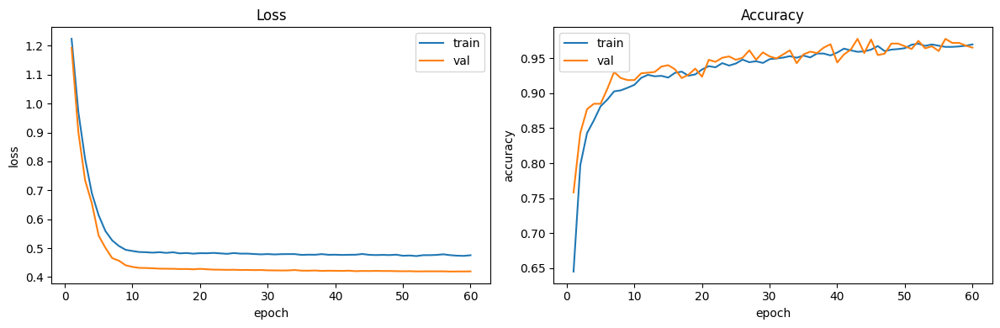

In [ ]:
plot_history(student_history_pregap_mse)

<Figure size 800x800 with 0 Axes>

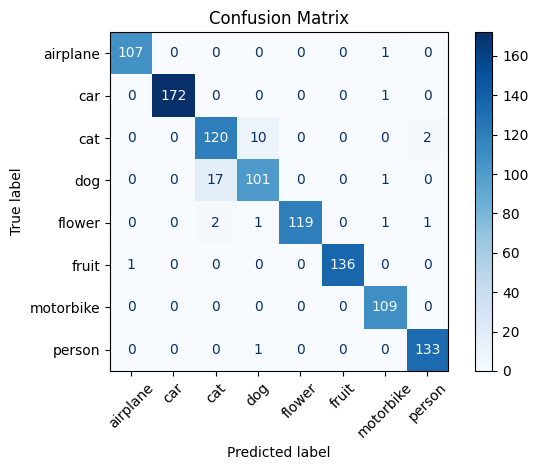

In [ ]:
cm_postgap_natural = plot_confusion_matrix(
    student_model_natural_trained_pregap_mse_combined,
    natural_test_loader_student,
    natural_classes_student,
    device
)

Classe Verdadeira: dog
Classe Predita: dog
Confiança: 0.9965
encoder/predictor - LightCNNEncoder: model.encoder.head


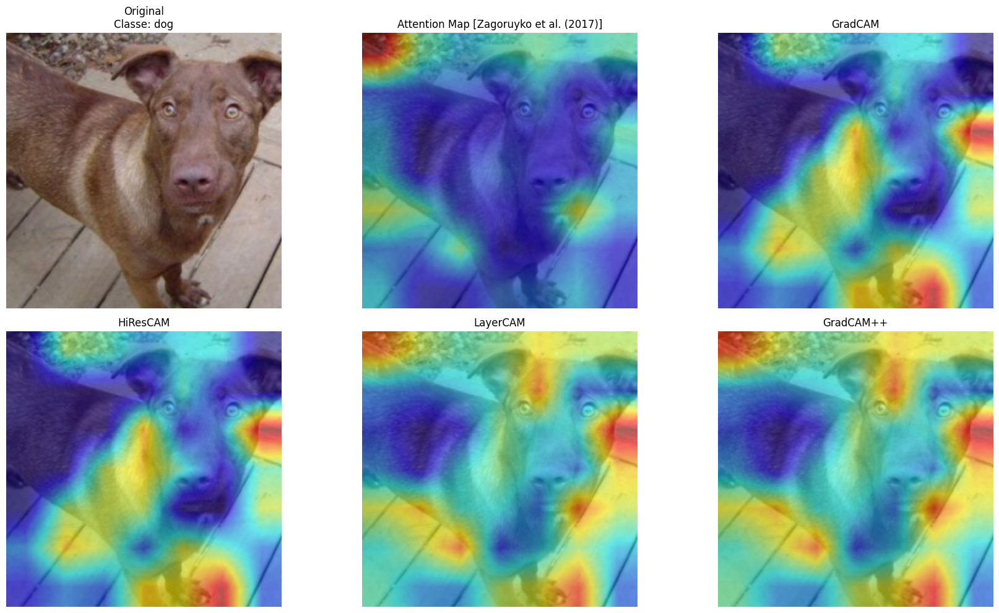

CPU times: user 1.07 s, sys: 23.8 ms, total: 1.1 s
Wall time: 1.09 s


In [ ]:
%%time
predict(student_model_natural_trained_pregap_mse_combined, DATASET_NATURAL,
        prep_student,
        natural_classes_student,
        device, IMAGE_SAMPLE_NATURAL, xai_method="All")

Extracting features from layer: encoder.head
Processed 10 batches, 320 samples
Processed 20 batches, 640 samples
Processed 30 batches, 960 samples
Feature shape: (1024, 25088)
Using true labels
Projecting 1024 samples with 25088 features using TSNE
PCA reduced features to 30 dimensions


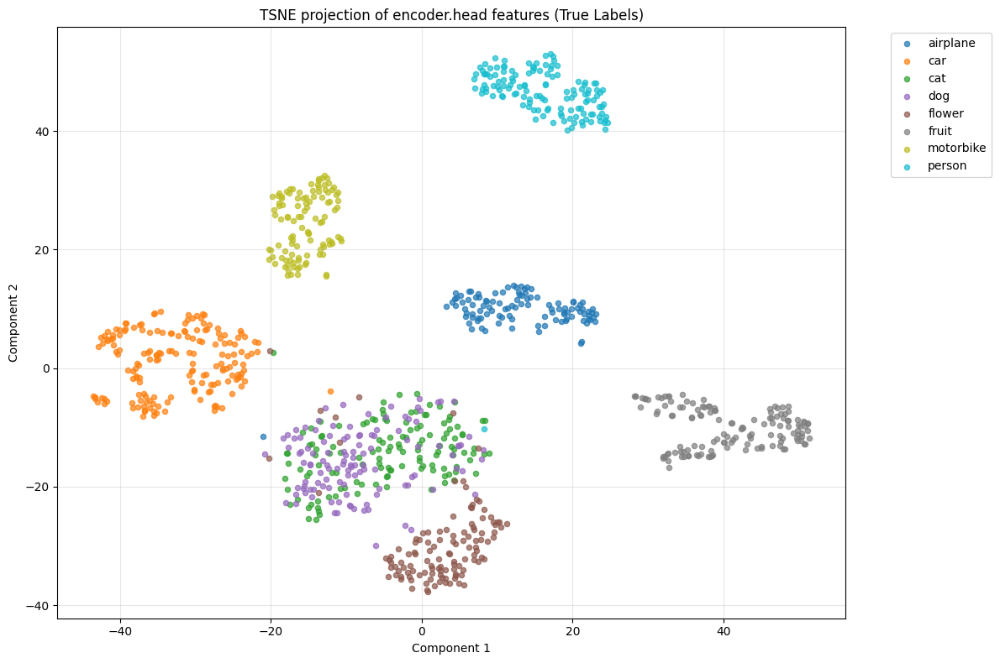

(array([[  6.599899 ,   6.6377273],
        [ 22.169472 ,   8.931966 ],
        [-15.5131   , -19.226648 ],
        ...,
        [  7.957457 ,   6.8132195],
        [  8.607451 ,  11.221051 ],
        [ 46.206306 ,  -8.451813 ]], dtype=float32),
 array([0, 0, 3, ..., 0, 0, 5]))

In [ ]:
visualize_cnn_features(
    student_model_natural_trained_pregap_mse_combined,
    natural_test_loader_student,
    #layer_name="encoder.8", # avgpool do ResNet18 dentro do CombinedStudentModel
    layer_name="encoder.head",
    device=device,
    label_names=natural_classes_student
)

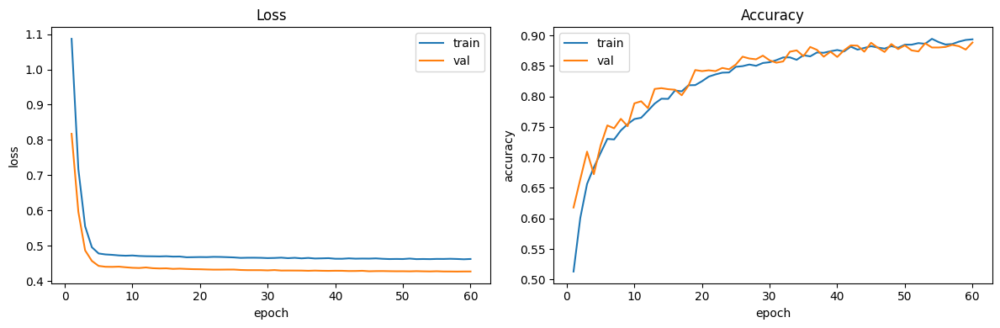

In [ ]:
# ──────────────────────────────────────────────────────────────────────────────
# Experimento Pré-GAP — Garbage
# ──────────────────────────────────────────────────────────────────────────────
plot_history(student_history_garbage_pregap_mse)

<Figure size 800x800 with 0 Axes>

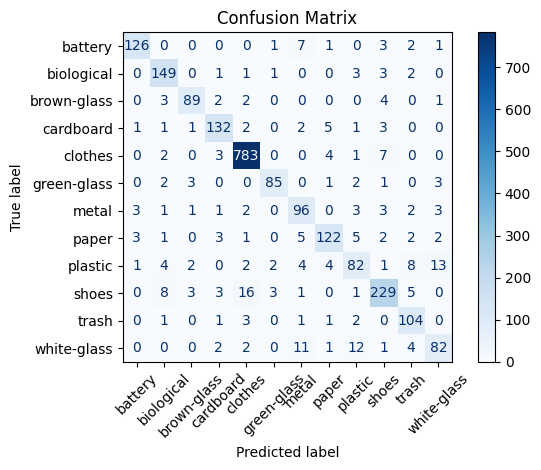

In [ ]:
cm_pregap_garbage = plot_confusion_matrix(
    student_model_garbage_trained_pregap_mse_combined,
    garbage_test_loader_student,
    garbage_classes_student,
    device,
)

Classe Verdadeira: biological
Classe Predita: biological
Confiança: 0.8058
encoder/predictor - LightCNNEncoder: model.encoder.head


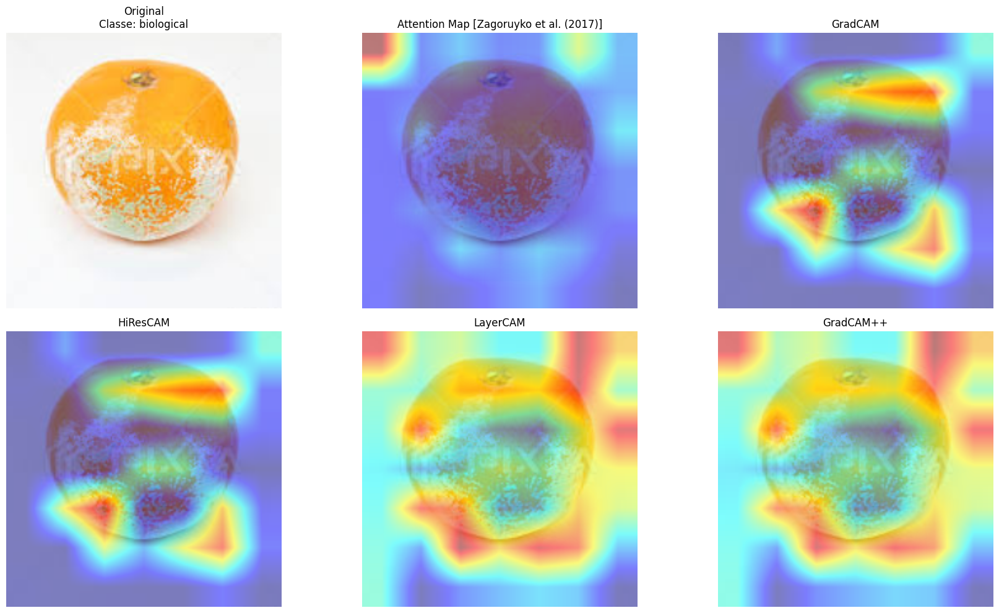

CPU times: user 891 ms, sys: 24.8 ms, total: 915 ms
Wall time: 921 ms


In [ ]:
%%time
predict(student_model_garbage_trained_pregap_mse_combined, DATASET_GARBAGE,
        prep_student,
        garbage_classes_student,
        device, IMAGE_SAMPLE_GARBAGE, xai_method="All")

Extracting features from layer: encoder.head
Processed 10 batches, 320 samples
Processed 20 batches, 640 samples
Processed 30 batches, 960 samples
Feature shape: (1024, 25088)
Using true labels
Projecting 1024 samples with 25088 features using TSNE
PCA reduced features to 30 dimensions


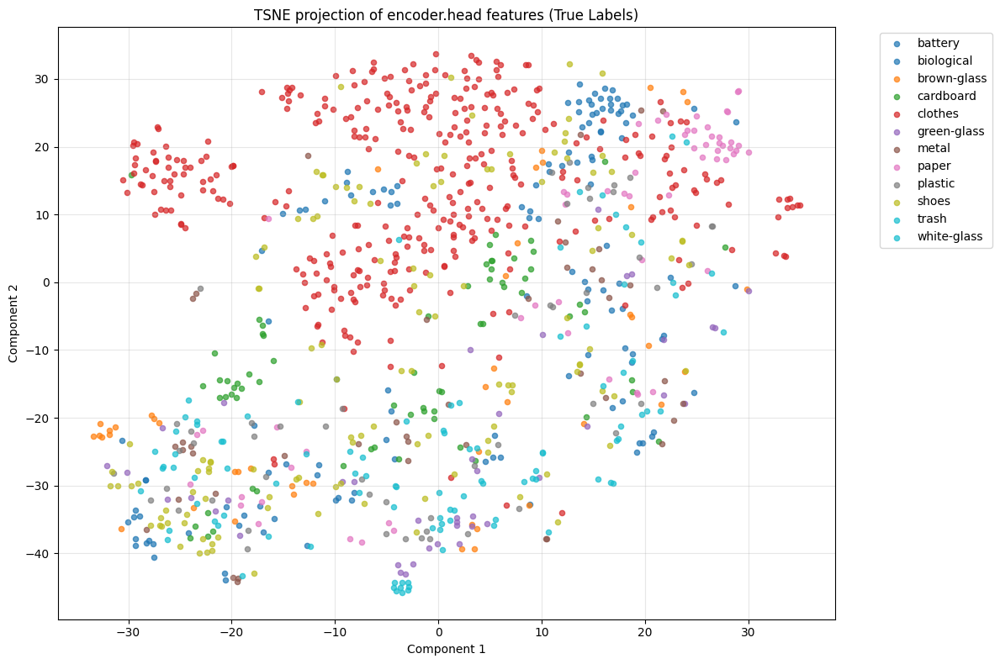

(array([[  4.478349 ,  22.036785 ],
        [  7.901394 , -31.657505 ],
        [-29.867615 , -23.849194 ],
        ...,
        [-14.577935 ,  27.83985  ],
        [-11.720478 ,  24.92117  ],
        [ 23.563955 ,   6.0007534]], dtype=float32),
 array([4, 9, 9, ..., 4, 4, 9]))

In [ ]:
visualize_cnn_features(
    student_model_garbage_trained_pregap_mse_combined,
    garbage_test_loader_student,
    #layer_name="encoder.8", # avgpool do ResNet18 dentro do CombinedStudentModel
    layer_name="encoder.head",
    device=device,
    label_names=garbage_classes_student,
)

### Avaliação

#### Funções de Avaliação

In [ ]:
def get_student_encoder_pre_gap_shape(encoder, input_size=(224, 224)):
    encoder.eval()
    with torch.no_grad():
        dummy_input = torch.randn(1, 3, *input_size).to(device)
        encoder_output = encoder(dummy_input)
        return f"{encoder_output.shape[2]} \u00d7 {encoder_output.shape[3]} \u00d7 {encoder_output.shape[1]}"

In [ ]:
def _print_model_stats_table(title, rows):
    """
    rows: lista de tuplas
      (nome, modelo_ou_encoder, history, dataset_label)
    """
    # Determine crop size based on the type of prep_student
    crop = None
    if hasattr(prep_student, 'crop_size'): # For ImageClassification transforms (e.g., when studentweights is not None)
        crop = prep_student.crop_size[0]
    elif isinstance(prep_student, transforms.Compose): # For Compose transforms (e.g., LightCNN)
        for t in prep_student.transforms:
            if isinstance(t, transforms.CenterCrop):
                crop = t.size
                break
        # Ensure that if it's a list (e.g., [224, 224]), take the first element
        if isinstance(crop, (list, tuple)):
            crop = crop[0]

    if crop is None:
        raise ValueError("Could not determine student input crop size for printing model stats.")

    print("\n" + "═"*105)
    print(f"  {title}")
    print("═"*105)

    header = (
        f"{'| Modelo':<28} | {'Dataset':<12} | {'Parâmetros':>14} | "
        f"{'GFLOPs':>8} | {'Pré-GAP (HxWxC)':>20} | "
        f"{'Val Loss':>10} | {'Val Acc':>9} |"
    )
    sep = f"{'-─'*28}-+-{'-─'*12}-+-{'-─'*14}-+-{'-─'*8}-+-{'-─'*20}-+-{'-─'*10}-+-{'-─'*9}-|"

    print(header)
    print(sep)

    for name, model_obj, history, ds_label in rows:
        params  = count_params(model_obj)
        gflops  = calc_gflops(model_obj, (crop, crop))
        # shape pré-GAP
        if isinstance(model_obj, torchvision.models.ResNet):
            pregap = get_pre_gap_features_shape(model_obj, (crop, crop))
        else:
            try:
                enc = model_obj.encoder
                pregap = get_student_encoder_pre_gap_shape(enc, (crop, crop))
            except Exception:
                pregap = "N/A"

        val_loss = history["best_val_loss"] if history else float("nan")
        val_acc  = history["best_val_acc"]  if history else float("nan")

        print(
            f"| {name:<26} | {ds_label:<12} | {params:>14,} | "
            f"{gflops:>8.2f} | {pregap:>20} | "
            f"{val_loss:>10.4f} | {val_acc:>9.4f} |"
        )
    print(sep)

In [ ]:
def evaluate_full_metrics(model, loader, class_names, device, top_k=3, label="Modelo"):
    model.eval()
    y_true  = []
    y_pred  = []
    y_score = []   # probabilidades para top-k

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            probs  = torch.softmax(logits, dim=1)
            preds  = logits.argmax(dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
            y_score.extend(probs.cpu().numpy())

    y_true  = np.array(y_true)
    y_pred  = np.array(y_pred)
    y_score = np.array(y_score)

    acc         = (y_true == y_pred).mean()
    f1_macro    = f1_score(y_true, y_pred, average="macro",    zero_division=0)
    f1_weighted = f1_score(y_true, y_pred, average="weighted", zero_division=0)
    prec_macro  = precision_score(y_true, y_pred, average="macro",    zero_division=0)
    rec_macro   = recall_score   (y_true, y_pred, average="macro",    zero_division=0)
    kappa = cohen_kappa_score(y_true, y_pred)

    # top-k só faz sentido se k < num_classes
    n_classes = len(class_names)
    k_eff     = min(top_k, n_classes - 1)
    topk_acc  = top_k_accuracy_score(y_true, y_score, k=k_eff) if k_eff >= 2 else acc

    report = classification_report(y_true, y_pred, target_names=class_names, zero_division=0)

    print(f"\n{'═'*60}")
    print(f"  {label}")
    print(f"{'─'*60}")
    print(f"  Accuracy          : {acc:.4f}")
    print(f"  F1 Macro          : {f1_macro:.4f}")
    print(f"  F1 Weighted       : {f1_weighted:.4f}")
    print(f"  Precision Macro   : {prec_macro:.4f}")
    print(f"  Recall Macro      : {rec_macro:.4f}")
    print(f"  Top-{k_eff} Accuracy   : {topk_acc:.4f}")
    print(f"  Cohen's Kappa     : {kappa:.4f}")
    print(f"{'─'*60}")
    print(report)
    print(f"{'═'*60}\n")

    return {
        "accuracy":         acc,
        "f1_macro":         f1_macro,
        "f1_weighted":      f1_weighted,
        "precision_macro":  prec_macro,
        "recall_macro":     rec_macro,
        f"top{k_eff}_accuracy": topk_acc,
        "kappa": kappa,
        "report":           report,
    }

#### Rodar

In [ ]:
student_input_crop_size = None

# Determine crop size based on the type of prep_student
if hasattr(prep_student, 'crop_size'): # For ImageClassification transforms (e.g., when studentweights is not None)
    student_input_crop_size = prep_student.crop_size[0]
elif isinstance(prep_student, transforms.Compose): # For Compose transforms (e.g., LightCNN)
    for t in prep_student.transforms:
        if isinstance(t, transforms.CenterCrop):
            student_input_crop_size = t.size
            break
    # Ensure that if it's a list (e.g., [224, 224]), take the first element
    if isinstance(student_input_crop_size, (list, tuple)):
        student_input_crop_size = student_input_crop_size[0]

if student_input_crop_size is None:
    raise ValueError("Could not determine student input crop size for GFLOPs calculation.")

# Metrics for FitNet student
params_fitnet = count_params(student_model_natural_trained_fitnet_combined)
gflops_fitnet = calc_gflops(student_model_natural_trained_fitnet_combined, (student_input_crop_size, student_input_crop_size))
pre_gap_fitnet = get_student_encoder_pre_gap_shape(student_encoder_fitnet, (student_input_crop_size, student_input_crop_size))

# Metrics for PREGAP student - SKD
params_pregap_mse = count_params(student_model_natural_trained_pregap_mse_combined)
gflops_pregap_mse = calc_gflops(student_model_natural_trained_pregap_mse_combined, (student_input_crop_size, student_input_crop_size))
pre_gap_pregap_mse = get_student_encoder_pre_gap_shape(student_encoder_pregap_mse, (student_input_crop_size, student_input_crop_size))

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# TABELA DE PARÂMETROS / GFLOPs — separada por dataset
# ══════════════════════════════════════════════════════════════════════════════
# ── Natural ───────────────────────────────────────────────────────────────────
rows_natural = [
    ("Student FitNet",              student_model_natural_trained_fitnet_combined, student_history_fitnet, "Natural"),
    ("Student MSE",         student_model_natural_trained_pregap_mse_combined, student_history_pregap_mse, "Natural"),
]
_print_model_stats_table("Parâmetros / GFLOPs — NATURAL IMAGES", rows_natural)

# ── Garbage ───────────────────────────────────────────────────────────────────
rows_garbage = [
    ("Student FitNet",              student_model_garbage_trained_fitnet_combined, student_history_garbage_fitnet, "Garbage"),
    ("Student MSE",         student_model_garbage_trained_pregap_mse_combined, student_history_garbage_pregap_mse, "Natural"),
]
_print_model_stats_table("Parâmetros / GFLOPs — GARBAGE CLASSIFICATION", rows_garbage)


═════════════════════════════════════════════════════════════════════════════════════════════════════════
  Parâmetros / GFLOPs — NATURAL IMAGES
═════════════════════════════════════════════════════════════════════════════════════════════════════════
| Modelo                     | Dataset      |     Parâmetros |   GFLOPs |      Pré-GAP (HxWxC) |   Val Loss |   Val Acc |
-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-|
| Student FitNet             | Natural      |      3,954,584 |     0.24 |          1 × 1 × 512 |     0.4247 |    0.9787 |
| Student MSE                | Natural      |      3,954,584 |     0.24 |          1 × 1 × 512 |     0.4200 |    0.9778 |
-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-+--─-─-─-─-─-─-─-─-─-─-─-

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Avaliação final com métricas completas
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("  AVALIAÇÃO COMPLETA — ResNet50_Lighter PREGAP - TEST SET — DATASET NATURAL")
print("═"*70)

metrics_fitnet = evaluate_full_metrics(
    student_model_natural_trained_fitnet_combined,
    natural_test_loader_student,
    natural_classes_student,
    device,
    top_k=3,
    label="Student FitNet"
)

metrics_PREGAP_mse = evaluate_full_metrics(
    student_model_natural_trained_pregap_mse_combined,
    natural_test_loader_student,
    natural_classes_student,
    device,
    top_k=3,
    label="Student MSE"
)

# ─────────────────────────────────────────────────────────────────────────────
# Evaluate Teacher Models for full metrics
# ─────────────────────────────────────────────────────────────────────────────
teacher_metrics_natural = evaluate_full_metrics(
    teacher_model_natural_trained,
    natural_test_loader_resNet50,
    natural_classes_resNet50,
    device,
    top_k=3,
    label="Teacher (ResNet50 Adam/MSE) - Natural"
)


══════════════════════════════════════════════════════════════════════
  AVALIAÇÃO COMPLETA — ResNet50_Lighter PREGAP - TEST SET — DATASET NATURAL
══════════════════════════════════════════════════════════════════════

════════════════════════════════════════════════════════════
  Student FitNet
────────────────────────────────────────────────────────────
  Accuracy          : 0.9653
  F1 Macro          : 0.9641
  F1 Weighted       : 0.9656
  Precision Macro   : 0.9644
  Recall Macro      : 0.9643
  Top-3 Accuracy   : 0.9990
  Cohen's Kappa     : 0.9602
────────────────────────────────────────────────────────────
              precision    recall  f1-score   support

    airplane       0.99      0.99      0.99       108
         car       1.00      1.00      1.00       173
         cat       0.91      0.87      0.89       132
         dog       0.83      0.90      0.86       119
      flower       0.99      0.97      0.98       124
       fruit       1.00      0.99      1.00       137

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# AVALIAÇÃO COMPLETA — TEST SET — GARBAGE
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "═"*70)
print("  AVALIAÇÃO COMPLETA — ResNet50_Lighter PREGAP - DATASET GARBAGE")
print("═"*70)

metrics_garbage_fitnet = evaluate_full_metrics(
    student_model_garbage_trained_fitnet_combined, garbage_test_loader_student,
    garbage_classes_student, device, top_k=3, label="Student FitNet")

metrics_garbage_PREGAP_mse = evaluate_full_metrics(
    student_model_garbage_trained_pregap_mse_combined, garbage_test_loader_student,
    garbage_classes_student, device, top_k=3, label="Student Pré-GAP (MSE)")

# ─────────────────────────────────────────────────────────────────────────────
# Evaluate Teacher Models for full metrics
# ─────────────────────────────────────────────────────────────────────────────
teacher_metrics_garbage = evaluate_full_metrics(
    teacher_model_garbage_trained,
    garbage_test_loader_resNet50,
    garbage_classes_resNet50,
    device,
    top_k=3,
    label="Teacher (ResNet50 Adam/MSE) - Garbage"
)


══════════════════════════════════════════════════════════════════════
  AVALIAÇÃO COMPLETA — ResNet50_Lighter PREGAP - DATASET GARBAGE
══════════════════════════════════════════════════════════════════════

════════════════════════════════════════════════════════════
  Student FitNet
────────────────────────────────────────────────────────────
  Accuracy          : 0.8956
  F1 Macro          : 0.8637
  F1 Weighted       : 0.8953
  Precision Macro   : 0.8700
  Recall Macro      : 0.8612
  Top-3 Accuracy   : 0.9772
  Cohen's Kappa     : 0.8753
────────────────────────────────────────────────────────────
              precision    recall  f1-score   support

     battery       0.87      0.91      0.89       141
  biological       0.85      0.95      0.90       160
 brown-glass       0.95      0.89      0.92       101
   cardboard       0.95      0.90      0.92       148
     clothes       0.96      0.97      0.97       800
 green-glass       0.88      0.94      0.91        97
       met

In [ ]:
# ══════════════════════════════════════════════════════════════════════════════
# TABELAS RESUMO — SEPARADAS POR DATASET
# ══════════════════════════════════════════════════════════════════════════════

def _print_metrics_table(title, metrics_dict):
    """Imprime tabela formatada de métricas."""
    print("\n" + "═"*95)
    print(f"  {title}")
    print("═"*95)

    header = (
        f"{'| Modelo':<30} | {'Acc':>7} | {'F1-Macro':>9} | "
        f"{'F1-Weight':>10} | {'Prec-Mac':>9} | {'Rec-Mac':>8} | "
        f"{'Top-K Acc':>10} | {'Kappa':>7} |"
    )
    sep = (
        f"{'-'*30}-+-{'-'*7}-+-{'-'*9}-+-{'-'*10}-+-{'-'*9}"
        f"-+-{'-'*8}-+-{'-'*10}-+-{'-'*7}-|"
    )
    print(header)
    print(sep)

    for name, m in metrics_dict.items():
        k_key = [k for k in m if k.startswith("top") and k.endswith("accuracy")][0]
        print(
            f"| {name:<28} | "
            f"{m['accuracy']:>7.4f} | "
            f"{m['f1_macro']:>9.4f} | "
            f"{m['f1_weighted']:>10.4f} | "
            f"{m['precision_macro']:>9.4f} | "
            f"{m['recall_macro']:>8.4f} | "
            f"{m[k_key]:>10.4f} | "
            f"{m['kappa']:>7.4f} |"
        )
    print(sep)

In [ ]:
# ── Tabela Natural ────────────────────────────────────────────────────────────
all_metrics_natural = {
    "Teacher (ResNet50 Adam/MSE)": teacher_metrics_natural,
    "Student FitNet":              metrics_fitnet,
    "Student MSE":         metrics_PREGAP_mse,
}

_print_metrics_table("Tabela Resumo - ResNet50_Lighter PREGAP — Métricas no Test Set — NATURAL IMAGES", all_metrics_natural)

# ── Tabela Garbage ────────────────────────────────────────────────────────────
all_metrics_garbage = {
    "Teacher (ResNet50 Adam/MSE)": teacher_metrics_garbage,
    "Student FitNet":              metrics_garbage_fitnet,
    "Student MSE":         metrics_garbage_PREGAP_mse,
}

_print_metrics_table("Tabela Resumo - ResNet50_Lighter PREGAP — Métricas no Test Set — GARBAGE CLASSIFICATION", all_metrics_garbage)


═══════════════════════════════════════════════════════════════════════════════════════════════
  Tabela Resumo - ResNet50_Lighter PREGAP — Métricas no Test Set — NATURAL IMAGES
═══════════════════════════════════════════════════════════════════════════════════════════════
| Modelo                       |     Acc |  F1-Macro |  F1-Weight |  Prec-Mac |  Rec-Mac |  Top-K Acc |   Kappa |
-------------------------------+---------+-----------+------------+-----------+----------+------------+---------|
| Teacher (ResNet50 Adam/MSE)  |  0.9952 |    0.9949 |     0.9952 |    0.9951 |   0.9948 |     1.0000 |  0.9945 |
| Student FitNet               |  0.9653 |    0.9641 |     0.9656 |    0.9644 |   0.9643 |     0.9990 |  0.9602 |
| Student MSE                  |  0.9624 |    0.9609 |     0.9624 |    0.9613 |   0.9610 |     0.9981 |  0.9568 |
-------------------------------+---------+-----------+------------+-----------+----------+------------+---------|

════════════════════════════════════════